<a href="https://colab.research.google.com/github/rajeshkpandey/AWESOME-FER/blob/master/Epidemics_ABM_python_latest_symptom_isolation_viral.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

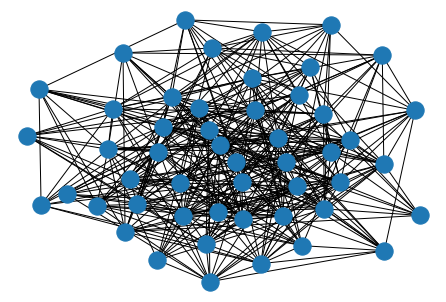

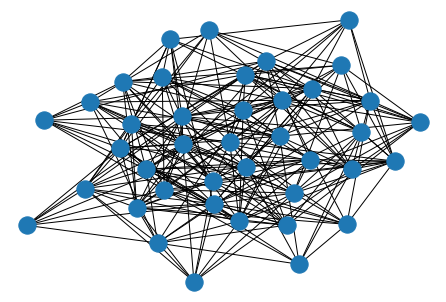

In [1]:
#Erdos-Renyi Graph in Networkx
import numpy as np
from statistics import mean
import random
import copy
from networkx import nx
import matplotlib.pyplot as plt

N = 50  # 50 Indian Cities
K = 10000  # 10000 Agents(people under observation on SIR modeling)
#M = 30  # 30 Edges
NN = 40 # 40 nodes (contact places) of Cities
NUM_TESTS  = K/3 #Number of test available
PAS = 0.2 #Probability of Asymptomatic
PS = 1 - PAS #Probability of Not Asymptomatic(i.e. Symptomatic)


#Graph = nx.gnm_random_graph(N, M)

P = .3      #Probabibilty for Node Connection in random graph
PP = .3
Graph = nx.erdos_renyi_graph(N,P) # Use Networkx to generate a random graph of N nodes being connected with probability P.
GraphN = nx.erdos_renyi_graph(NN,PP)


nx.draw(Graph)
plt.show()
nx.draw(GraphN)
plt.show()

In [2]:
#A = nx.adjacency_matrix(Graph)
#Adjacency_matrix = A.todense()
#AN = nx.adjacency_matrix(GraphN)
#Adjacency_matrixN = AN.todense()
#print(Adjacency_matrix)
#print(Adjacency_matrixN)

In [3]:
#Empty Node Dictionary [ A Dictionary consisting list of agent states on Graph Nodes]
Node = {}
print(Node)
for i in range(N):
  for j in range(NN):
    Node[i*NN+j] = list()
print(Node)
print(len(Node))


{}
{0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [], 11: [], 12: [], 13: [], 14: [], 15: [], 16: [], 17: [], 18: [], 19: [], 20: [], 21: [], 22: [], 23: [], 24: [], 25: [], 26: [], 27: [], 28: [], 29: [], 30: [], 31: [], 32: [], 33: [], 34: [], 35: [], 36: [], 37: [], 38: [], 39: [], 40: [], 41: [], 42: [], 43: [], 44: [], 45: [], 46: [], 47: [], 48: [], 49: [], 50: [], 51: [], 52: [], 53: [], 54: [], 55: [], 56: [], 57: [], 58: [], 59: [], 60: [], 61: [], 62: [], 63: [], 64: [], 65: [], 66: [], 67: [], 68: [], 69: [], 70: [], 71: [], 72: [], 73: [], 74: [], 75: [], 76: [], 77: [], 78: [], 79: [], 80: [], 81: [], 82: [], 83: [], 84: [], 85: [], 86: [], 87: [], 88: [], 89: [], 90: [], 91: [], 92: [], 93: [], 94: [], 95: [], 96: [], 97: [], 98: [], 99: [], 100: [], 101: [], 102: [], 103: [], 104: [], 105: [], 106: [], 107: [], 108: [], 109: [], 110: [], 111: [], 112: [], 113: [], 114: [], 115: [], 116: [], 117: [], 118: [], 119: [], 120: [], 121: [], 122: [],

In [4]:
#Adding Viral_Index Randomly
for i in range(N):
  for j in range(NN):
    Viral_load=0
    Node[i*NN+j].append({'Viral_load' : Viral_load})
    Node[i*NN+j].append({'S' : 0})
    Node[i*NN+j].append({'I' : 0})
    Node[i*NN+j].append({'R' : 0})
    #Node[i*NN+j].append({'ISOLATED_S' : 0})
    Node[i*NN+j].append({'ISOLATED_I' : 0})   
print(Node)
print(len(Node))


{0: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 1: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 2: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 3: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 4: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 5: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 6: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 7: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 8: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 9: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 10: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 11: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 12: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}], 13: [{'Viral_load': 0}, {'S': 0}, {'I': 0}, {'R

In [5]:
#Initailizing randomly infection state [0 shows Susceptible, 1 shows Infected, and 2 shows Recovered]
Agent = {}
for k in range(K):
  Agent[k] = list() 
for k in range(K):
  Rand_node=random.randint(0,N-1)
  Neighbors = list(Graph.neighbors(Rand_node))
  Rand_nodeN=random.randint(0,NN-1)
  First_nodeN = random.randint(0,NN-1)
  Second_nodeN = random.randint(0,NN-1)
  Rand_state=random.choices([0,1],weights=(98,2),k=1)[0]
  Rand_neighbors = list(GraphN.neighbors(Rand_nodeN))
  Rand_neighbors1 = list(GraphN.neighbors(First_nodeN))
  Rand_neighbors2 = list(GraphN.neighbors(Second_nodeN))
  if len(Rand_neighbors) > 0:
    Rand_nodeN1=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN1)
  else:
    Rand_nodeN1=Rand_nodeN
  
  if len(Rand_neighbors) > 0:
    Rand_nodeN2=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN2)
    if Rand_nodeN2 not in list(GraphN.neighbors(Rand_nodeN1)):
      Rand_nodeN2=Rand_nodeN1
  else:
    Rand_nodeN2=Rand_nodeN1

  Symptom = random.choices([0,1],weights=(PAS,PS), k=1)[0]
  Isolate = 0

  Agent[k].append({'Symptom' : Symptom, 'Isolate' : Isolate})
  
  if Rand_state == 0:
    Node[Rand_node*NN+Rand_nodeN][1]['S']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : [Rand_state,0,0]})
    Agent[k].append({'State' : Rand_state})
  elif Rand_state == 1:
    Node[Rand_node*NN+Rand_nodeN][2]['I']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : [Rand_state,Symptom,Isolate], 'C' : 0})
    Agent[k].append({'State' : Rand_state, 'C' : 0 })

  Agent[k].append({'Home_node' : Rand_node})
  Agent[k].append({'Home_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
  
  if len(Neighbors) > 0:
    First_node = random.choice(Neighbors)
    Neighbors.remove(First_node)
  else:
    First_node = Rand_node
  if len(Neighbors) > 0:
    Second_node = random.choice(Neighbors)
  else:
    Second_node = Rand_node

  if len(Rand_neighbors1) > 0:
    First_nodeN1=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN1)
  else:
    First_nodeN1=First_nodeN
  
  if len(Rand_neighbors1) > 0:
    First_nodeN2=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN2)
    if First_nodeN2 not in list(GraphN.neighbors(First_nodeN1)):
      First_nodeN2=First_nodeN1
  else:
    First_nodeN2=First_nodeN1

  if len(Rand_neighbors2) > 0:
    Second_nodeN1=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN1)
  else:
    Second_nodeN1=Second_nodeN
  
  if len(Rand_neighbors2) > 0:
    Second_nodeN2=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN2)
    if Second_nodeN2 not in list(GraphN.neighbors(Second_nodeN1)):
      Second_nodeN2=Second_nodeN1
  else:
    Second_nodeN2=Second_nodeN1

  Agent[k].append({'First_node' : First_node})
  Agent[k].append({'First_nodeN' : [First_nodeN, First_nodeN1, First_nodeN2]})
  Agent[k].append({'Second_node' : Second_node})
  Agent[k].append({'Second_nodeN' : [Second_nodeN, Second_nodeN1, Second_nodeN2]})
  Agent[k].append({'Current_node' : Rand_node})
  Agent[k].append({'Current_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
print(Node)
print(Agent)

{0: [{'Viral_load': 0}, {'S': 4}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}, {1081: [0, 0, 0]}, {1352: [0, 0, 0]}, {4772: [0, 0, 0]}, {8638: [0, 0, 0]}], 1: [{'Viral_load': 0}, {'S': 6}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}, {709: [0, 0, 0]}, {2322: [0, 0, 0]}, {3658: [0, 0, 0]}, {5071: [0, 0, 0]}, {5978: [0, 0, 0]}, {6127: [0, 0, 0]}], 2: [{'Viral_load': 0}, {'S': 7}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}, {623: [0, 0, 0]}, {1391: [0, 0, 0]}, {2030: [0, 0, 0]}, {6287: [0, 0, 0]}, {6448: [0, 0, 0]}, {6604: [0, 0, 0]}, {9957: [0, 0, 0]}], 3: [{'Viral_load': 0}, {'S': 4}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}, {3966: [0, 0, 0]}, {4963: [0, 0, 0]}, {7131: [0, 0, 0]}, {8764: [0, 0, 0]}], 4: [{'Viral_load': 0}, {'S': 5}, {'I': 1}, {'R': 0}, {'ISOLATED_I': 0}, {1035: [0, 0, 0]}, {1890: [0, 0, 0]}, {3932: [0, 0, 0]}, {4865: [0, 0, 0]}, {5390: [1, 1, 0], 'C': 0}, {7668: [0, 0, 0]}], 5: [{'Viral_load': 0}, {'S': 5}, {'I': 0}, {'R': 0}, {'ISOLATED_I': 0}, {1192: [0, 0, 0]}, {2327: [0, 0, 0]}, {7014

In [6]:
print(len(Graph.nodes))
print(len(GraphN.nodes))

50
40


In [7]:
#Random Walk Implementation
def random_walk(Graph=Graph, GraphN=GraphN, Node=Node, Agent=Agent, num_walks=1, num_steps=1, num_tests=K):
    walks = list()
    Node_next = {}
    Agent_next = {}
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j] = list() 
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j].append({'Viral_load' : copy.deepcopy(Node[i*len(GraphN.nodes)+j][0]['Viral_load']*.5)})
        Node_next[i*len(GraphN.nodes)+j].append({'S' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'I' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'R' : 0})
        #Node_next[i*len(GraphN.nodes)+j].append({'ISOLATED_S' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'ISOLATED_I' : 0})
    for i in range(len(Agent)):
      Agent_next[i] = list()
    Agent_next = copy.deepcopy(Agent)
    count_nomove=0
    count_move_first=0
    count_move_second=0
    count_stay_home=0
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        for agent in list(range(5,len(Node[i*len(GraphN.nodes)+j]))):
          a_id = list(Node[i*len(GraphN.nodes)+j][agent].keys())[0]
          #print(a_id)
          #print(Agent[a_id])
          for walk in range(num_walks):
              curr_walk = [i*len(GraphN.nodes)+j]
              cur = i*len(GraphN.nodes)+j
              for step in range(num_steps):
                  neighbors = []
                  neighbors.append(Agent_next[a_id][2]['Home_node'])
                  neighbors.append(Agent_next[a_id][4]['First_node'])
                  neighbors.append(Agent_next[a_id][6]['Second_node'])

                  if len(neighbors) > 0:  
                      I1=(Node[Agent_next[a_id][5]['First_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][5]['First_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][5]['First_nodeN'][2]][2]['I'])
                      I2=(Node[Agent_next[a_id][7]['Second_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][7]['Second_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][7]['Second_nodeN'][2]][2]['I'])
                      IH=(Node[Agent_next[a_id][3]['Home_nodeN'][0]][2]['I'] +  Node[Agent_next[a_id][3]['Home_nodeN'][1]][2]['I'] + Node[Agent_next[a_id][3]['Home_nodeN'][2]][2]['I'])
                      V1 = (Node[Agent_next[a_id][5]['First_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][5]['First_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][5]['First_nodeN'][2]][0]['Viral_load'])
                      V2 = (Node[Agent_next[a_id][7]['Second_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][7]['Second_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][7]['Second_nodeN'][2]][0]['Viral_load'])
                      VH = (Node[Agent_next[a_id][3]['Home_nodeN'][0]][0]['Viral_load'] + Node[Agent_next[a_id][3]['Home_nodeN'][1]][0]['Viral_load'] + Node[Agent_next[a_id][3]['Home_nodeN'][2]][0]['Viral_load'])
                      P1 = I1/(I1**2 + .01) + V1/(V1**2+.01)
                      P2 = I2/(I2**2 + .01) + V2/(V2**2+.01)
                      PH = IH/(IH**2 + .01) + VH/(VH**2+.01)
                      if max(P1,P2,PH) == PH:
                        PH = 3*PH
                        P1 = P1/3
                        P2 = P2/3
                      elif max(P1,P2,PH) == P1:
                        P1 = P1
                        P2 = P2
                        PH = 3*PH
                      else:
                        P1 = P1
                        P2 = P2
                        PH = 3*PH
                      P = P1 + P2 + PH                      
                      if P == 0:
                        PNN1 = 1
                        PNN2 = 0
                        PNN3 = 0
                      else:
                        PNN1 = PH/P 
                        PNN2 = P1/P
                        PNN3 = P2/P 
                      #next = random.choices(neighbors,weights=(PNN1,PNN2,PNN3), k=1)[0] 
                      next = random.choices(neighbors,weights=(.95,.025,.025), k=1)[0]
                      if next == Agent_next[a_id][8]['Current_node']:
                        #print("no movement")
                        count_nomove+=1

                      else:
                        if next == Agent_next[a_id][4]['First_node']:
                          Agent_next[a_id][8]['Current_node'] = Agent_next[a_id][4]['First_node']
                          Agent_next[a_id][9]['Current_nodeN'][0] = Agent_next[a_id][5]['First_nodeN'][0]
                          Agent_next[a_id][9]['Current_nodeN'][1] = Agent_next[a_id][5]['First_nodeN'][1]
                          Agent_next[a_id][9]['Current_nodeN'][2] = Agent_next[a_id][5]['First_nodeN'][2]
                          count_move_first+=1
                        elif next == Agent_next[a_id][6]['Second_node']:
                          Agent_next[a_id][8]['Current_node'] = Agent_next[a_id][6]['Second_node']
                          Agent_next[a_id][9]['Current_nodeN'][0] = Agent_next[a_id][7]['Second_nodeN'][0]
                          Agent_next[a_id][9]['Current_nodeN'][1] = Agent_next[a_id][7]['Second_nodeN'][1]
                          Agent_next[a_id][9]['Current_nodeN'][2] = Agent_next[a_id][7]['Second_nodeN'][2]
                          count_move_second+=1
                        elif next == Agent_next[a_id][2]['Home_node']:
                          Agent_next[a_id][8]['Current_node'] = Agent_next[a_id][2]['Home_node']
                          Agent_next[a_id][9]['Current_nodeN'][0] = Agent_next[a_id][3]['Home_nodeN'][0]
                          Agent_next[a_id][9]['Current_nodeN'][1] = Agent_next[a_id][3]['Home_nodeN'][1]
                          Agent_next[a_id][9]['Current_nodeN'][2] = Agent_next[a_id][3]['Home_nodeN'][2]
                          count_stay_home+=1
                      I2 = Node[Agent_next[a_id][9]['Current_nodeN'][1]][2]['I']
                      I3 = Node[Agent_next[a_id][9]['Current_nodeN'][2]][2]['I']
                      I1 = Node[Agent_next[a_id][9]['Current_nodeN'][0]][2]['I']
                      V2 = Node[Agent_next[a_id][9]['Current_nodeN'][1]][0]['Viral_load']
                      V3 = Node[Agent_next[a_id][9]['Current_nodeN'][2]][0]['Viral_load']
                      V1 = Node[Agent_next[a_id][9]['Current_nodeN'][0]][0]['Viral_load']
                      P2 = I2/(I2**2 + .01) + V2/(V2**2+.01)
                      P3 = I3/(I3**2 + .01) + V3/(V3**2+.01)
                      P1 = I1/(I1**2 + .01) + V1/(V1**2+.01)
                      if max(P1,P2,P3) == P1:
                        P1 = 3*P1
                        P2 = P2
                        P3 = P3
                      elif max(P1,P2,P3) == P2:
                        P1 = 3*P1
                        P2 = 2*P2
                        P3 = P1
                      else:
                        P1 = 3*P1
                        P2 = P2
                        P3 = 2*P3
                      P = P1+P2+P3
                      if P == 0:
                        PNN1 = 1
                        PNN2 = 0
                        PNN3 = 0
                      else:
                        PNN1=P1/P
                        PNN2=P2/P
                        PNN3=P3/P
                       
                      #nextn = random.choices(Agent_next[a_id][8]['Current_nodeN'],weights=(PNN1,PNN2,PNN3),k=1)[0]
                      nextn = random.choices(Agent_next[a_id][9]['Current_nodeN'],weights=(.90,.05,.05),k=1)[0]                    
                  nex = next*len(GraphN.nodes)+nextn
          Node_next[nex].append(copy.deepcopy(Node[cur][agent]))
          if Node[cur][agent][a_id][0] == 0:
            Node_next[nex][1]['S']+=1
          elif Node[cur][agent][a_id][0] == 1:
            Node_next[nex][2]['I']+=1
            Node_next[nex][-1]['C']+=1
            if nex != cur:
              Node_next[cur][0]['Viral_load']+=1
          elif Node[cur][agent][a_id][0] == 2:
            Node_next[nex][3]['R']+=1

          if Node[cur][agent][a_id][2] == 1:
            if Node[cur][agent][a_id][0] == 1:
              Node_next[nex][4]['ISOLATED_I']+=1

          
          curr_walk.append(nex)
          walks.append(nex)

    #print(Node_next)
    #print(Agent_next)

    #State-transition-logic
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        count_SI=0
        count_IR=0
        Total = Node_next[i*len(GraphN.nodes)+j][1]['S']  + Node_next[i*len(GraphN.nodes)+j][2]['I'] - Node_next[i*len(GraphN.nodes)+j][4]['ISOLATED_I'] + Node_next[i*len(GraphN.nodes)+j][3]['R'] + 1
        W1 = (Node_next[i*len(GraphN.nodes)+j][2]['I'] - Node_next[i*len(GraphN.nodes)+j][4]['ISOLATED_I'] + Node_next[i*len(GraphN.nodes)+j][0]['Viral_load'])/Total
        W2 = (Node_next[i*len(GraphN.nodes)+j][1]['S'] + Node_next[i*len(GraphN.nodes)+j][3]['R'] - 1)/Total
        for agent in list(range(5,len(Node_next[i*len(GraphN.nodes)+j]))):
          a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
          if Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 0:
            Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] = random.choices([1,0], weights=(W1,W2), k=1)[0] 
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 1:
              count_SI+=1
              Node_next[i*len(GraphN.nodes)+j][agent].update({'C' : 0})
              Node_next[i*len(GraphN.nodes)+j][agent][a_id][1] = random.choices([0,1],weights=(PAS,PS), k=1)[0]
              Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] = 0
              Agent_next[a_id][1]['State'] = 1
          elif Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 1:
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] != 1:
              if Node_next[i*len(GraphN.nodes)+j][agent]['C'] == 4:  #Time-steps of 4 to get cured(I -> R)
                Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] = 2
                count_IR+=1
                Agent_next[a_id][1]['State'] = 2
                Node_next[i*len(GraphN.nodes)+j][agent].pop('C') 
            elif Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] == 1:
              Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] = 2
              count_IR+=1
              Agent_next[a_id][1]['State'] = 2
              Node_next[i*len(GraphN.nodes)+j][agent].pop('C')

        Node_next[i*len(GraphN.nodes)+j][1]['S']-=count_SI
        Node_next[i*len(GraphN.nodes)+j][2]['I']+=(count_SI - count_IR)
        Node_next[i*len(GraphN.nodes)+j][3]['R']+=count_IR 

    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        agents=list(range(5,len(Node_next[i*len(GraphN.nodes)+j])))
        for agent in agents:
          a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
          if num_tests > 0:
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id][1] == 1:
              num_tests=num_tests - 1  
              if Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 1:
                num_tests=num_tests + 1 
                for agent in agents:
                  a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
                  num_tests=num_tests - 1
                  if Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 1:
                    if Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] == 0:
                      Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] = 1
                break 
            

            #elif Node_next[i*len(GraphN.nodes)+j][agent][a_id][1] == 0:
            #  p = random.choices([0,1],weights=(PAS,PS), k=1)[0]
            #  if p == 0:
            #    num_tests=num_tests - 1
            #    if Node_next[i*len(GraphN.nodes)+j][agent][a_id][0] == 1:
            #      if Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] == 0:
            #        Node_next[i*len(GraphN.nodes)+j][agent][a_id][2] = 1




    #print("count_no_movements",count_nomove)
    #print("count_movements_firstnode",count_move_first)
    #print("count_movements_secondnode",count_move_second)
    #print("count_stay_homenode",count_stay_home) 

    return Node,Node_next,Agent,Agent_next,num_tests

In [8]:
def Count_SIR_Node(Node=Node):
  count_S=0
  count_I=0
  count_R=0
  #count_ISOLATED_S=0
  count_ISOLATED_I=0
  total_V=0.0
  for i in range(len(Node)):
    count_S+=Node[i][1]['S'] 
    count_I+=Node[i][2]['I']
    count_R+=Node[i][3]['R'] 
    #count_ISOLATED_S+=Node[i][4]['ISOLATED_S']
    count_ISOLATED_I+=Node[i][4]['ISOLATED_I']
    total_V+=Node[i][0]['Viral_load']
  return count_S,count_I,count_R,count_ISOLATED_I,total_V

In [9]:
def Count_SIR_Agent(Agent=Agent):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Agent)):
    if Agent[i][1]['State'] == 0:
      count_S+=1
    elif Agent[i][1]['State'] == 1:
      count_I+=1
    elif Agent[i][1]['State'] == 2:
      count_R+=1
  return count_S,count_I,count_R 

[9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131]
[194, 398, 129, 70, 67, 50, 67, 42, 31, 28, 19, 11, 11, 10, 10, 6, 6, 4, 2, 4, 11, 6, 8, 4, 3, 4, 3, 2, 0, 1, 2, 2, 0]
[0, 0, 388, 503, 557, 607, 633, 693, 724, 747, 772, 788, 799, 807, 813, 823, 827, 833, 837, 838, 838, 846, 848, 855, 859, 861, 862, 864, 866, 866, 866, 867, 869]
[0.0, 35.0, 121.5, 96.75, 76.375, 58.1875, 54.09375, 55.046875, 44.5234375, 32.26171875, 28.130859375, 23.0654296875, 16.53271484375, 11.266357421875, 9.6331787109375, 7.81658935546875, 7.908294677734375, 7.9541473388671875, 4.977073669433594, 4.488536834716797, 5.244268417358398, 7.622134208679199, 4.8110671043396, 6.4055335521698, 5.2027667760849, 2.60138338804245, 4.300691694021225, 3.1503458470106125, 2.5751729235053062, 1.2875864617526531, 1.6437932308763266, 0.8218966154381633, 0.41094830771908164]
1961.33333

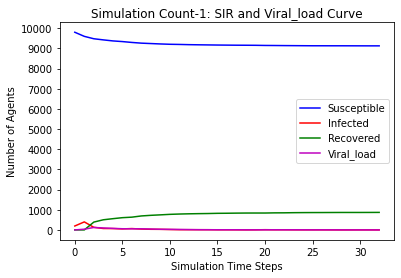

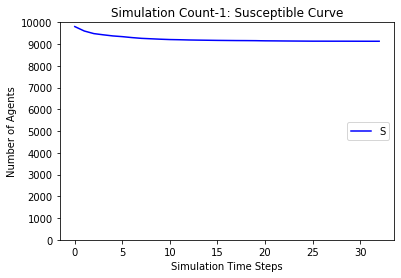

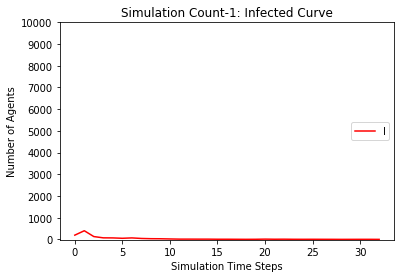

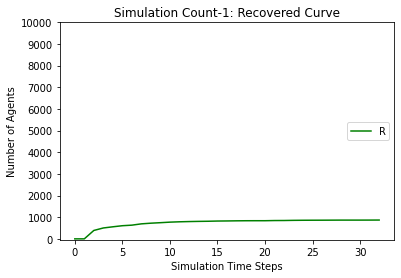

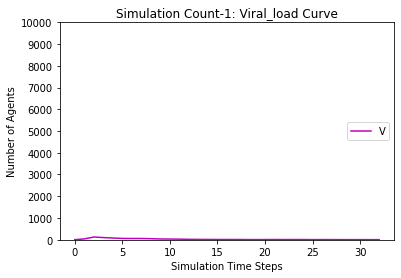

[9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186]
[194, 410, 156, 108, 62, 42, 68, 25, 10, 7, 5, 2, 4, 1, 2, 1, 1, 2, 0, 0, 1, 2, 0, 0]
[0, 0, 393, 531, 627, 679, 688, 754, 779, 789, 794, 799, 800, 804, 805, 807, 808, 809, 811, 811, 811, 812, 814, 814]
[0.0, 34.0, 133.0, 112.5, 99.25, 68.625, 45.3125, 43.65625, 29.828125, 18.9140625, 11.45703125, 7.728515625, 4.8642578125, 5.43212890625, 3.716064453125, 3.8580322265625, 2.92901611328125, 2.464508056640625, 2.2322540283203125, 1.1161270141601562, 0.5580635070800781, 1.279031753540039, 1.6395158767700195, 0.8197579383850098]
1353.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191

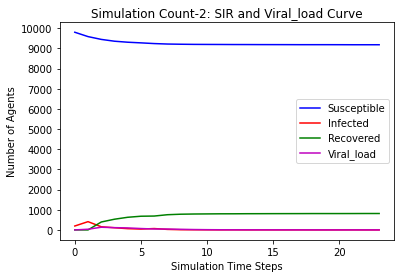

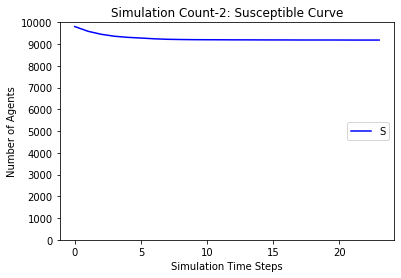

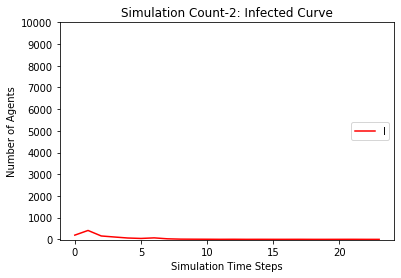

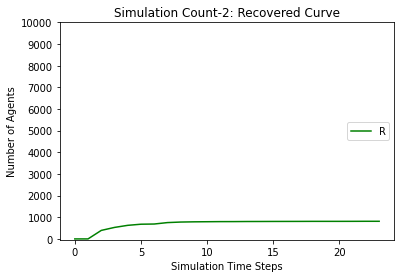

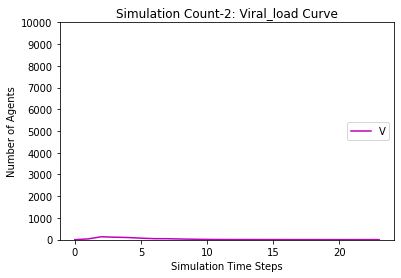

[9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303]
[194, 384, 106, 83, 40, 36, 32, 33, 26, 22, 14, 8, 4, 4, 4, 0, 2, 0, 0]
[0, 0, 368, 456, 529, 563, 590, 613, 636, 652, 666, 676, 684, 687, 691, 695, 695, 697, 697]
[0.0, 20.0, 98.0, 78.0, 64.0, 46.0, 39.0, 29.5, 28.75, 21.375, 17.6875, 14.84375, 10.421875, 7.2109375, 5.60546875, 3.802734375, 1.9013671875, 1.95068359375, 0.975341796875]
1684.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303]]
[[], [194, 398, 129, 70, 67, 50, 67, 42, 31, 28, 19, 11, 11, 

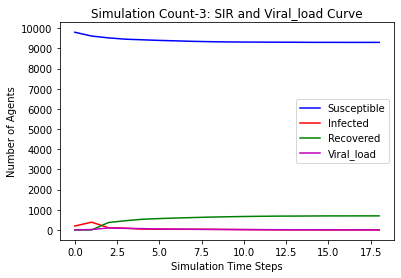

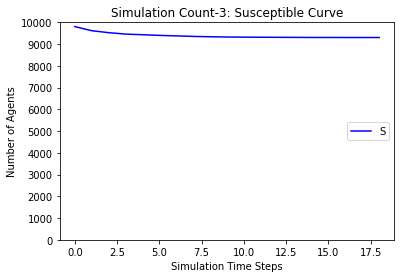

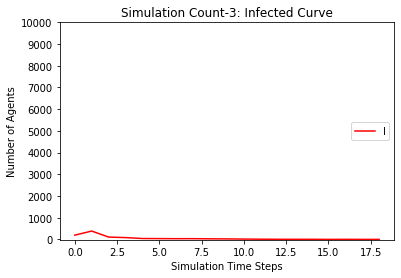

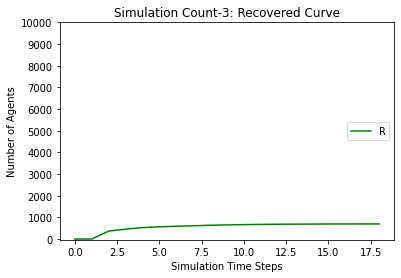

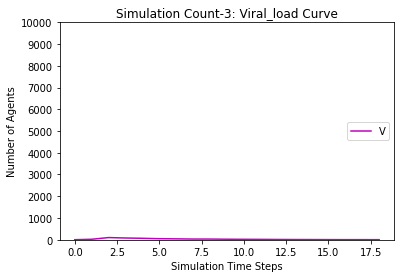

[9806, 9582, 9469, 9415, 9373, 9337, 9300, 9276, 9263, 9254, 9245, 9240, 9237, 9233, 9228, 9227, 9227, 9224, 9223, 9222, 9222]
[194, 418, 129, 71, 62, 47, 54, 29, 18, 12, 13, 7, 8, 6, 7, 1, 1, 4, 1, 1, 0]
[0, 0, 402, 514, 565, 616, 646, 695, 719, 734, 742, 753, 755, 761, 765, 772, 772, 772, 776, 777, 778]
[0.0, 26.0, 114.0, 90.0, 63.0, 51.5, 40.75, 44.375, 32.1875, 23.09375, 16.546875, 12.2734375, 7.13671875, 6.568359375, 5.2841796875, 6.64208984375, 4.321044921875, 2.1605224609375, 1.08026123046875, 0.540130615234375, 0.2700653076171875]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 

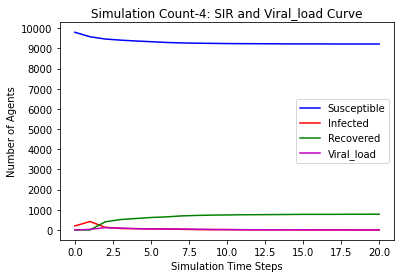

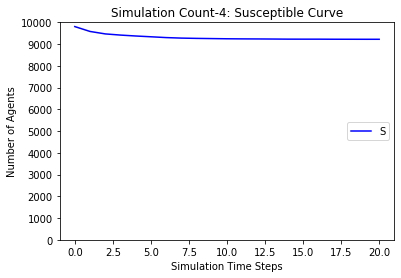

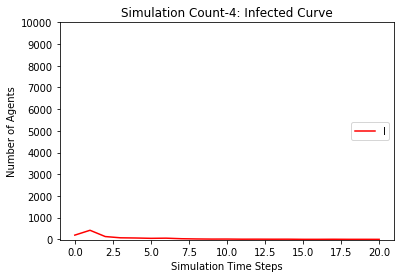

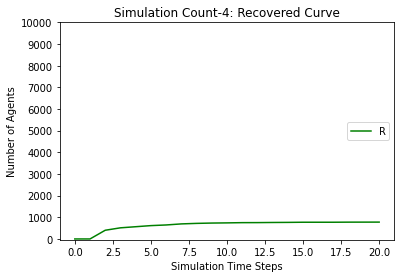

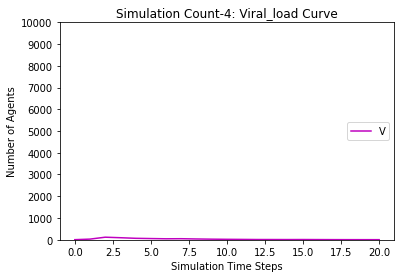

[9806, 9587, 9444, 9374, 9320, 9283, 9245, 9222, 9212, 9206, 9197, 9193, 9189, 9186, 9184, 9184, 9184, 9183, 9183, 9183, 9182, 9182]
[194, 413, 169, 91, 77, 58, 73, 29, 13, 8, 13, 6, 6, 3, 2, 0, 0, 1, 1, 1, 2, 0]
[0, 0, 387, 535, 603, 659, 682, 749, 775, 786, 790, 801, 805, 811, 814, 816, 816, 816, 816, 816, 816, 818]
[0.0, 26.0, 130.0, 121.0, 80.5, 64.25, 42.125, 50.0625, 34.03125, 19.015625, 11.5078125, 8.75390625, 5.376953125, 5.6884765625, 4.84423828125, 2.422119140625, 1.2110595703125, 0.60552978515625, 1.302764892578125, 0.6513824462890625, 0.32569122314453125, 0.16284561157226562]
2679.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401

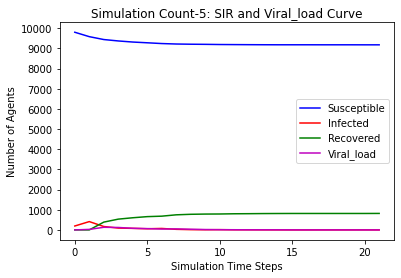

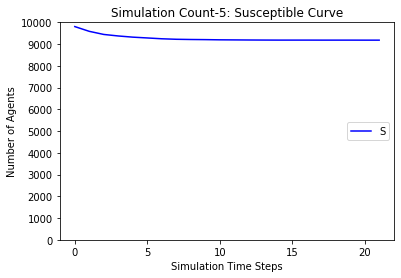

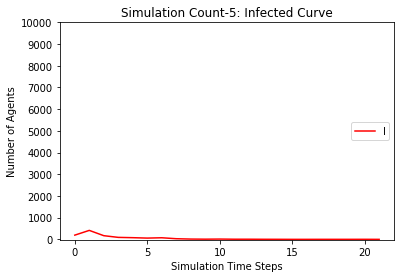

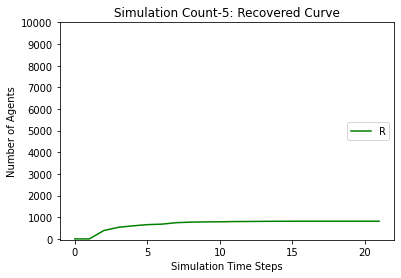

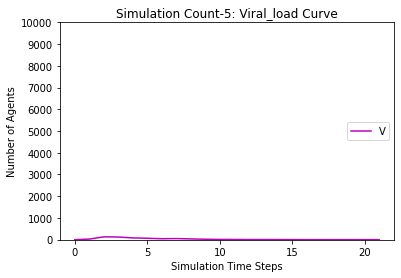

[9806, 9582, 9433, 9346, 9287, 9246, 9194, 9158, 9136, 9126, 9119, 9114, 9110, 9110, 9108, 9105, 9103, 9100, 9097, 9094, 9091, 9089, 9089, 9087, 9085, 9084, 9083, 9080, 9078, 9077, 9077, 9077]
[194, 418, 174, 108, 79, 60, 101, 46, 28, 16, 13, 9, 6, 0, 2, 3, 3, 3, 3, 3, 4, 4, 0, 2, 4, 2, 3, 3, 2, 1, 0, 0]
[0, 0, 393, 546, 634, 694, 705, 796, 836, 858, 868, 877, 884, 890, 890, 892, 894, 897, 900, 903, 905, 907, 911, 911, 911, 914, 914, 917, 920, 922, 923, 923]
[0.0, 30.0, 135.0, 128.5, 102.25, 75.125, 58.5625, 59.28125, 47.640625, 33.8203125, 18.91015625, 13.455078125, 8.7275390625, 7.36376953125, 3.681884765625, 2.8409423828125, 4.42047119140625, 3.210235595703125, 2.6051177978515625, 3.3025588989257812, 3.6512794494628906, 2.8256397247314453, 1.4128198623657227, 0.7064099311828613, 2.3532049655914307, 2.1766024827957153, 1.0883012413978577, 1.5441506206989288, 1.7720753103494644, 1.8860376551747322, 1.943018827587366, 0.971509413793683]
2601.3333333333335
[[], [9806, 9602, 9483, 9427, 

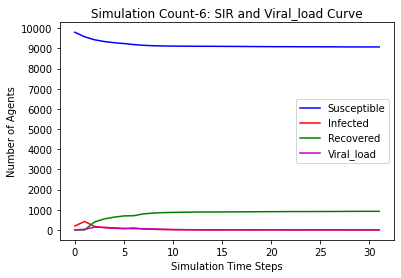

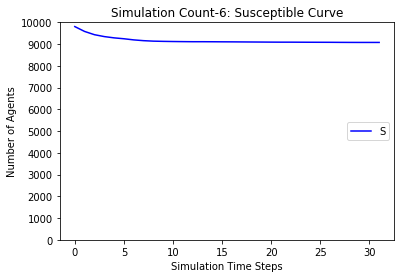

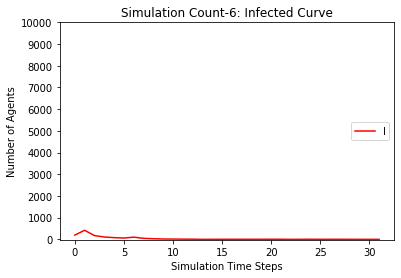

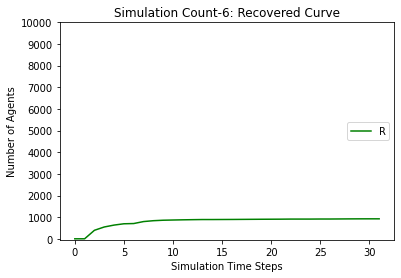

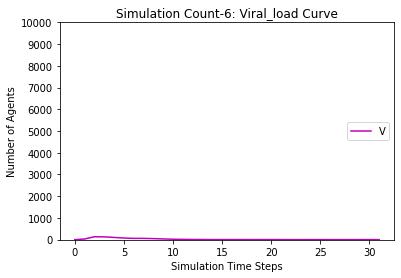

[9806, 9590, 9454, 9376, 9323, 9284, 9236, 9202, 9184, 9162, 9150, 9135, 9124, 9118, 9110, 9101, 9095, 9093, 9089, 9087, 9085, 9085, 9084, 9084, 9083, 9081, 9081, 9080, 9079, 9079, 9079]
[194, 410, 154, 95, 74, 62, 92, 50, 31, 38, 17, 28, 15, 11, 10, 10, 7, 4, 4, 2, 2, 0, 1, 0, 1, 2, 2, 1, 1, 0, 0]
[0, 0, 392, 529, 603, 654, 672, 748, 785, 800, 833, 837, 861, 871, 880, 889, 898, 903, 907, 911, 913, 915, 915, 916, 916, 917, 917, 919, 920, 921, 921]
[0.0, 27.0, 120.5, 113.25, 81.625, 59.8125, 51.90625, 57.953125, 45.9765625, 29.98828125, 28.994140625, 20.4970703125, 19.24853515625, 15.624267578125, 11.8121337890625, 11.90606689453125, 8.953033447265625, 8.476516723632812, 4.238258361816406, 5.119129180908203, 4.559564590454102, 3.279782295227051, 1.6398911476135254, 1.8199455738067627, 0.9099727869033813, 1.4549863934516907, 2.7274931967258453, 1.3637465983629227, 1.6818732991814613, 1.8409366495907307, 0.9204683247953653]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300

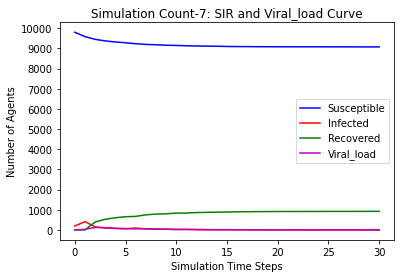

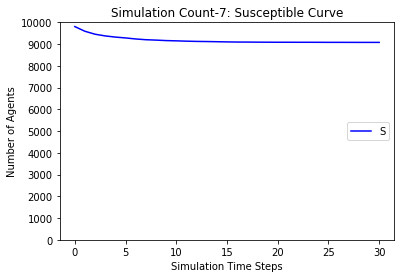

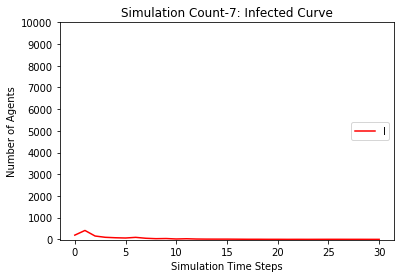

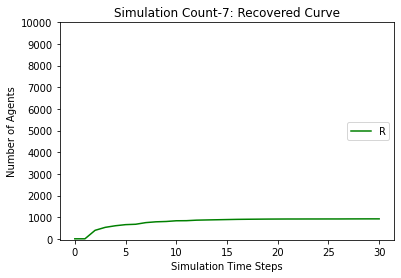

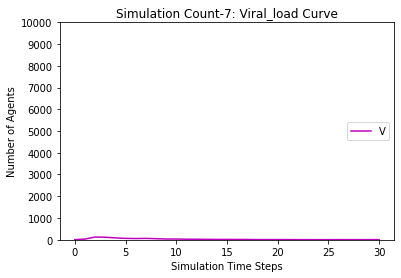

[9806, 9599, 9479, 9412, 9369, 9336, 9297, 9273, 9255, 9232, 9221, 9208, 9203, 9201, 9199, 9198, 9197, 9197]
[194, 401, 138, 85, 52, 45, 72, 32, 26, 32, 17, 17, 7, 3, 2, 1, 1, 0]
[0, 0, 383, 503, 579, 619, 631, 695, 719, 736, 762, 775, 790, 796, 799, 801, 802, 803]
[0.0, 30.0, 111.0, 97.5, 79.75, 59.875, 44.9375, 41.46875, 29.734375, 25.8671875, 26.93359375, 17.466796875, 13.7333984375, 9.86669921875, 5.933349609375, 3.9666748046875, 1.98333740234375, 0.991668701171875]
2011.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 9373, 9337, 93

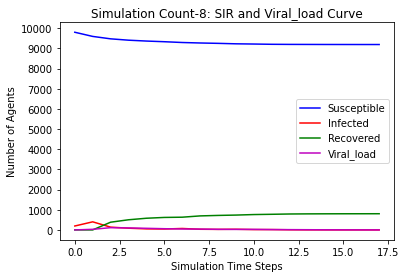

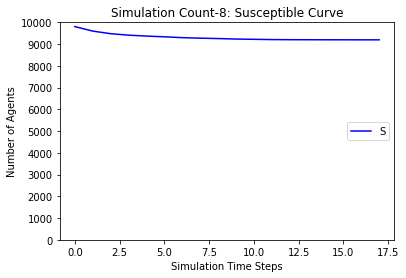

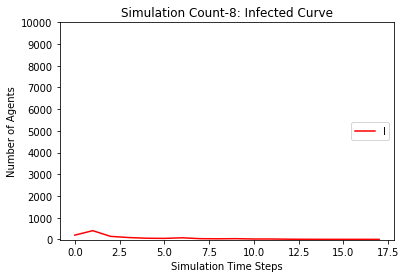

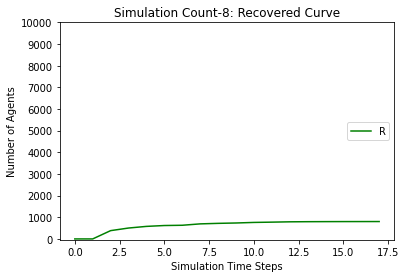

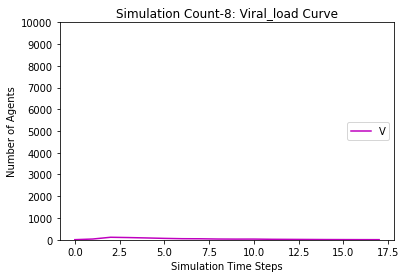

[9806, 9598, 9465, 9383, 9337, 9308, 9278, 9248, 9231, 9213, 9205, 9197, 9190, 9187, 9185, 9182, 9179, 9177, 9176, 9174, 9173, 9172, 9172, 9172, 9172]
[194, 402, 165, 107, 60, 37, 49, 35, 22, 23, 12, 12, 13, 6, 3, 4, 4, 3, 1, 2, 1, 1, 0, 0, 0]
[0, 0, 370, 510, 603, 655, 673, 717, 747, 764, 783, 791, 797, 807, 812, 814, 817, 820, 823, 824, 826, 827, 828, 828, 828]
[0.0, 24.0, 117.0, 99.5, 85.75, 63.875, 51.9375, 40.96875, 35.484375, 27.7421875, 26.87109375, 18.435546875, 10.2177734375, 8.10888671875, 5.054443359375, 4.5272216796875, 5.26361083984375, 4.631805419921875, 3.3159027099609375, 2.6579513549804688, 3.3289756774902344, 2.664487838745117, 2.3322439193725586, 1.1661219596862793, 0.5830609798431396]
672.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 92

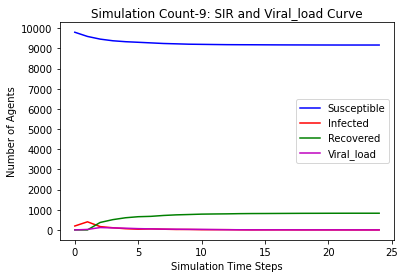

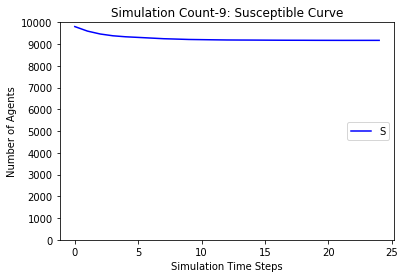

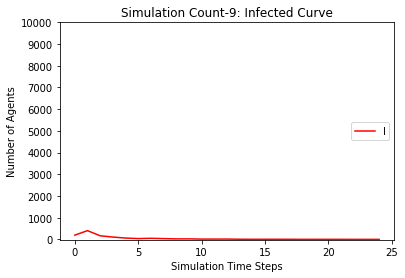

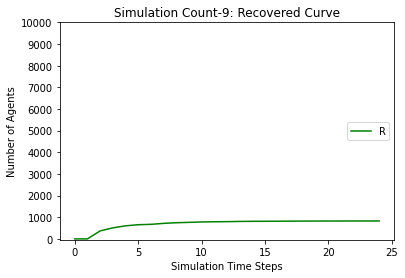

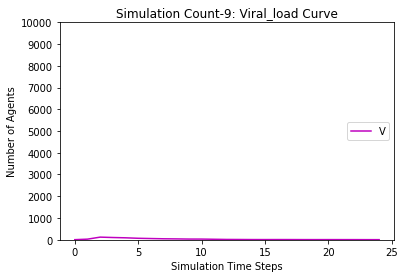

[9806, 9589, 9452, 9365, 9309, 9271, 9233, 9202, 9177, 9167, 9151, 9131, 9122, 9117, 9113, 9112, 9111, 9111, 9109, 9108, 9108, 9108]
[194, 411, 158, 112, 76, 54, 75, 38, 34, 17, 21, 29, 11, 5, 4, 1, 1, 0, 2, 1, 0, 0]
[0, 0, 390, 523, 615, 675, 692, 760, 789, 816, 828, 840, 867, 878, 883, 887, 888, 889, 889, 891, 892, 892]
[0.0, 34.0, 138.0, 108.0, 94.0, 69.0, 53.5, 50.75, 39.375, 33.6875, 23.84375, 21.921875, 19.9609375, 14.98046875, 8.490234375, 7.2451171875, 4.62255859375, 3.311279296875, 1.6556396484375, 1.82781982421875, 1.913909912109375, 0.9569549560546875]
2623.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326,

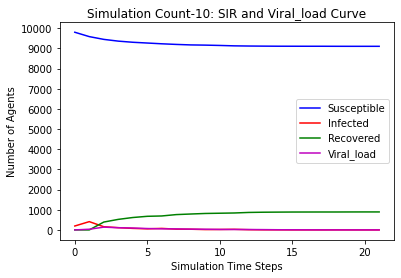

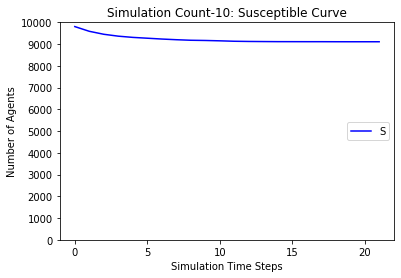

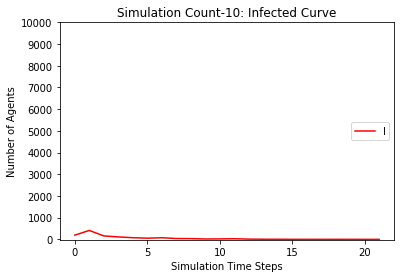

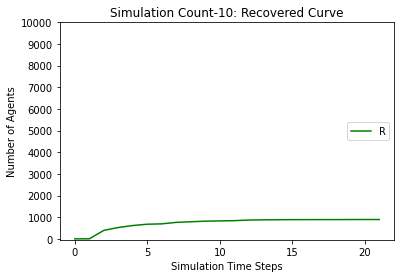

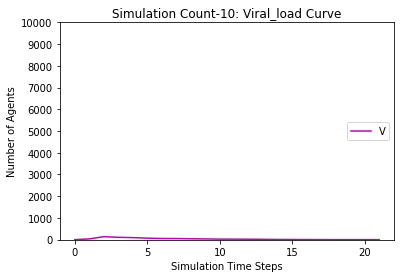

[9806, 9590, 9468, 9384, 9322, 9280, 9239, 9214, 9193, 9181, 9172, 9165, 9157, 9148, 9139, 9136, 9133, 9133, 9131, 9130, 9130, 9130]
[194, 410, 149, 119, 78, 55, 82, 39, 31, 15, 14, 13, 11, 11, 9, 3, 5, 1, 3, 2, 0, 0]
[0, 0, 383, 497, 600, 665, 679, 747, 776, 804, 814, 822, 832, 841, 852, 861, 862, 866, 866, 868, 870, 870]
[0.0, 29.0, 116.5, 107.25, 93.625, 69.8125, 49.90625, 51.953125, 37.9765625, 27.98828125, 20.994140625, 14.4970703125, 15.24853515625, 9.624267578125, 10.8121337890625, 8.40606689453125, 4.203033447265625, 4.1015167236328125, 2.0507583618164062, 3.025379180908203, 1.5126895904541016, 0.7563447952270508]
2661.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], 

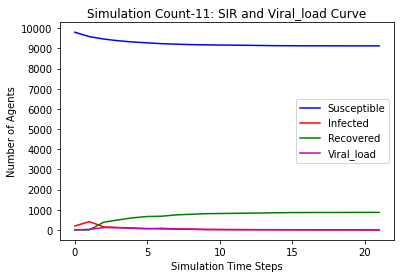

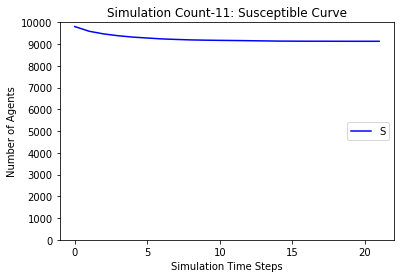

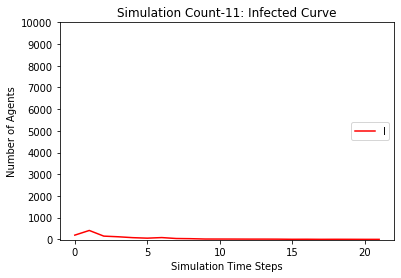

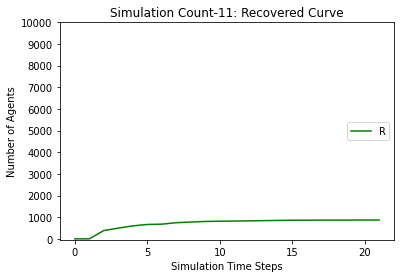

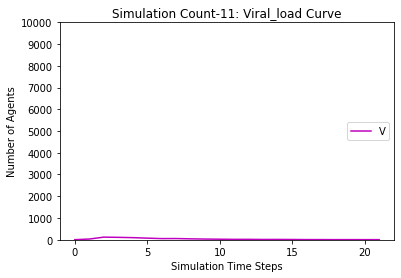

[9806, 9580, 9439, 9359, 9312, 9286, 9250, 9217, 9199, 9177, 9169, 9159, 9154, 9149, 9143, 9139, 9135, 9130, 9129, 9126, 9125, 9122, 9121, 9119, 9118, 9117, 9114, 9112, 9111, 9109, 9105, 9104, 9102, 9099, 9096, 9094, 9093, 9091, 9090, 9090, 9089, 9085, 9085, 9085, 9084, 9084, 9083, 9082, 9082, 9082]
[194, 420, 166, 101, 57, 35, 67, 43, 30, 28, 11, 19, 8, 6, 9, 6, 8, 8, 1, 4, 1, 4, 1, 2, 1, 1, 4, 2, 1, 3, 6, 2, 2, 3, 3, 2, 3, 4, 2, 1, 1, 5, 0, 0, 1, 0, 1, 1, 0, 0]
[0, 0, 395, 540, 631, 679, 683, 740, 771, 795, 820, 822, 838, 845, 848, 855, 857, 862, 870, 870, 874, 874, 878, 879, 881, 882, 882, 886, 888, 888, 889, 894, 896, 898, 901, 904, 904, 905, 908, 909, 910, 910, 915, 915, 915, 916, 916, 917, 918, 918]
[0.0, 34.0, 122.0, 107.0, 84.5, 56.25, 41.125, 51.5625, 42.78125, 30.390625, 22.1953125, 17.09765625, 10.548828125, 7.2744140625, 5.63720703125, 5.818603515625, 4.9093017578125, 6.45465087890625, 5.227325439453125, 3.6136627197265625, 3.8068313598632812, 2.9034156799316406, 3.45170783

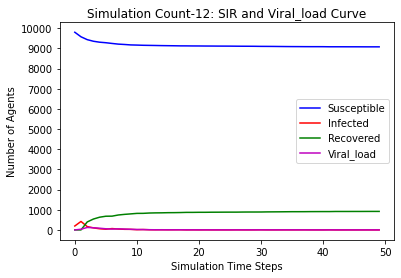

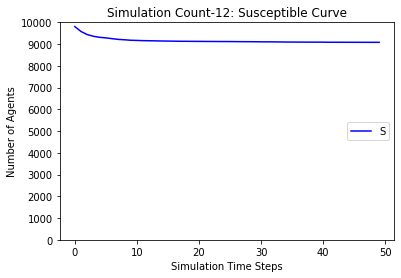

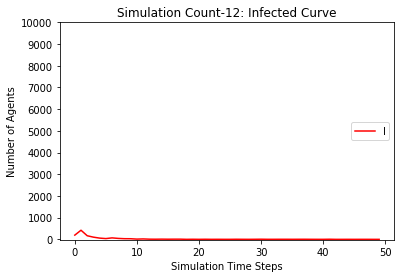

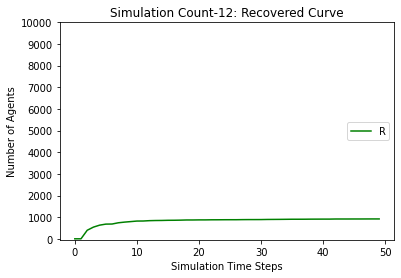

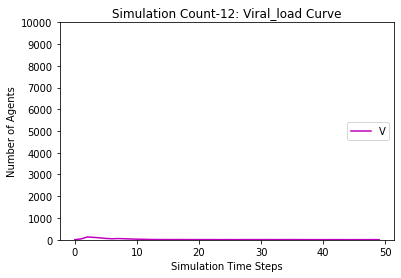

[9806, 9582, 9458, 9377, 9330, 9288, 9250, 9230, 9213, 9206, 9200, 9198, 9198, 9197, 9193, 9189, 9188, 9187, 9185, 9185, 9183, 9182, 9180, 9178, 9177, 9177, 9175, 9171, 9168, 9166, 9165, 9165, 9165]
[194, 418, 137, 102, 65, 56, 69, 22, 19, 10, 9, 4, 2, 2, 5, 5, 2, 1, 2, 0, 2, 1, 3, 2, 1, 1, 3, 4, 3, 2, 1, 0, 0]
[0, 0, 405, 521, 605, 656, 681, 748, 768, 784, 791, 798, 800, 801, 802, 806, 810, 812, 813, 815, 815, 817, 817, 820, 822, 822, 822, 825, 829, 832, 834, 835, 835]
[0.0, 29.0, 134.5, 108.25, 81.125, 65.5625, 49.78125, 46.890625, 30.4453125, 26.22265625, 15.111328125, 10.5556640625, 7.27783203125, 3.638916015625, 2.8194580078125, 1.40972900390625, 2.704864501953125, 1.3524322509765625, 1.6762161254882812, 1.8381080627441406, 0.9190540313720703, 2.459527015686035, 2.2297635078430176, 2.114881753921509, 2.0574408769607544, 1.0287204384803772, 1.5143602192401886, 3.7571801096200943, 3.878590054810047, 2.9392950274050236, 3.469647513702512, 1.734823756851256, 0.867411878425628]
2007.33

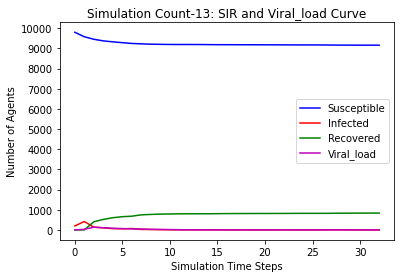

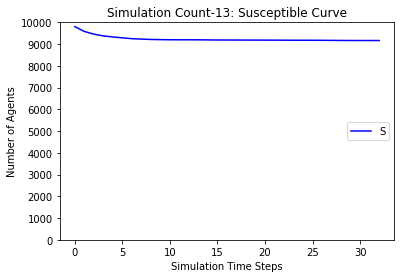

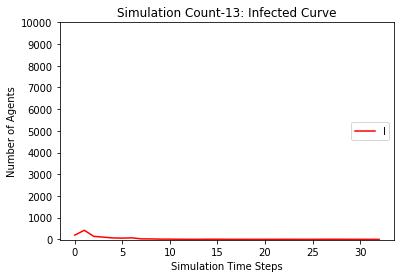

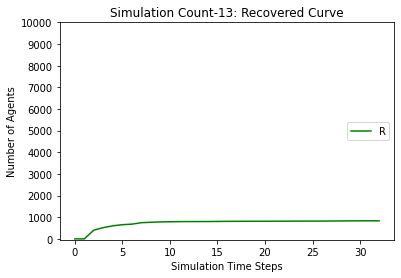

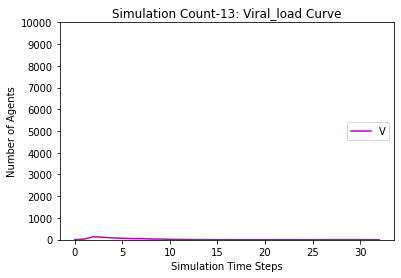

[9806, 9575, 9442, 9356, 9293, 9254, 9194, 9165, 9155, 9140, 9131, 9121, 9114, 9112, 9110, 9109, 9109, 9107, 9106, 9105, 9105, 9103, 9102, 9100, 9099, 9097, 9094, 9092, 9092, 9092, 9092]
[194, 425, 161, 113, 79, 50, 100, 40, 20, 21, 12, 15, 10, 3, 3, 2, 1, 3, 1, 1, 0, 2, 1, 2, 1, 2, 5, 2, 0, 0, 0]
[0, 0, 397, 531, 628, 696, 706, 795, 825, 839, 857, 864, 876, 885, 887, 889, 890, 890, 893, 894, 895, 895, 897, 898, 900, 901, 901, 906, 908, 908, 908]
[0.0, 35.0, 146.5, 112.25, 88.125, 68.0625, 53.03125, 54.515625, 39.2578125, 24.62890625, 18.314453125, 12.1572265625, 10.07861328125, 8.039306640625, 4.0196533203125, 3.00982666015625, 2.504913330078125, 1.2524566650390625, 2.6262283325195312, 2.3131141662597656, 2.156557083129883, 1.0782785415649414, 1.5391392707824707, 1.7695696353912354, 1.8847848176956177, 1.9423924088478088, 2.9711962044239044, 2.485598102211952, 3.242799051105976, 1.621399525552988, 0.810699762776494]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 92

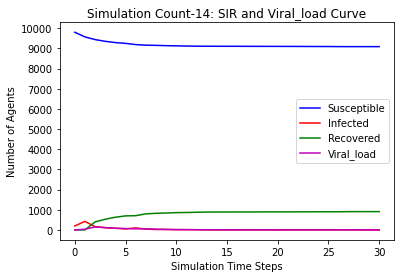

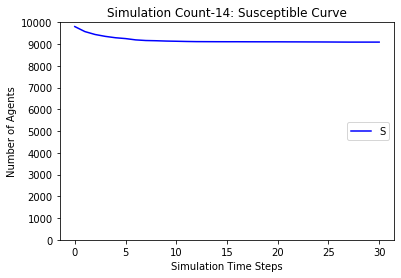

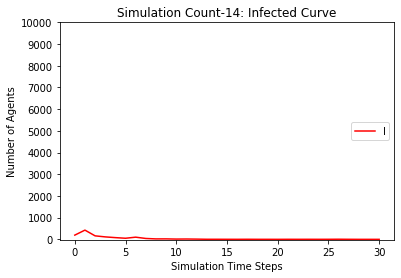

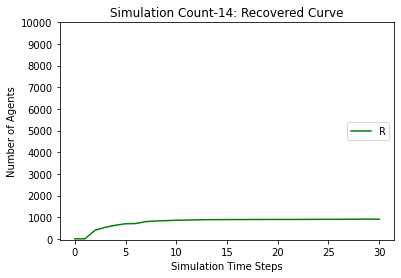

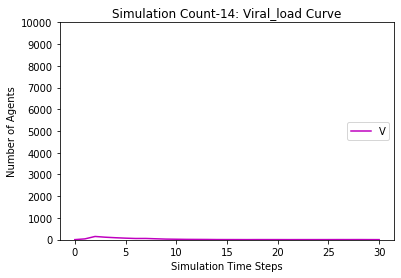

[9806, 9605, 9485, 9403, 9343, 9306, 9260, 9231, 9218, 9208, 9199, 9191, 9188, 9183, 9181, 9181, 9180, 9179, 9179, 9178, 9176, 9174, 9172, 9172, 9172, 9172]
[194, 395, 151, 108, 73, 51, 77, 32, 16, 14, 16, 14, 6, 5, 3, 0, 1, 2, 1, 2, 2, 2, 2, 0, 0, 0]
[0, 0, 364, 489, 584, 643, 663, 737, 766, 778, 785, 795, 806, 812, 816, 819, 819, 819, 820, 820, 822, 824, 826, 828, 828, 828]
[0.0, 31.0, 119.5, 101.75, 90.875, 66.4375, 57.21875, 49.609375, 35.8046875, 19.90234375, 13.951171875, 9.9755859375, 10.98779296875, 6.493896484375, 7.2469482421875, 3.62347412109375, 1.811737060546875, 0.9058685302734375, 0.45293426513671875, 1.2264671325683594, 2.6132335662841797, 2.30661678314209, 2.153308391571045, 2.0766541957855225, 1.0383270978927612, 0.5191635489463806]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 94

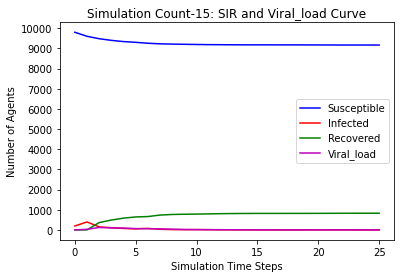

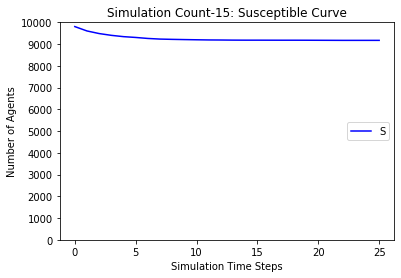

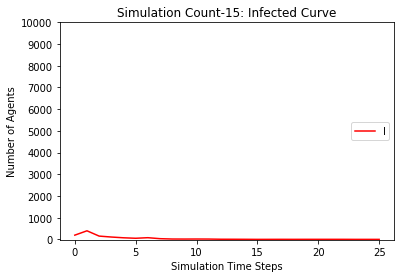

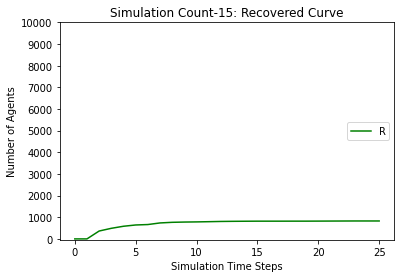

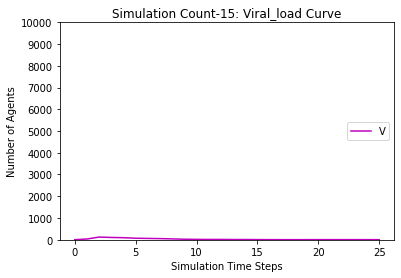

[9806, 9594, 9458, 9382, 9334, 9306, 9277, 9253, 9241, 9231, 9224, 9219, 9214, 9214, 9210, 9209, 9208, 9207, 9207, 9206, 9205, 9204, 9204, 9204]
[194, 406, 164, 93, 67, 39, 56, 29, 19, 15, 10, 6, 6, 2, 5, 1, 1, 1, 0, 1, 2, 1, 0, 0]
[0, 0, 378, 525, 599, 655, 667, 718, 740, 754, 766, 775, 780, 784, 785, 790, 791, 792, 793, 793, 793, 795, 796, 796]
[0.0, 36.0, 134.0, 116.0, 80.0, 58.0, 38.0, 34.0, 25.0, 20.5, 14.25, 9.125, 4.5625, 5.28125, 2.640625, 4.3203125, 3.16015625, 1.580078125, 1.7900390625, 0.89501953125, 1.447509765625, 2.7237548828125, 1.36187744140625, 0.680938720703125]
1423.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 

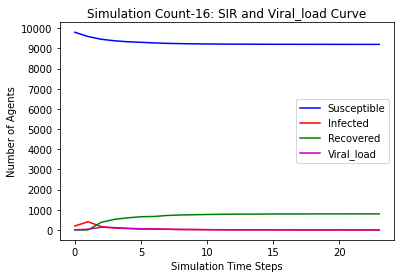

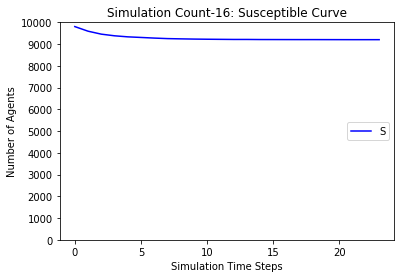

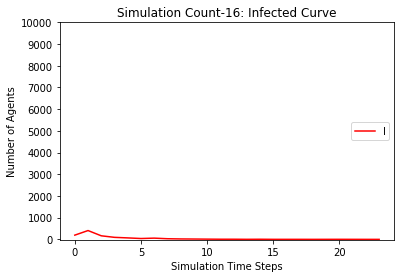

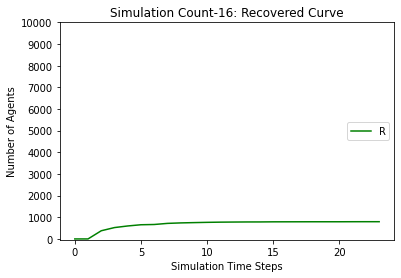

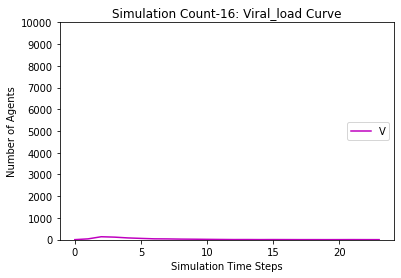

[9806, 9582, 9463, 9388, 9339, 9303, 9272, 9247, 9222, 9208, 9191, 9179, 9171, 9165, 9158, 9153, 9151, 9149, 9149, 9148, 9148, 9145, 9144, 9142, 9142, 9142, 9141, 9140, 9140, 9140]
[194, 418, 139, 106, 65, 58, 57, 38, 27, 18, 19, 16, 10, 8, 10, 6, 2, 2, 0, 1, 1, 4, 1, 2, 0, 0, 1, 1, 0, 0]
[0, 0, 398, 506, 596, 639, 671, 715, 751, 774, 790, 805, 819, 827, 832, 841, 847, 849, 851, 851, 851, 851, 855, 856, 858, 858, 858, 859, 860, 860]
[0.0, 27.0, 132.5, 105.25, 83.625, 61.8125, 51.90625, 45.953125, 36.9765625, 33.48828125, 22.744140625, 17.3720703125, 14.68603515625, 12.343017578125, 11.1715087890625, 8.58575439453125, 7.292877197265625, 4.6464385986328125, 3.3232192993164062, 1.6616096496582031, 0.8308048248291016, 0.4154024124145508, 1.2077012062072754, 1.6038506031036377, 2.801925301551819, 1.4009626507759094, 0.7004813253879547, 1.3502406626939774, 1.6751203313469887, 0.8375601656734943]
622.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9

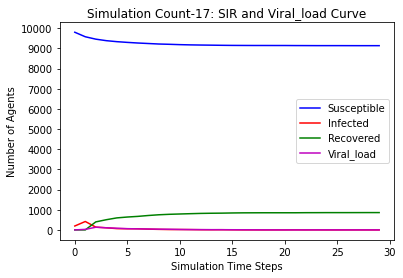

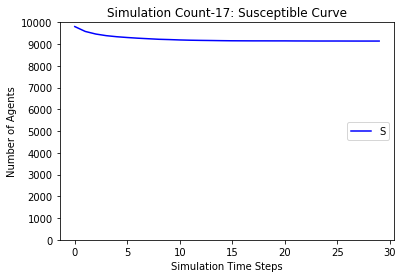

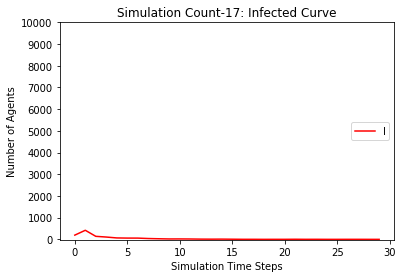

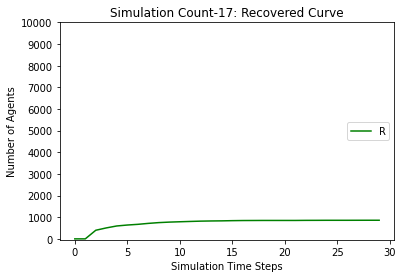

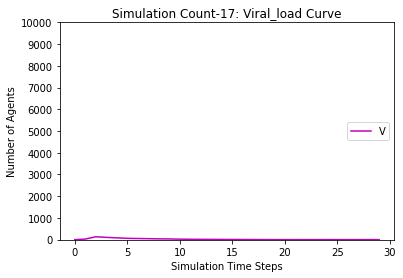

[9806, 9605, 9485, 9399, 9345, 9320, 9286, 9272, 9255, 9241, 9233, 9223, 9216, 9211, 9210, 9208, 9208, 9208, 9206, 9205, 9203, 9203, 9203]
[194, 395, 137, 105, 67, 44, 57, 22, 26, 24, 13, 14, 12, 8, 2, 2, 1, 1, 3, 2, 3, 0, 0]
[0, 0, 378, 496, 588, 636, 657, 706, 719, 735, 754, 763, 772, 781, 788, 790, 791, 791, 791, 793, 794, 797, 797]
[0.0, 27.0, 119.5, 102.75, 82.375, 58.1875, 41.09375, 39.546875, 23.7734375, 20.88671875, 15.443359375, 11.7216796875, 11.86083984375, 6.930419921875, 6.4652099609375, 3.23260498046875, 2.616302490234375, 1.3081512451171875, 0.6540756225585938, 1.3270378112792969, 1.6635189056396484, 1.8317594528198242, 0.9158797264099121]
2087.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189

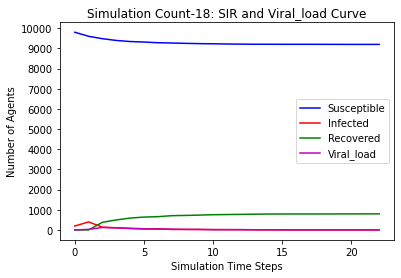

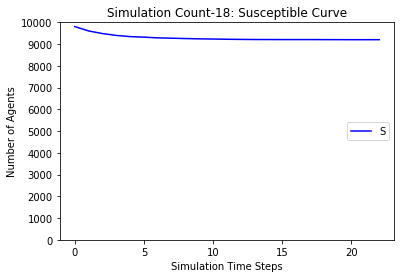

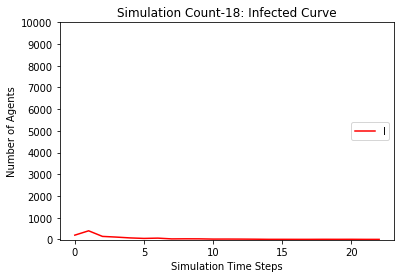

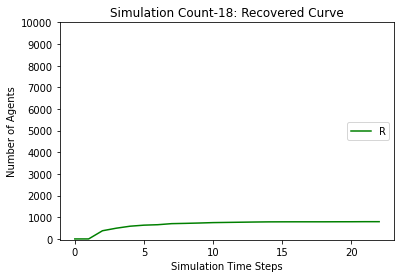

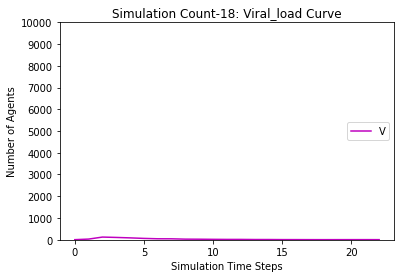

[9806, 9580, 9448, 9375, 9314, 9268, 9216, 9184, 9159, 9146, 9133, 9118, 9113, 9109, 9108, 9107, 9106, 9106, 9106]
[194, 420, 157, 91, 76, 62, 99, 42, 33, 24, 20, 25, 5, 5, 2, 2, 2, 0, 0]
[0, 0, 395, 534, 610, 670, 685, 774, 808, 830, 847, 857, 882, 886, 890, 891, 892, 894, 894]
[0.0, 31.0, 138.5, 118.25, 95.125, 67.5625, 56.78125, 71.390625, 48.6953125, 36.34765625, 28.173828125, 23.0869140625, 21.54345703125, 11.771728515625, 7.8858642578125, 4.94293212890625, 3.471466064453125, 1.7357330322265625, 0.8678665161132812]
1171.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9

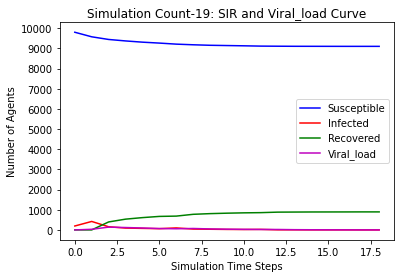

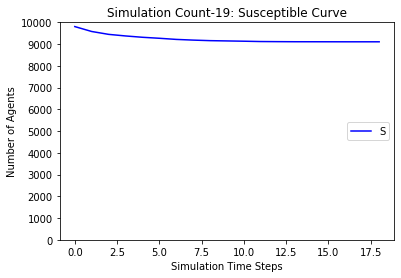

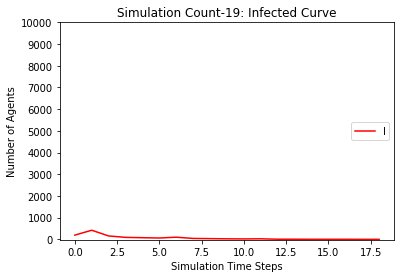

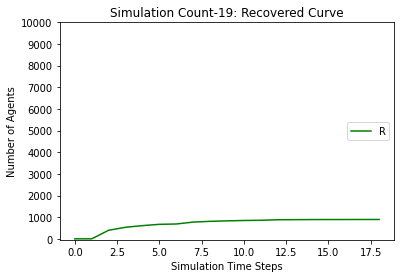

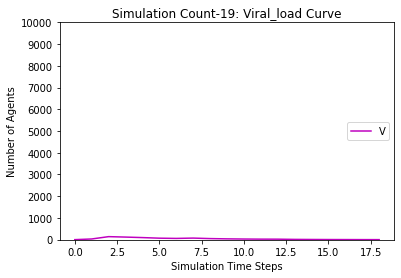

[9806, 9577, 9440, 9365, 9319, 9283, 9235, 9196, 9180, 9164, 9146, 9131, 9119, 9113, 9107, 9100, 9096, 9092, 9090, 9085, 9083, 9077, 9072, 9067, 9062, 9060, 9057, 9057, 9057, 9057]
[194, 423, 158, 95, 57, 53, 97, 49, 19, 19, 25, 34, 14, 9, 8, 9, 7, 6, 3, 7, 5, 11, 9, 7, 8, 2, 5, 0, 0, 0]
[0, 0, 402, 540, 624, 664, 668, 755, 801, 817, 829, 835, 867, 878, 885, 891, 897, 902, 907, 908, 912, 912, 919, 926, 930, 938, 938, 943, 943, 943]
[0.0, 37.0, 143.5, 116.75, 82.375, 61.1875, 48.59375, 66.296875, 45.1484375, 35.57421875, 27.787109375, 23.8935546875, 23.94677734375, 13.973388671875, 9.9866943359375, 5.99334716796875, 8.996673583984375, 6.4983367919921875, 8.249168395996094, 7.124584197998047, 4.562292098999023, 2.2811460494995117, 5.140573024749756, 9.570286512374878, 7.785143256187439, 9.89257162809372, 5.94628581404686, 2.97314290702343, 1.486571453511715, 0.7432857267558575]
312.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 917

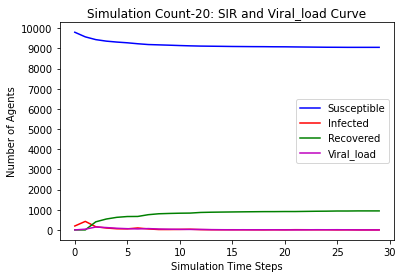

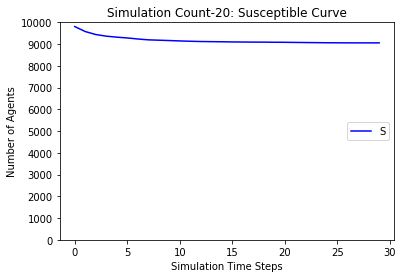

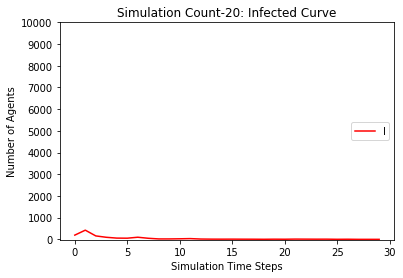

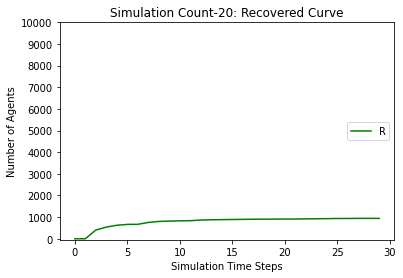

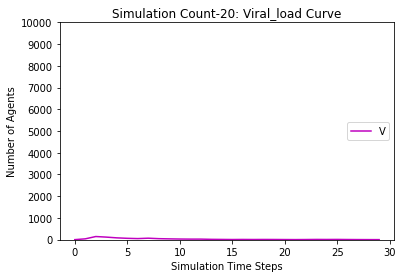

[9806, 9594, 9468, 9387, 9332, 9302, 9258, 9220, 9201, 9186, 9171, 9158, 9154, 9146, 9140, 9135, 9129, 9124, 9121, 9119, 9116, 9113, 9110, 9109, 9105, 9105, 9104, 9104, 9102, 9098, 9094, 9094, 9094, 9092, 9088, 9086, 9086, 9085, 9081, 9081, 9077, 9075, 9075, 9075, 9074, 9073, 9072, 9072, 9072]
[194, 406, 161, 113, 74, 46, 76, 48, 30, 23, 20, 18, 9, 8, 7, 9, 7, 7, 3, 2, 4, 4, 5, 4, 8, 1, 2, 0, 2, 5, 4, 0, 0, 2, 4, 2, 1, 2, 5, 1, 5, 2, 0, 0, 1, 1, 1, 0, 0]
[0, 0, 371, 500, 594, 652, 666, 732, 769, 791, 809, 824, 837, 846, 853, 856, 864, 869, 876, 879, 880, 883, 885, 887, 887, 894, 894, 896, 896, 897, 902, 906, 906, 906, 908, 912, 913, 913, 914, 918, 918, 923, 925, 925, 925, 926, 927, 928, 928]
[0.0, 31.0, 130.5, 116.25, 87.125, 75.5625, 54.78125, 53.390625, 46.6953125, 32.34765625, 24.173828125, 20.0869140625, 14.04345703125, 11.021728515625, 11.5108642578125, 7.75543212890625, 8.877716064453125, 5.4388580322265625, 5.719429016113281, 5.859714508056641, 4.92985725402832, 5.46492862701416

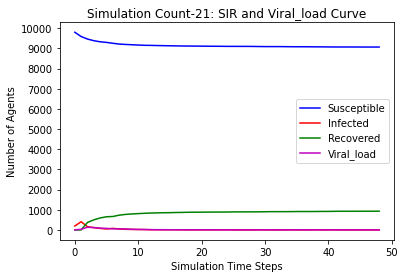

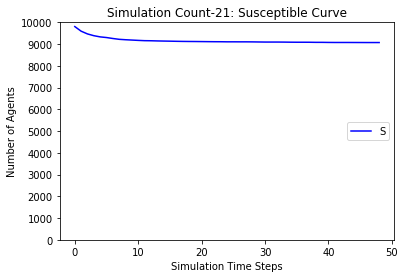

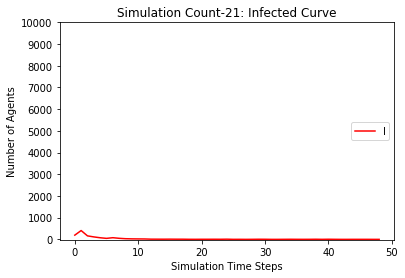

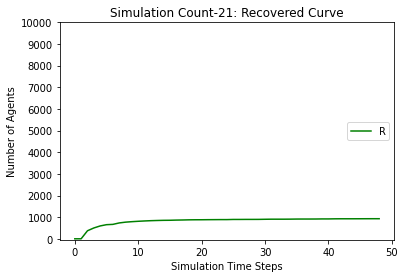

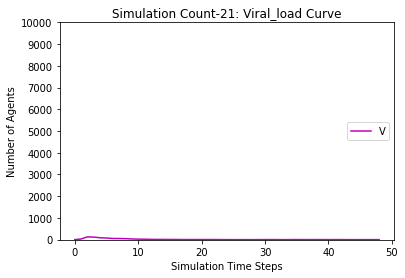

[9806, 9620, 9480, 9390, 9337, 9278, 9223, 9173, 9152, 9134, 9109, 9095, 9085, 9076, 9069, 9061, 9054, 9053, 9051, 9050, 9049, 9049, 9049]
[194, 380, 172, 108, 77, 79, 109, 62, 30, 31, 36, 34, 16, 14, 10, 11, 12, 1, 2, 1, 1, 1, 0]
[0, 0, 348, 502, 586, 643, 668, 765, 818, 835, 855, 871, 899, 910, 921, 928, 934, 946, 947, 949, 950, 950, 951]
[0.0, 28.0, 123.0, 113.5, 97.75, 76.875, 67.4375, 68.71875, 58.359375, 43.1796875, 39.58984375, 27.794921875, 25.8974609375, 16.94873046875, 14.474365234375, 11.2371826171875, 8.61859130859375, 6.309295654296875, 4.1546478271484375, 3.0773239135742188, 1.5386619567871094, 0.7693309783935547, 0.38466548919677734]
1815.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189

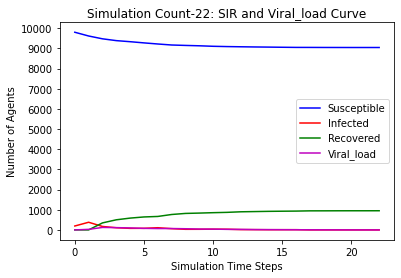

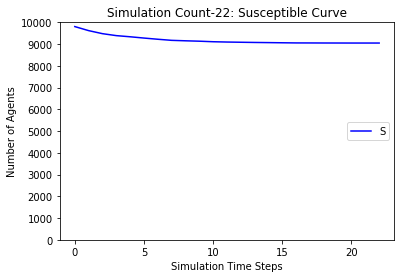

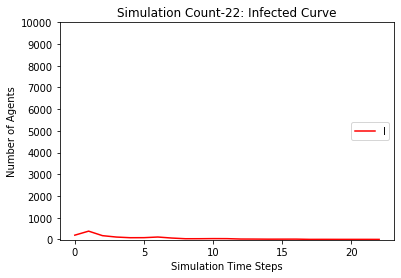

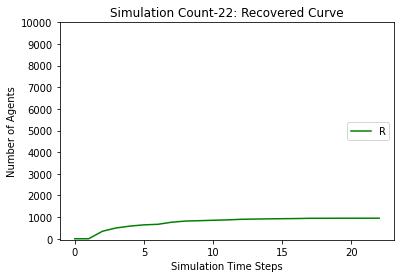

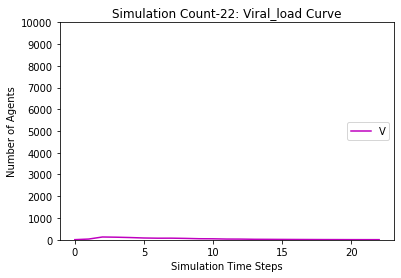

[9806, 9579, 9438, 9357, 9318, 9288, 9267, 9239, 9216, 9206, 9197, 9191, 9185, 9180, 9175, 9175, 9173, 9172, 9167, 9161, 9159, 9155, 9149, 9145, 9143, 9142, 9139, 9139, 9139, 9138, 9138, 9138, 9137, 9137, 9137]
[194, 421, 164, 101, 47, 42, 58, 39, 30, 15, 15, 13, 8, 5, 6, 0, 2, 2, 6, 8, 2, 5, 7, 5, 5, 2, 5, 0, 0, 1, 1, 1, 2, 0, 0]
[0, 0, 398, 542, 635, 670, 675, 722, 754, 779, 788, 796, 807, 815, 819, 825, 825, 826, 827, 831, 839, 840, 844, 850, 852, 856, 856, 861, 861, 861, 861, 861, 861, 863, 863]
[0.0, 34.0, 129.0, 113.5, 90.75, 66.375, 45.1875, 37.59375, 33.796875, 30.8984375, 19.44921875, 14.724609375, 11.3623046875, 8.68115234375, 6.340576171875, 6.1702880859375, 3.08514404296875, 2.542572021484375, 2.2712860107421875, 6.135643005371094, 8.067821502685547, 5.033910751342773, 5.516955375671387, 5.758477687835693, 4.879238843917847, 3.4396194219589233, 2.7198097109794617, 5.359904855489731, 2.6799524277448654, 1.3399762138724327, 0.6699881069362164, 0.3349940534681082, 0.1674970267

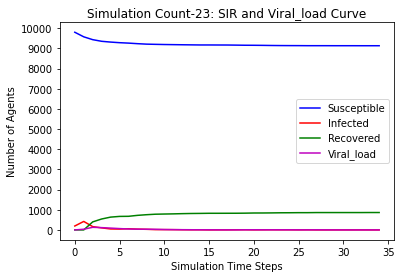

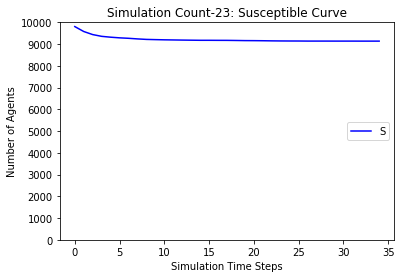

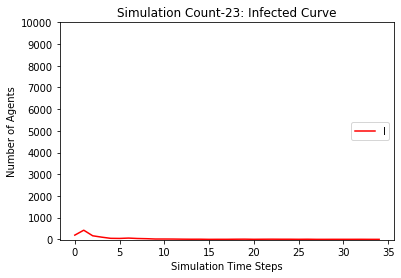

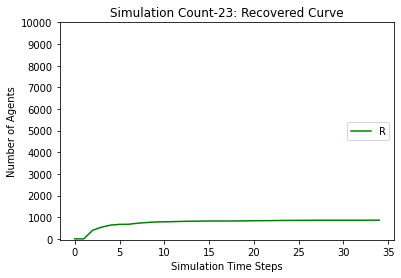

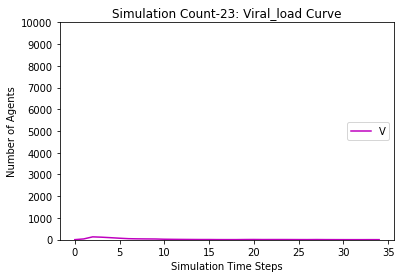

[9806, 9569, 9431, 9348, 9308, 9273, 9243, 9220, 9208, 9200, 9197, 9190, 9187, 9185, 9181, 9175, 9170, 9165, 9161, 9155, 9154, 9153, 9151, 9150, 9149, 9148, 9147, 9147, 9145, 9143, 9142, 9141, 9139, 9138, 9136, 9134, 9132, 9131, 9129, 9124, 9123, 9122, 9121, 9121, 9120, 9119, 9119, 9116, 9113, 9108, 9106, 9105, 9103, 9103, 9103]
[194, 431, 154, 100, 46, 46, 63, 28, 13, 12, 6, 11, 4, 3, 7, 8, 6, 6, 6, 8, 1, 1, 3, 1, 2, 3, 1, 0, 2, 3, 1, 1, 3, 1, 3, 2, 2, 2, 4, 6, 1, 1, 1, 0, 1, 1, 1, 4, 3, 7, 2, 3, 2, 0, 0]
[0, 0, 415, 552, 646, 681, 694, 752, 779, 788, 797, 799, 809, 812, 812, 817, 824, 829, 833, 837, 845, 846, 846, 849, 849, 849, 852, 853, 853, 854, 857, 858, 858, 861, 861, 864, 866, 867, 867, 870, 876, 877, 878, 879, 879, 880, 880, 880, 884, 885, 892, 892, 895, 897, 897]
[0.0, 24.0, 132.0, 108.0, 88.0, 59.0, 43.5, 38.75, 28.375, 16.1875, 11.09375, 9.546875, 10.7734375, 6.38671875, 4.193359375, 4.0966796875, 6.04833984375, 6.024169921875, 5.0120849609375, 5.50604248046875, 4.753021240

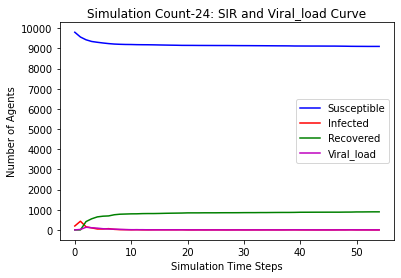

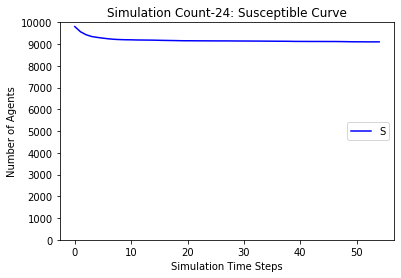

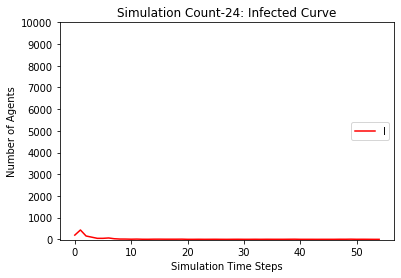

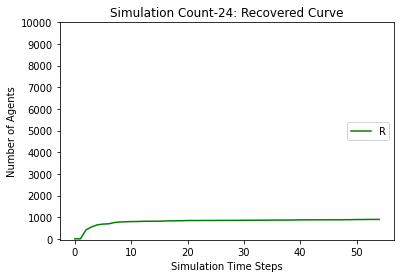

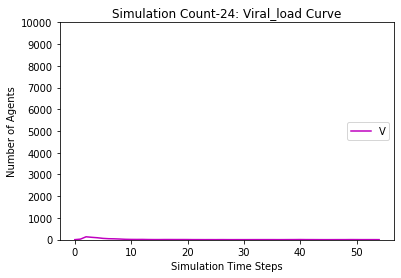

[9806, 9554, 9415, 9341, 9304, 9267, 9233, 9201, 9183, 9169, 9146, 9128, 9112, 9110, 9103, 9102, 9099, 9099, 9094, 9094, 9092, 9086, 9079, 9078, 9078, 9078, 9075, 9074, 9074]
[194, 446, 167, 90, 53, 49, 65, 42, 25, 22, 28, 28, 16, 3, 9, 2, 4, 1, 5, 1, 3, 7, 9, 3, 2, 1, 3, 1, 0]
[0, 0, 418, 569, 643, 684, 702, 757, 792, 809, 826, 844, 872, 887, 888, 896, 897, 900, 901, 905, 905, 907, 912, 919, 920, 921, 922, 925, 926]
[0.0, 30.0, 126.0, 114.0, 84.0, 65.0, 51.5, 49.75, 44.875, 38.4375, 27.21875, 22.609375, 19.3046875, 17.65234375, 10.826171875, 6.4130859375, 4.20654296875, 4.103271484375, 3.0516357421875, 4.52581787109375, 2.262908935546875, 2.1314544677734375, 3.0657272338867188, 4.532863616943359, 3.2664318084716797, 1.6332159042358398, 0.8166079521179199, 1.40830397605896, 0.70415198802948]
1095.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134

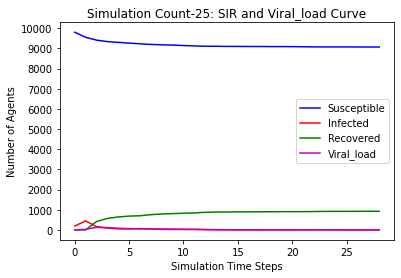

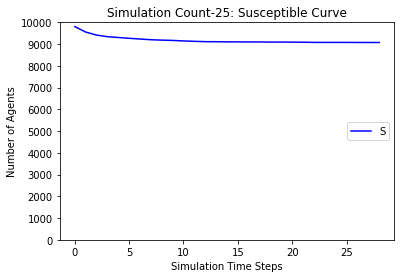

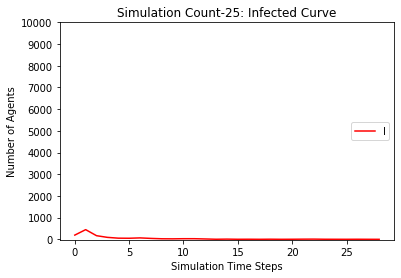

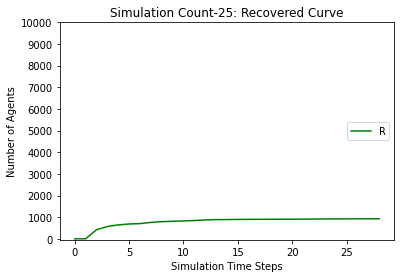

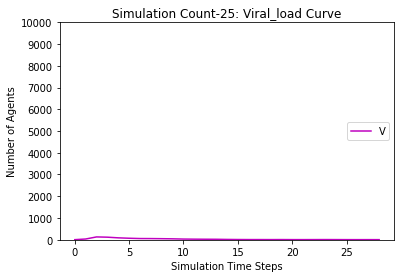

[9806, 9596, 9472, 9413, 9363, 9329, 9293, 9265, 9245, 9234, 9226, 9219, 9207, 9204, 9200, 9194, 9190, 9189, 9188, 9186, 9186, 9183, 9181, 9180, 9180]
[194, 404, 144, 75, 63, 47, 59, 43, 31, 19, 9, 10, 14, 5, 7, 12, 7, 3, 1, 2, 1, 4, 2, 1, 0]
[0, 0, 384, 512, 574, 624, 648, 692, 724, 747, 765, 771, 779, 791, 793, 794, 803, 808, 811, 812, 813, 813, 817, 819, 820]
[0.0, 26.0, 106.0, 86.0, 68.0, 62.0, 47.0, 41.5, 33.75, 25.875, 18.9375, 13.46875, 14.734375, 12.3671875, 9.18359375, 7.591796875, 7.7958984375, 5.89794921875, 3.948974609375, 2.9744873046875, 1.48724365234375, 1.743621826171875, 3.8718109130859375, 1.9359054565429688, 0.9679527282714844]
718.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9

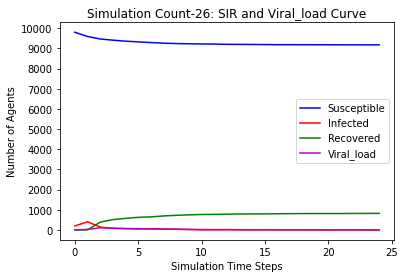

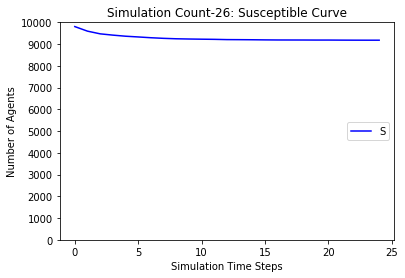

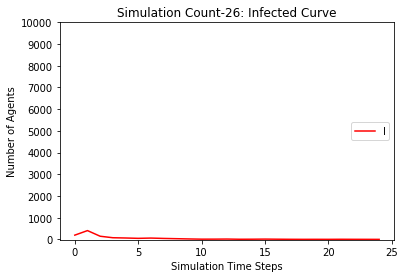

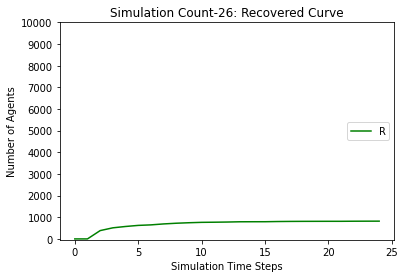

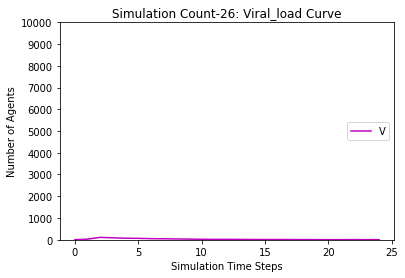

[9806, 9581, 9460, 9385, 9343, 9314, 9285, 9268, 9255, 9246, 9242, 9240, 9233, 9230, 9225, 9221, 9220, 9220, 9218, 9218, 9216, 9215, 9214, 9213, 9212, 9211, 9211, 9211]
[194, 419, 141, 96, 54, 37, 55, 21, 17, 15, 7, 3, 8, 6, 7, 4, 3, 1, 3, 0, 2, 1, 1, 2, 1, 1, 0, 0]
[0, 0, 399, 519, 603, 649, 660, 711, 728, 739, 751, 757, 759, 764, 768, 775, 777, 779, 779, 782, 782, 784, 785, 785, 787, 788, 789, 789]
[0.0, 31.0, 126.5, 98.25, 75.125, 54.5625, 38.28125, 37.140625, 24.5703125, 16.28515625, 15.142578125, 9.5712890625, 6.78564453125, 7.392822265625, 6.6964111328125, 7.34820556640625, 3.674102783203125, 1.8370513916015625, 0.9185256958007812, 1.4592628479003906, 0.7296314239501953, 0.36481571197509766, 1.1824078559875488, 1.5912039279937744, 0.7956019639968872, 1.3978009819984436, 1.6989004909992218, 0.8494502454996109]
2069.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138

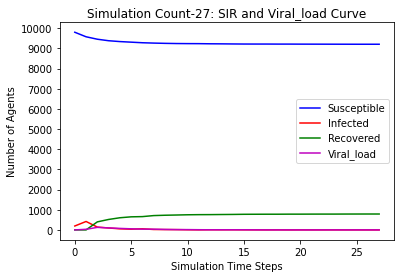

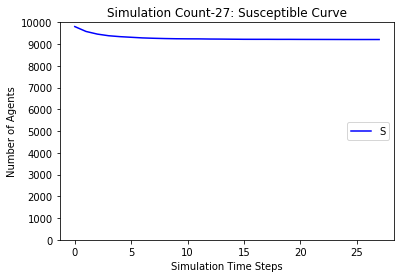

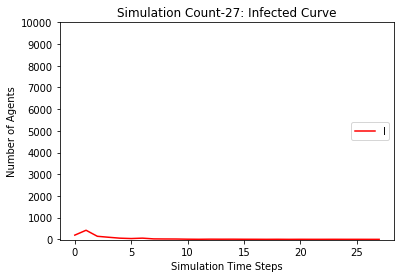

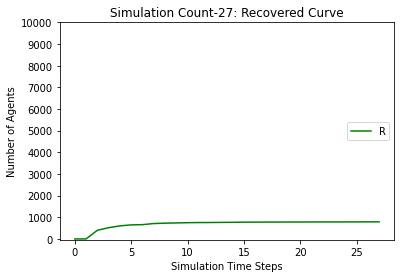

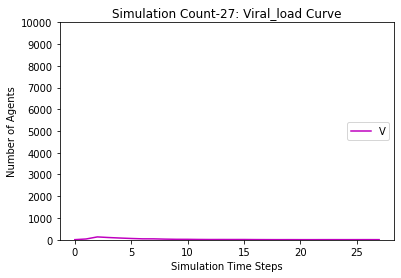

[9806, 9595, 9465, 9392, 9354, 9333, 9312, 9298, 9291, 9286, 9282, 9280, 9279, 9277, 9274, 9271, 9269, 9267, 9267, 9266, 9265, 9265, 9264, 9263, 9262, 9262]
[194, 405, 157, 87, 47, 34, 40, 24, 14, 8, 4, 3, 4, 5, 5, 5, 4, 4, 1, 1, 1, 0, 1, 1, 1, 0]
[0, 0, 378, 521, 599, 633, 648, 678, 695, 706, 714, 717, 717, 718, 721, 724, 727, 729, 732, 733, 734, 735, 735, 736, 737, 738]
[0.0, 26.0, 123.0, 106.5, 79.25, 53.625, 34.8125, 27.40625, 18.703125, 13.3515625, 10.67578125, 6.337890625, 4.1689453125, 3.08447265625, 1.542236328125, 0.7711181640625, 1.38555908203125, 0.692779541015625, 1.3463897705078125, 1.6731948852539062, 1.8365974426269531, 1.9182987213134766, 0.9591493606567383, 1.4795746803283691, 0.7397873401641846, 0.3698936700820923]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 92

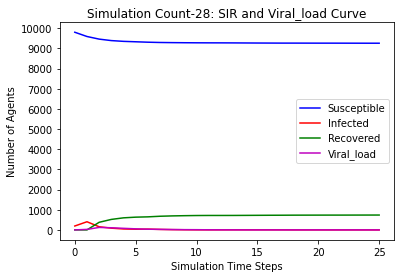

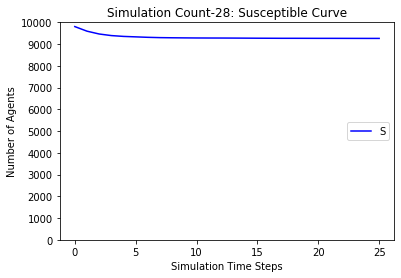

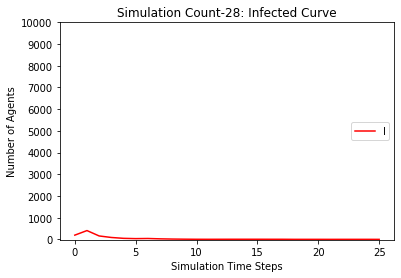

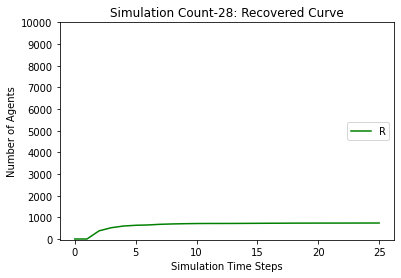

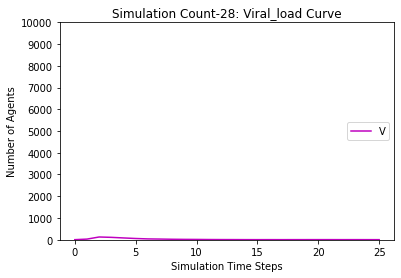

[9806, 9594, 9474, 9396, 9352, 9314, 9270, 9244, 9222, 9207, 9195, 9184, 9178, 9173, 9169, 9167, 9166, 9164, 9164, 9163, 9163, 9162, 9160, 9158, 9157, 9157, 9157, 9157]
[194, 406, 145, 100, 63, 53, 71, 33, 29, 19, 14, 18, 10, 6, 4, 2, 1, 3, 0, 1, 0, 1, 2, 2, 1, 0, 0, 0]
[0, 0, 381, 504, 585, 633, 659, 723, 749, 774, 791, 798, 812, 821, 827, 831, 833, 833, 836, 836, 837, 837, 838, 840, 842, 843, 843, 843]
[0.0, 21.0, 104.5, 95.25, 79.625, 61.8125, 54.90625, 54.453125, 44.2265625, 33.11328125, 25.556640625, 19.7783203125, 18.88916015625, 12.444580078125, 8.2222900390625, 4.11114501953125, 2.055572509765625, 1.0277862548828125, 2.5138931274414062, 1.2569465637207031, 1.6284732818603516, 0.8142366409301758, 0.4071183204650879, 1.203559160232544, 2.601779580116272, 2.300889790058136, 1.150444895029068, 0.575222447514534]
1967.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 913

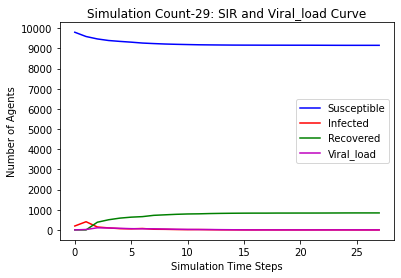

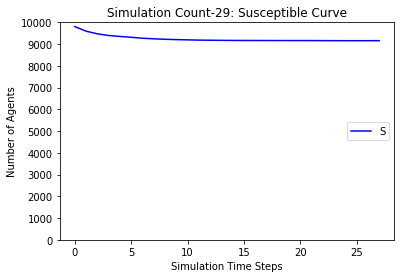

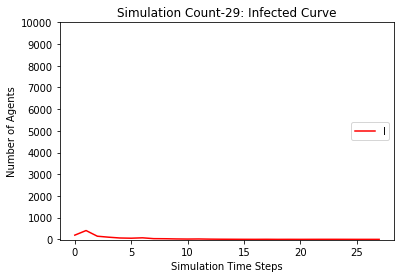

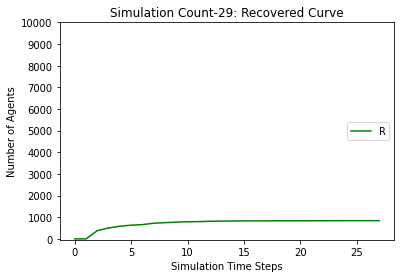

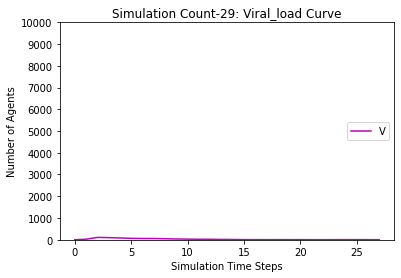

[9806, 9592, 9477, 9411, 9369, 9331, 9299, 9273, 9250, 9232, 9221, 9211, 9208, 9206, 9205, 9203, 9199, 9197, 9196, 9194, 9193, 9193, 9192, 9191, 9190, 9189, 9188, 9188, 9187, 9187, 9186, 9185, 9185, 9184, 9184, 9184]
[194, 408, 130, 87, 53, 51, 52, 39, 29, 23, 15, 11, 3, 3, 1, 3, 5, 2, 1, 2, 2, 0, 1, 1, 2, 3, 2, 1, 1, 0, 1, 1, 0, 1, 0, 0]
[0, 0, 393, 502, 578, 618, 649, 688, 721, 745, 764, 778, 789, 791, 794, 794, 796, 801, 803, 804, 805, 807, 807, 808, 808, 808, 810, 811, 812, 813, 813, 814, 815, 815, 816, 816]
[0.0, 23.0, 119.5, 96.75, 84.375, 62.1875, 47.09375, 37.546875, 34.7734375, 31.38671875, 23.693359375, 19.8466796875, 12.92333984375, 9.461669921875, 4.7308349609375, 2.36541748046875, 3.182708740234375, 6.5913543701171875, 5.295677185058594, 3.647838592529297, 3.8239192962646484, 1.9119596481323242, 0.9559798240661621, 1.477989912033081, 0.7389949560165405, 2.3694974780082703, 3.184748739004135, 1.5923743695020676, 0.7961871847510338, 1.398093592375517, 0.6990467961877584, 1.3

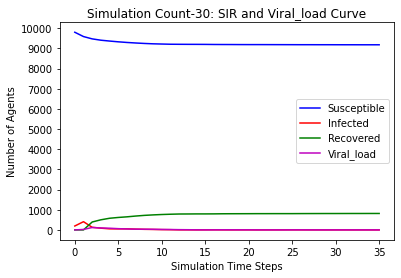

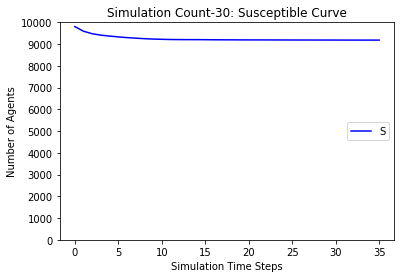

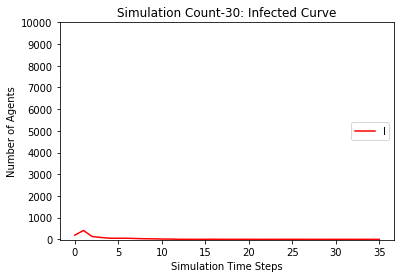

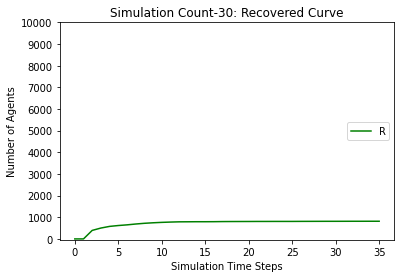

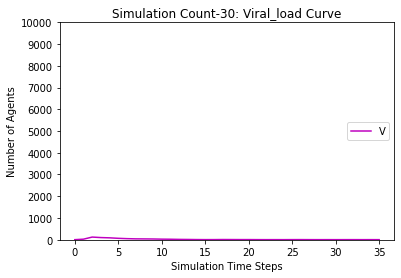

[9806, 9602, 9493, 9413, 9348, 9318, 9277, 9265, 9255, 9245, 9243, 9242, 9240, 9236, 9236, 9231, 9230, 9230]
[194, 398, 129, 108, 82, 42, 56, 21, 15, 13, 6, 4, 5, 5, 2, 7, 1, 0]
[0, 0, 378, 479, 570, 640, 667, 714, 730, 742, 751, 754, 755, 759, 762, 762, 769, 770]
[0.0, 23.0, 117.5, 103.75, 82.875, 74.4375, 58.21875, 46.109375, 29.0546875, 21.52734375, 13.763671875, 8.8818359375, 4.44091796875, 4.220458984375, 3.1102294921875, 1.55511474609375, 1.777557373046875, 0.8887786865234375]
2102.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 9

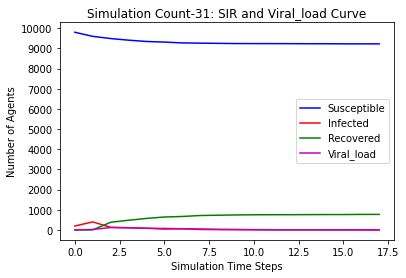

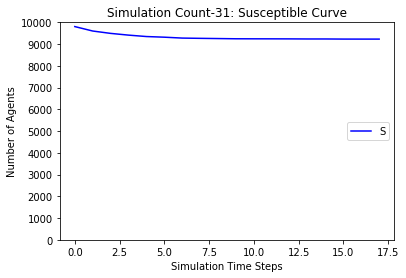

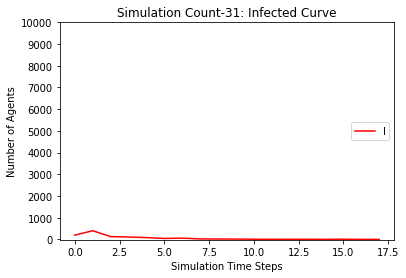

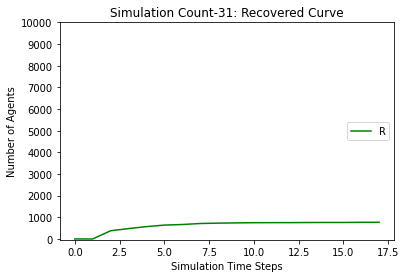

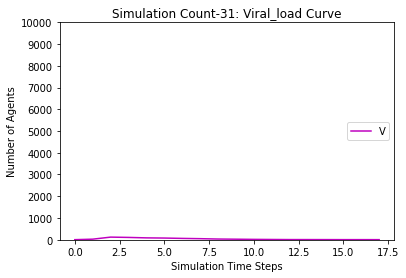

[9806, 9606, 9461, 9359, 9288, 9238, 9194, 9162, 9141, 9120, 9113, 9097, 9086, 9079, 9068, 9062, 9057, 9047, 9039, 9032, 9032, 9030, 9027, 9026, 9025, 9025, 9025, 9025]
[194, 394, 174, 126, 88, 66, 96, 51, 32, 27, 11, 25, 13, 10, 15, 10, 14, 11, 10, 10, 1, 2, 3, 1, 1, 0, 0, 0]
[0, 0, 365, 515, 624, 696, 710, 787, 827, 853, 876, 878, 901, 911, 917, 928, 929, 942, 951, 958, 967, 968, 970, 973, 974, 975, 975, 975]
[0.0, 28.0, 112.0, 111.0, 95.5, 74.75, 68.375, 61.1875, 51.59375, 40.796875, 26.3984375, 19.19921875, 21.599609375, 19.7998046875, 13.89990234375, 11.949951171875, 7.9749755859375, 8.98748779296875, 6.493743896484375, 8.246871948242188, 6.123435974121094, 3.061717987060547, 3.5308589935302734, 2.7654294967651367, 2.3827147483825684, 2.191357374191284, 1.095678687095642, 0.547839343547821]
1811.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 

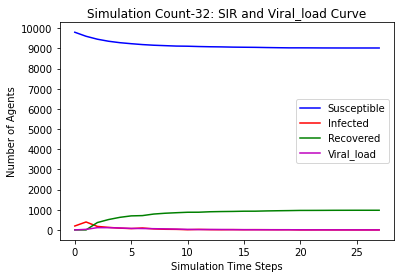

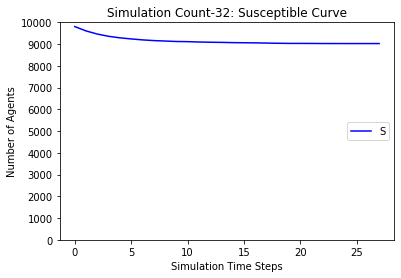

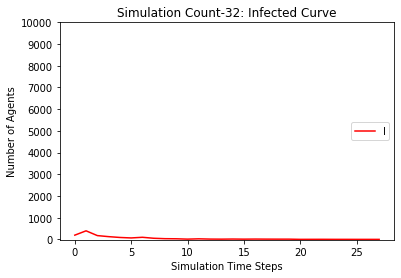

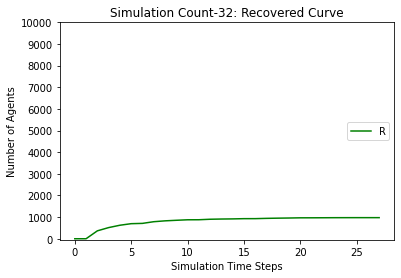

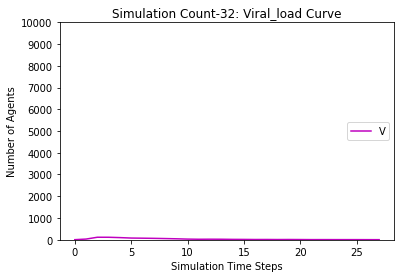

[9806, 9591, 9471, 9419, 9376, 9345, 9313, 9292, 9281, 9270, 9264, 9258, 9251, 9248, 9245, 9240, 9236, 9236, 9235, 9235, 9235, 9235]
[194, 409, 142, 70, 56, 39, 46, 28, 17, 17, 8, 7, 9, 4, 5, 8, 4, 0, 1, 0, 0, 0]
[0, 0, 387, 511, 568, 616, 641, 680, 702, 713, 728, 735, 740, 748, 750, 752, 760, 764, 764, 765, 765, 765]
[0.0, 28.0, 124.0, 99.0, 68.5, 53.25, 41.625, 35.8125, 24.90625, 18.453125, 14.2265625, 11.11328125, 8.556640625, 6.2783203125, 7.13916015625, 5.569580078125, 5.7847900390625, 5.89239501953125, 2.946197509765625, 2.4730987548828125, 1.2365493774414062, 0.6182746887207031]
2701.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 

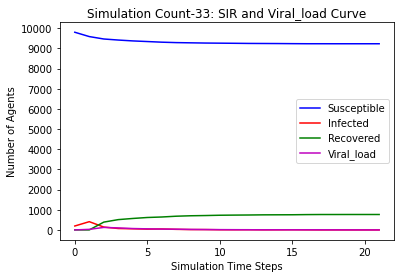

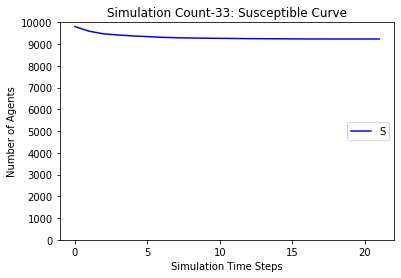

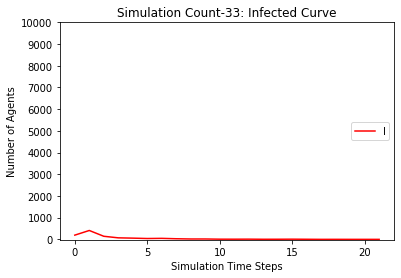

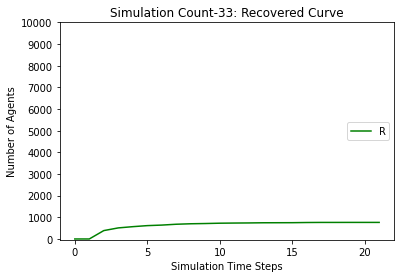

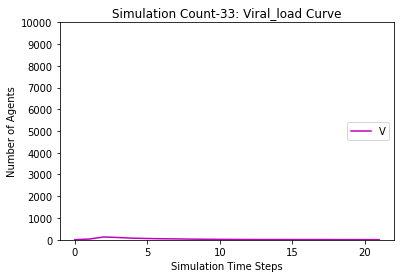

[9806, 9592, 9453, 9372, 9319, 9285, 9250, 9226, 9214, 9198, 9186, 9176, 9173, 9169, 9165, 9161, 9160, 9159, 9158, 9157, 9156, 9155, 9155, 9155, 9155]
[194, 408, 160, 106, 69, 47, 61, 29, 20, 24, 15, 13, 4, 5, 4, 4, 3, 3, 3, 1, 1, 1, 0, 0, 0]
[0, 0, 387, 522, 612, 668, 689, 745, 766, 778, 799, 811, 823, 826, 831, 835, 837, 838, 839, 842, 843, 844, 845, 845, 845]
[0.0, 23.0, 123.5, 112.75, 86.375, 60.1875, 47.09375, 40.546875, 34.2734375, 25.13671875, 19.568359375, 17.7841796875, 10.89208984375, 7.446044921875, 7.7230224609375, 5.86151123046875, 3.930755615234375, 2.9653778076171875, 3.4826889038085938, 2.741344451904297, 2.3706722259521484, 2.185336112976074, 2.092668056488037, 1.0463340282440186, 0.5231670141220093]
637.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9

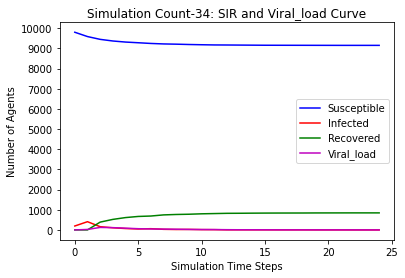

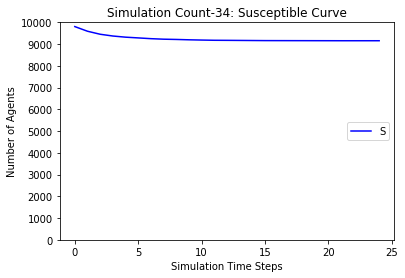

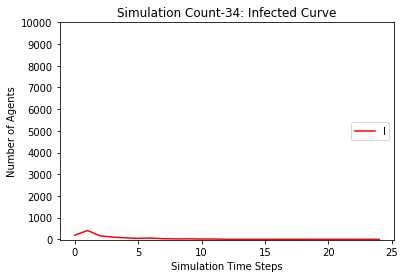

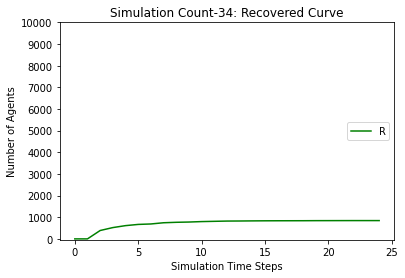

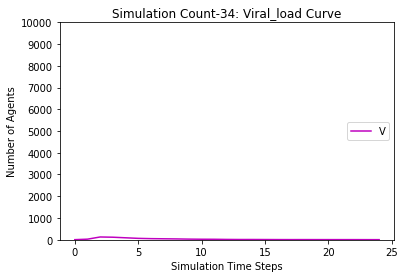

[9806, 9607, 9491, 9413, 9360, 9325, 9295, 9276, 9263, 9250, 9243, 9235, 9231, 9225, 9221, 9218, 9216, 9213, 9209, 9208, 9208, 9208, 9207, 9207, 9207]
[194, 393, 144, 101, 68, 50, 59, 32, 23, 18, 10, 12, 6, 10, 5, 3, 3, 4, 5, 2, 0, 0, 1, 0, 0]
[0, 0, 365, 486, 572, 625, 646, 692, 714, 732, 747, 753, 763, 765, 774, 779, 781, 783, 786, 790, 792, 792, 792, 793, 793]
[0.0, 20.0, 113.0, 98.5, 82.25, 70.125, 50.0625, 42.03125, 29.015625, 23.5078125, 17.75390625, 15.876953125, 8.9384765625, 5.46923828125, 7.734619140625, 6.8673095703125, 5.43365478515625, 5.716827392578125, 4.8584136962890625, 7.429206848144531, 3.7146034240722656, 1.8573017120361328, 0.9286508560180664, 1.4643254280090332, 0.7321627140045166]
830.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 920

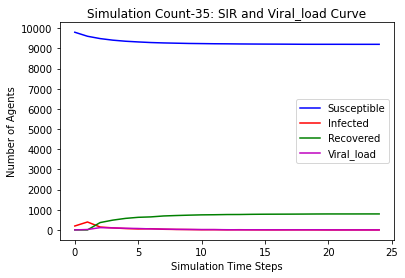

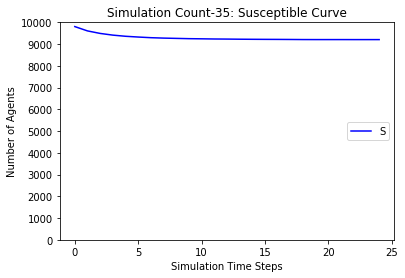

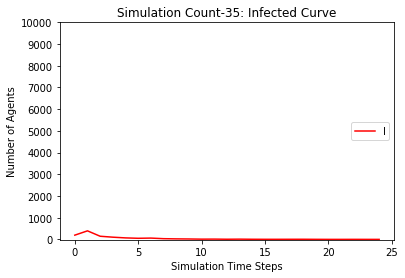

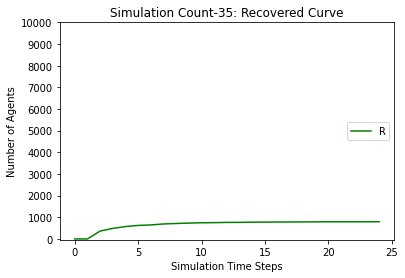

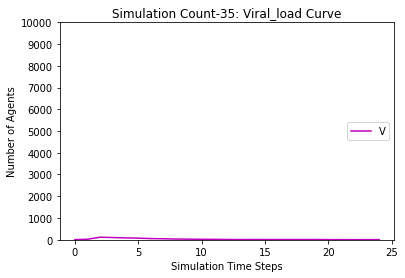

[9806, 9570, 9435, 9375, 9327, 9286, 9251, 9232, 9223, 9218, 9209, 9200, 9198, 9195, 9193, 9192, 9191, 9191]
[194, 430, 159, 77, 68, 56, 71, 25, 15, 9, 13, 9, 3, 5, 3, 2, 2, 0]
[0, 0, 406, 548, 605, 658, 678, 743, 762, 773, 778, 791, 799, 800, 804, 806, 807, 809]
[0.0, 32.0, 129.0, 107.5, 80.75, 57.375, 44.6875, 38.34375, 28.171875, 16.0859375, 11.04296875, 10.521484375, 9.2607421875, 5.63037109375, 4.815185546875, 2.4075927734375, 1.20379638671875, 0.601898193359375]
2044.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 9373, 9337, 9300

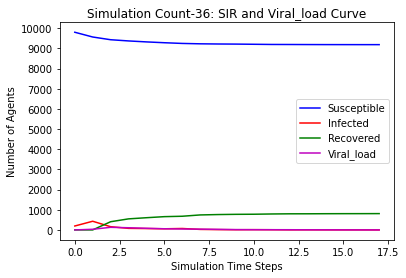

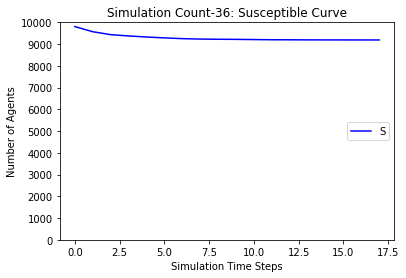

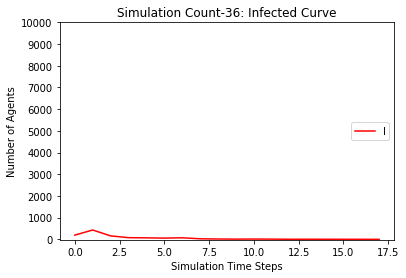

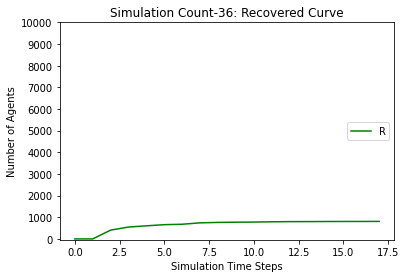

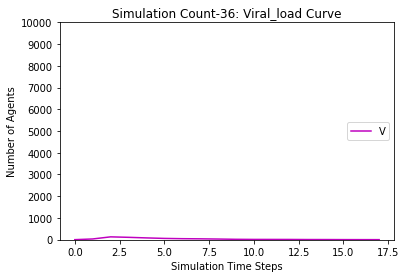

[9806, 9590, 9445, 9355, 9296, 9260, 9211, 9183, 9172, 9168, 9160, 9156, 9151, 9148, 9144, 9143, 9141, 9139, 9139, 9139, 9137, 9137, 9136, 9136, 9135, 9135, 9135]
[194, 410, 167, 112, 77, 52, 91, 39, 15, 10, 11, 11, 7, 3, 4, 1, 2, 2, 0, 0, 2, 1, 1, 0, 1, 0, 0]
[0, 0, 388, 533, 627, 688, 698, 778, 813, 822, 829, 833, 842, 849, 852, 856, 857, 859, 861, 861, 861, 862, 863, 864, 864, 865, 865]
[0.0, 31.0, 122.5, 110.25, 97.125, 71.5625, 53.78125, 47.890625, 37.9453125, 22.97265625, 13.486328125, 9.7431640625, 8.87158203125, 9.435791015625, 6.7178955078125, 6.35894775390625, 4.179473876953125, 3.0897369384765625, 3.5448684692382812, 1.7724342346191406, 0.8862171173095703, 1.4431085586547852, 0.7215542793273926, 1.3607771396636963, 0.6803885698318481, 1.340194284915924, 0.670097142457962]
2638.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9

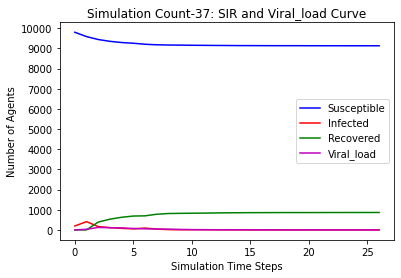

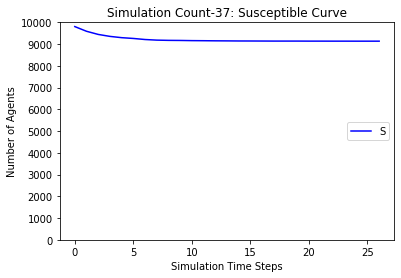

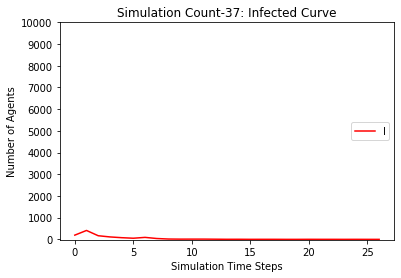

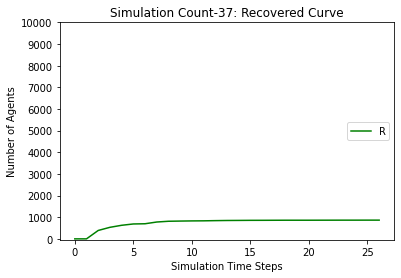

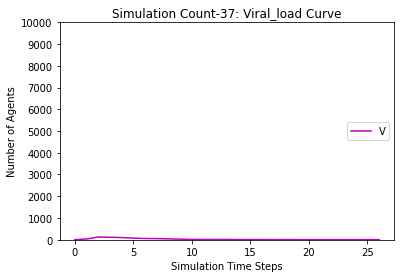

[9806, 9571, 9454, 9389, 9360, 9329, 9306, 9285, 9273, 9265, 9256, 9252, 9251, 9251, 9251, 9251, 9251]
[194, 429, 136, 77, 44, 48, 44, 32, 20, 16, 14, 8, 1, 0, 0, 0, 0]
[0, 0, 410, 534, 596, 623, 650, 683, 707, 719, 730, 740, 748, 749, 749, 749, 749]
[0.0, 23.0, 122.5, 99.25, 71.625, 53.8125, 40.90625, 34.453125, 28.2265625, 21.11328125, 16.556640625, 10.2783203125, 7.13916015625, 4.569580078125, 2.2847900390625, 1.14239501953125, 0.571197509765625]
2743.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 9373, 9337, 9300, 9276, 9263, 9254,

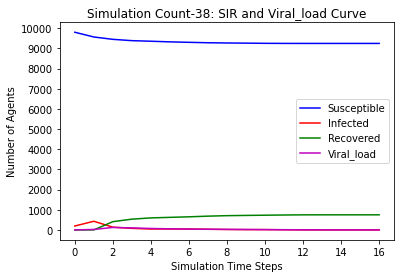

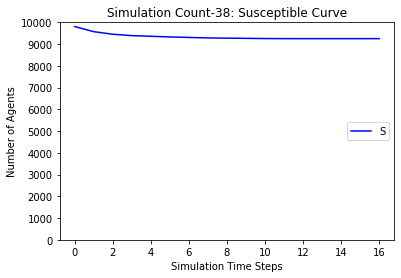

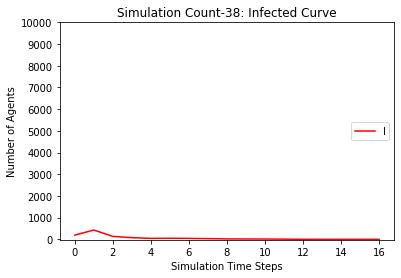

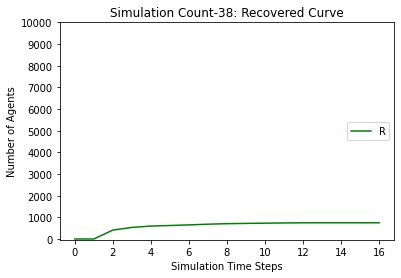

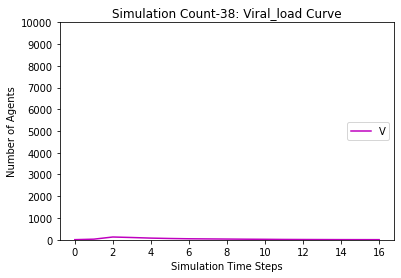

[9806, 9584, 9453, 9375, 9318, 9283, 9251, 9225, 9206, 9183, 9173, 9162, 9157, 9155, 9150, 9148, 9146, 9144, 9143, 9142, 9142]
[194, 416, 154, 98, 75, 47, 65, 32, 24, 29, 13, 16, 6, 2, 5, 2, 2, 2, 1, 1, 0]
[0, 0, 393, 527, 607, 670, 684, 743, 770, 788, 814, 822, 837, 843, 845, 850, 852, 854, 856, 857, 858]
[0.0, 25.0, 113.5, 107.75, 78.875, 66.4375, 47.21875, 44.609375, 33.3046875, 27.65234375, 25.826171875, 18.9130859375, 17.45654296875, 10.728271484375, 7.3641357421875, 4.68206787109375, 2.341033935546875, 2.1705169677734375, 1.0852584838867188, 1.5426292419433594, 0.7713146209716797]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401,

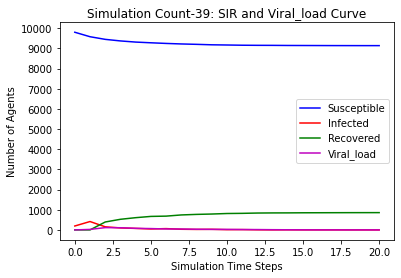

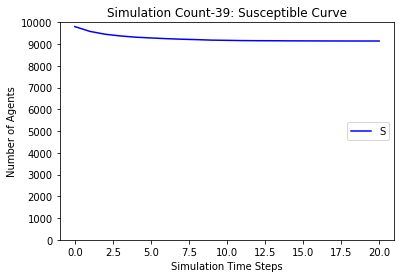

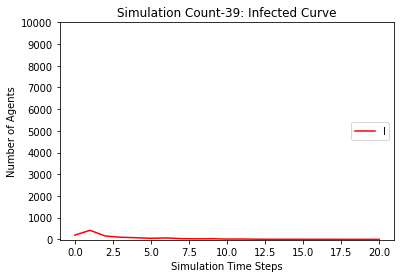

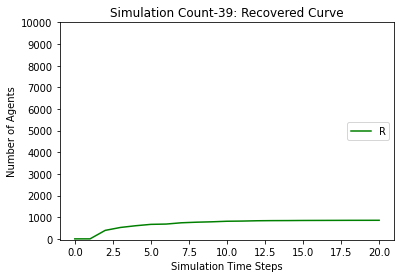

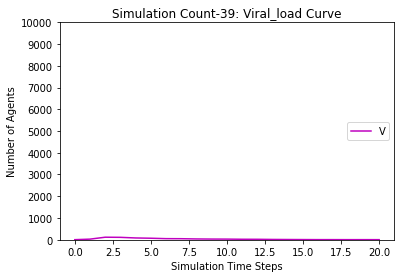

[9806, 9616, 9495, 9417, 9357, 9306, 9260, 9231, 9216, 9195, 9183, 9178, 9176, 9172, 9169, 9167, 9166, 9165, 9165, 9163, 9161, 9159, 9158, 9157, 9156, 9155, 9154, 9154, 9153, 9153, 9152, 9152, 9150, 9150, 9149, 9149, 9148, 9147, 9147, 9147]
[194, 384, 151, 99, 82, 69, 94, 44, 27, 33, 19, 8, 3, 5, 4, 2, 1, 1, 1, 3, 4, 3, 1, 1, 1, 1, 1, 0, 1, 1, 2, 1, 2, 0, 1, 0, 1, 2, 0, 0]
[0, 0, 354, 484, 561, 625, 646, 725, 757, 772, 798, 814, 821, 823, 827, 831, 833, 834, 834, 834, 835, 838, 841, 842, 843, 844, 845, 846, 846, 846, 846, 847, 848, 850, 850, 851, 851, 851, 853, 853]
[0.0, 25.0, 115.5, 100.75, 83.375, 70.6875, 58.34375, 54.171875, 38.0859375, 30.04296875, 22.021484375, 18.0107421875, 11.00537109375, 6.502685546875, 6.2513427734375, 5.12567138671875, 4.562835693359375, 3.2814178466796875, 1.6407089233398438, 1.8203544616699219, 1.910177230834961, 2.9550886154174805, 2.4775443077087402, 1.2387721538543701, 1.619386076927185, 1.8096930384635925, 0.9048465192317963, 1.4524232596158981, 0.72

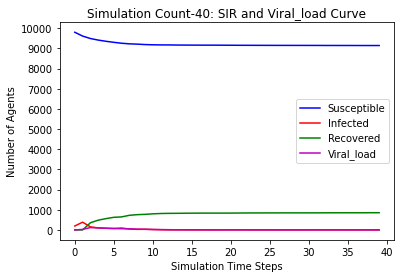

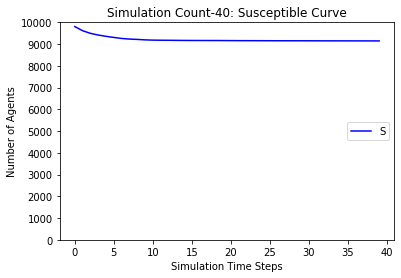

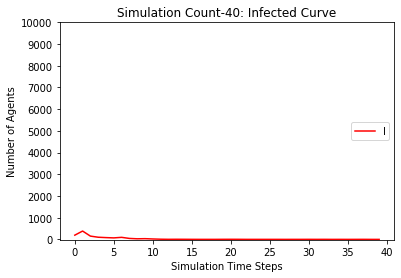

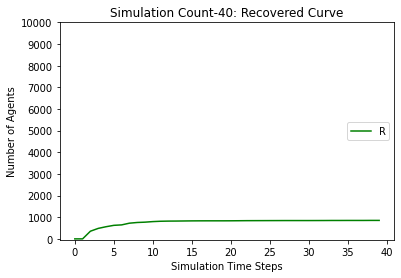

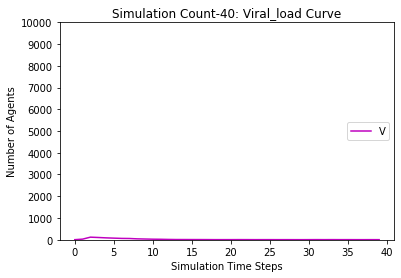

[9806, 9589, 9475, 9409, 9355, 9326, 9287, 9259, 9235, 9223, 9215, 9210, 9207, 9205, 9204, 9204, 9204, 9204]
[194, 411, 137, 83, 64, 44, 65, 36, 31, 14, 10, 8, 3, 2, 1, 0, 0, 0]
[0, 0, 388, 508, 581, 630, 648, 705, 734, 763, 775, 782, 790, 793, 795, 796, 796, 796]
[0.0, 30.0, 120.0, 106.0, 79.0, 63.5, 47.75, 42.875, 40.4375, 31.21875, 23.609375, 13.8046875, 10.90234375, 7.451171875, 5.7255859375, 3.86279296875, 1.931396484375, 0.9656982421875]
2045.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 9373, 9337, 9300, 9276, 9263, 9254, 9245,

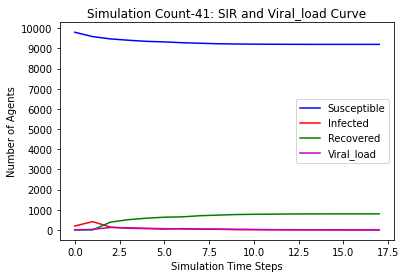

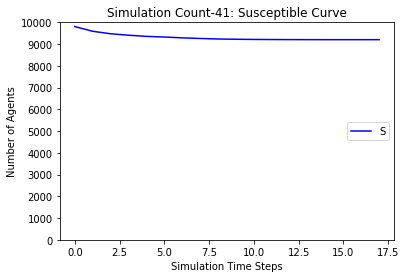

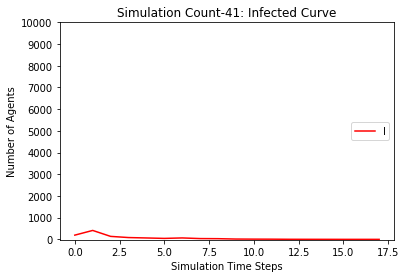

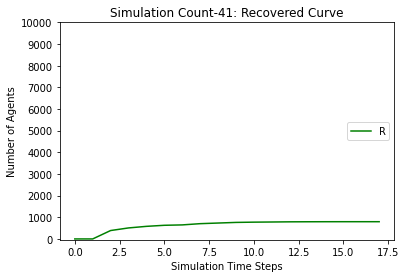

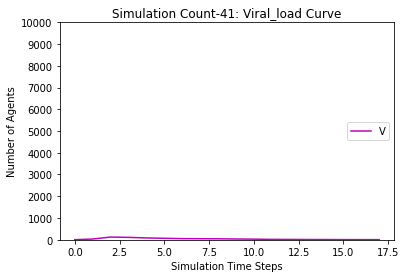

[9806, 9583, 9457, 9376, 9328, 9291, 9247, 9211, 9187, 9169, 9147, 9132, 9122, 9115, 9106, 9094, 9090, 9088, 9086, 9084, 9084, 9084]
[194, 417, 143, 105, 58, 56, 74, 47, 34, 28, 32, 25, 12, 12, 14, 14, 8, 3, 4, 2, 0, 0]
[0, 0, 400, 519, 614, 653, 679, 742, 779, 803, 821, 843, 866, 873, 880, 892, 902, 909, 910, 914, 916, 916]
[0.0, 26.0, 137.0, 117.5, 100.75, 75.375, 60.6875, 67.34375, 53.671875, 42.8359375, 33.41796875, 28.708984375, 22.3544921875, 16.17724609375, 15.088623046875, 14.5443115234375, 12.27215576171875, 8.136077880859375, 5.0680389404296875, 2.5340194702148438, 1.2670097351074219, 0.6335048675537109]
2611.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9

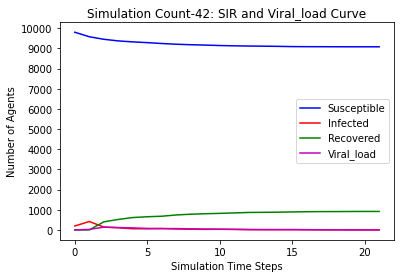

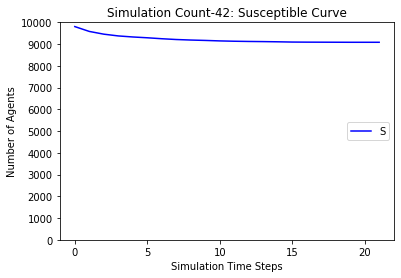

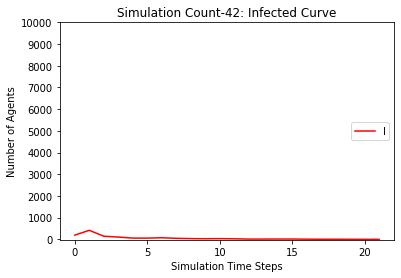

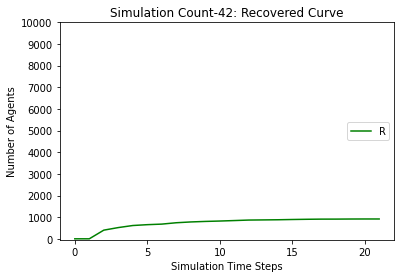

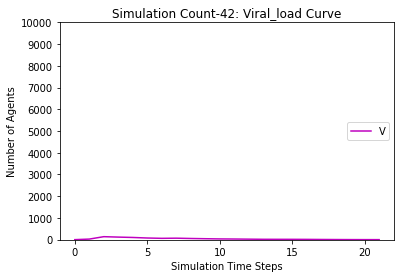

[9806, 9597, 9456, 9382, 9339, 9304, 9265, 9241, 9229, 9212, 9199, 9182, 9174, 9170, 9168, 9166, 9166, 9165, 9163, 9162, 9158, 9156, 9156, 9156]
[194, 403, 163, 94, 61, 48, 67, 28, 17, 26, 19, 22, 10, 4, 2, 3, 1, 2, 3, 4, 6, 3, 0, 0]
[0, 0, 381, 524, 600, 648, 668, 731, 754, 762, 782, 796, 816, 826, 830, 831, 833, 833, 834, 834, 836, 841, 844, 844]
[0.0, 29.0, 129.5, 115.75, 88.875, 62.4375, 51.21875, 44.609375, 35.3046875, 26.65234375, 23.326171875, 19.6630859375, 17.83154296875, 12.915771484375, 7.4578857421875, 3.72894287109375, 4.864471435546875, 2.4322357177734375, 2.2161178588867188, 2.1080589294433594, 3.0540294647216797, 2.52701473236084, 1.26350736618042, 0.63175368309021]
1315.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 

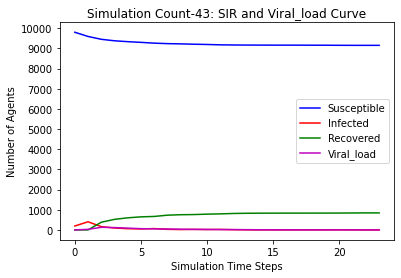

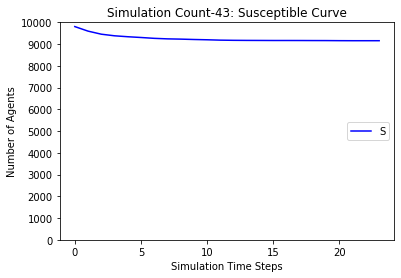

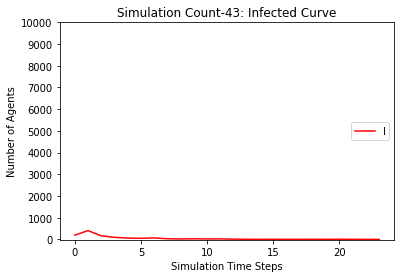

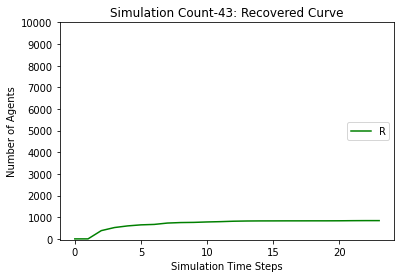

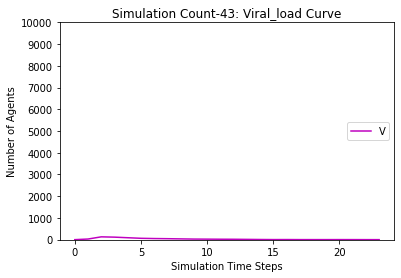

[9806, 9577, 9435, 9352, 9295, 9269, 9224, 9200, 9181, 9168, 9155, 9145, 9134, 9130, 9130, 9129, 9128, 9128, 9128]
[194, 423, 164, 109, 75, 46, 83, 33, 28, 21, 23, 22, 17, 7, 0, 1, 1, 0, 0]
[0, 0, 401, 539, 630, 685, 693, 767, 791, 811, 822, 833, 849, 863, 870, 870, 871, 872, 872]
[0.0, 30.0, 130.0, 115.0, 90.5, 68.25, 51.125, 45.5625, 34.78125, 29.390625, 21.6953125, 15.84765625, 12.923828125, 11.4619140625, 7.73095703125, 3.865478515625, 2.9327392578125, 1.46636962890625, 0.733184814453125]
1263.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 946

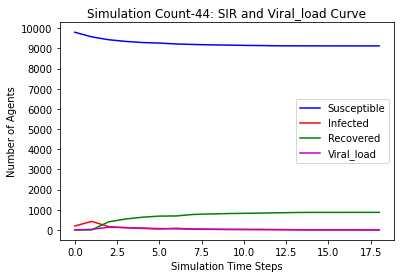

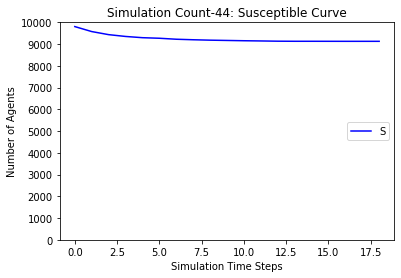

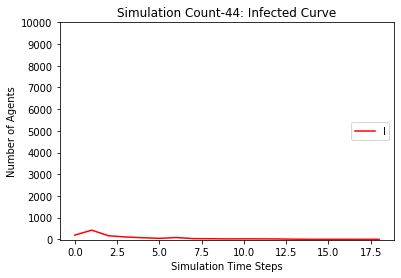

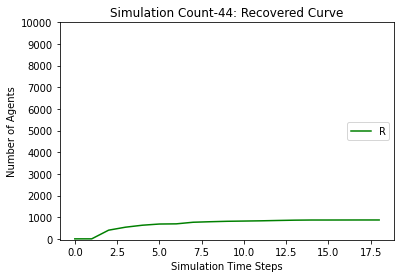

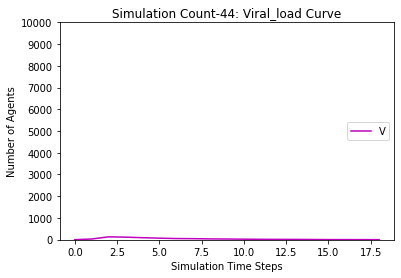

[9806, 9599, 9490, 9409, 9363, 9327, 9310, 9291, 9279, 9273, 9269, 9268, 9267, 9262, 9258, 9254, 9252, 9252, 9249, 9248, 9246, 9245, 9245, 9245, 9245, 9243, 9240, 9239, 9238, 9238]
[194, 401, 130, 106, 59, 49, 34, 28, 17, 8, 6, 4, 4, 6, 5, 4, 3, 2, 5, 2, 2, 2, 1, 1, 0, 2, 4, 1, 1, 0]
[0, 0, 380, 485, 578, 624, 656, 681, 704, 719, 725, 728, 729, 732, 737, 742, 745, 746, 746, 750, 752, 753, 754, 754, 755, 755, 756, 760, 761, 762]
[0.0, 23.0, 118.5, 97.25, 76.625, 54.3125, 38.15625, 28.078125, 21.0390625, 15.51953125, 10.759765625, 5.3798828125, 3.68994140625, 3.844970703125, 3.9224853515625, 3.96124267578125, 2.980621337890625, 3.4903106689453125, 1.7451553344726562, 1.8725776672363281, 0.9362888336181641, 1.468144416809082, 2.734072208404541, 2.3670361042022705, 1.1835180521011353, 0.5917590260505676, 2.295879513025284, 3.147939756512642, 1.573969878256321, 0.7869849391281605]
916.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 917

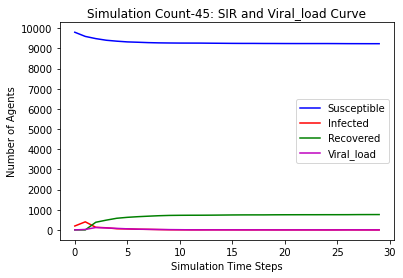

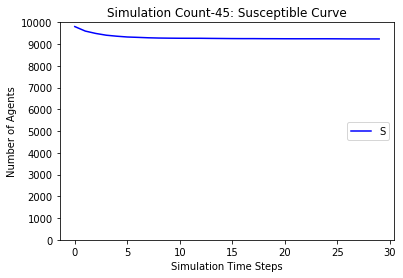

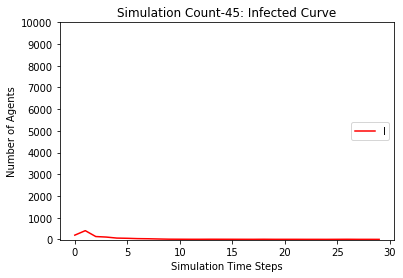

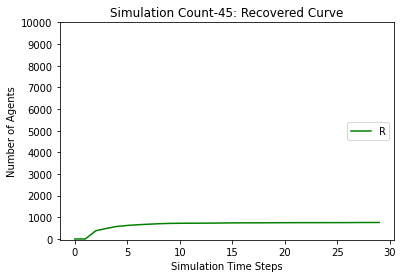

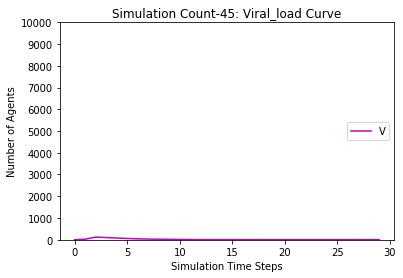

[9806, 9569, 9424, 9338, 9298, 9271, 9238, 9217, 9202, 9193, 9185, 9180, 9176, 9176, 9174, 9171, 9169, 9169, 9169]
[194, 431, 176, 110, 55, 42, 64, 28, 23, 15, 12, 5, 5, 0, 2, 4, 2, 0, 0]
[0, 0, 400, 552, 647, 687, 698, 755, 775, 792, 803, 815, 819, 824, 824, 825, 829, 831, 831]
[0.0, 30.0, 133.0, 103.5, 80.75, 58.375, 39.1875, 43.59375, 33.796875, 26.8984375, 17.44921875, 12.724609375, 10.3623046875, 7.18115234375, 3.590576171875, 3.7952880859375, 3.89764404296875, 1.948822021484375, 0.9744110107421875]
1365.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [980

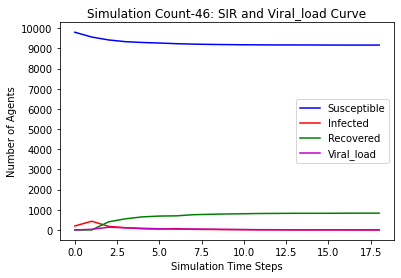

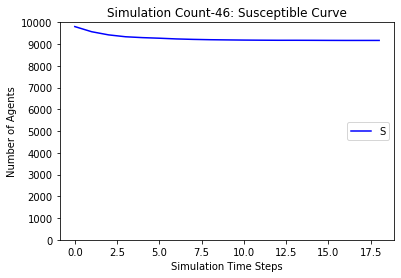

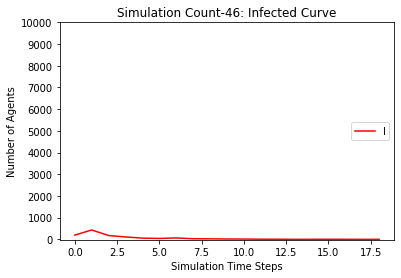

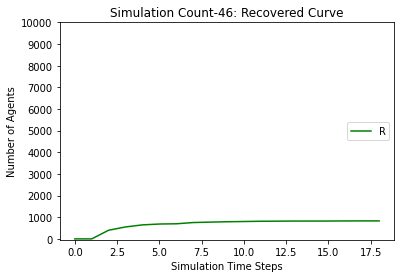

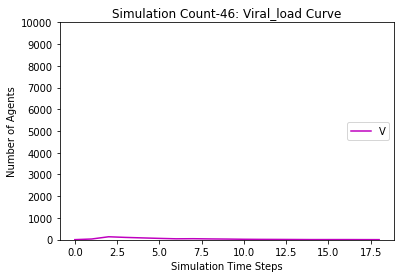

[9806, 9578, 9464, 9396, 9354, 9320, 9293, 9268, 9256, 9242, 9235, 9224, 9217, 9209, 9202, 9201, 9197, 9194, 9193, 9190, 9188, 9187, 9184, 9181, 9180, 9180, 9180, 9178, 9177, 9176, 9176, 9176]
[194, 422, 138, 81, 52, 44, 47, 33, 23, 23, 15, 17, 9, 11, 10, 2, 5, 4, 2, 4, 2, 2, 4, 3, 1, 0, 0, 2, 1, 1, 0, 0]
[0, 0, 398, 523, 594, 636, 660, 699, 721, 735, 750, 759, 774, 780, 788, 797, 798, 802, 805, 806, 810, 811, 812, 816, 819, 820, 820, 820, 822, 823, 824, 824]
[0.0, 25.0, 109.5, 88.75, 75.375, 53.6875, 44.84375, 37.421875, 29.7109375, 19.85546875, 17.927734375, 15.9638671875, 14.98193359375, 11.490966796875, 6.7454833984375, 7.37274169921875, 4.686370849609375, 5.3431854248046875, 3.6715927124023438, 1.8357963562011719, 1.917898178100586, 1.958949089050293, 2.9794745445251465, 5.489737272262573, 4.744868636131287, 2.3724343180656433, 1.1862171590328217, 0.5931085795164108, 1.2965542897582054, 1.6482771448791027, 1.8241385724395514, 0.9120692862197757]
2674.3333333333335
[[], [9806, 9602

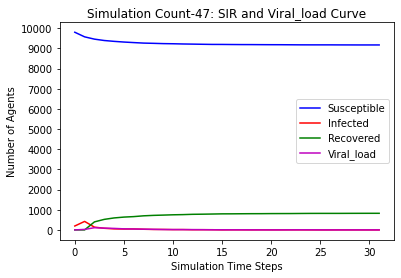

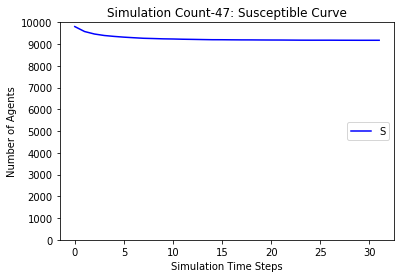

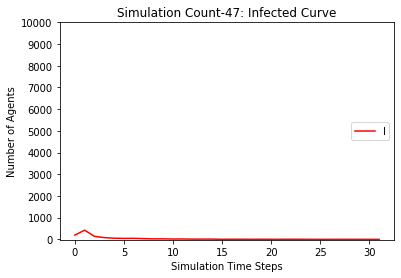

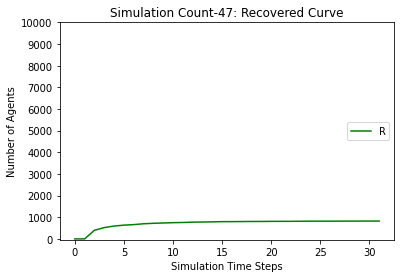

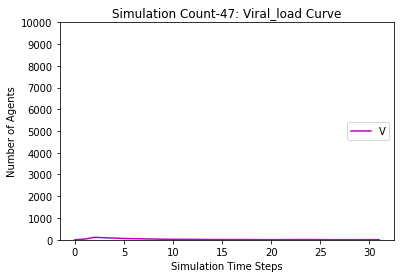

[9806, 9599, 9473, 9377, 9329, 9306, 9275, 9246, 9233, 9224, 9213, 9207, 9202, 9201, 9198, 9197, 9194, 9191, 9190, 9190, 9190, 9190]
[194, 401, 149, 115, 64, 35, 52, 37, 15, 13, 14, 8, 5, 1, 3, 2, 5, 3, 1, 0, 0, 0]
[0, 0, 378, 508, 607, 659, 673, 717, 752, 763, 773, 785, 793, 798, 799, 801, 801, 806, 809, 810, 810, 810]
[0.0, 27.0, 116.5, 109.25, 95.625, 66.8125, 48.40625, 47.203125, 34.6015625, 24.30078125, 18.150390625, 13.0751953125, 9.53759765625, 7.768798828125, 3.8843994140625, 3.94219970703125, 1.971099853515625, 3.9855499267578125, 4.992774963378906, 3.496387481689453, 1.7481937408447266, 0.8740968704223633]
2681.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806,

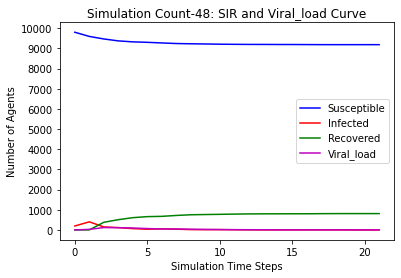

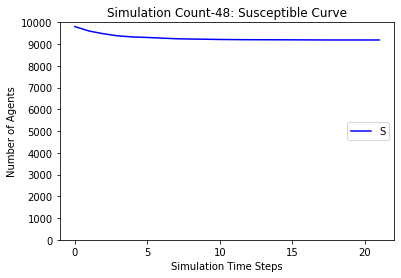

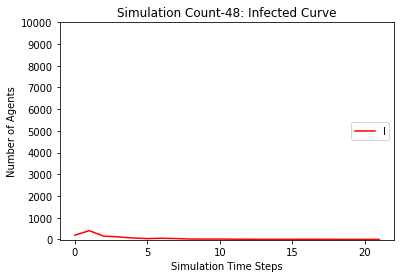

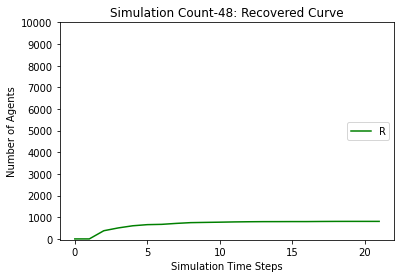

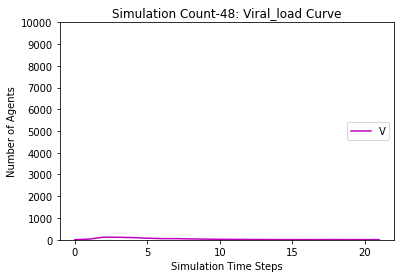

[9806, 9604, 9509, 9450, 9413, 9387, 9368, 9351, 9334, 9326, 9318, 9313, 9305, 9298, 9295, 9295, 9293, 9293, 9293]
[194, 396, 119, 79, 51, 34, 28, 26, 25, 11, 13, 9, 11, 8, 4, 0, 2, 0, 0]
[0, 0, 372, 471, 536, 579, 604, 623, 641, 663, 669, 678, 684, 694, 701, 705, 705, 707, 707]
[0.0, 23.0, 100.5, 82.25, 62.125, 50.0625, 39.03125, 28.515625, 22.2578125, 21.12890625, 16.564453125, 11.2822265625, 8.64111328125, 9.320556640625, 6.6602783203125, 3.33013916015625, 1.665069580078125, 1.8325347900390625, 0.9162673950195312]
1622.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303

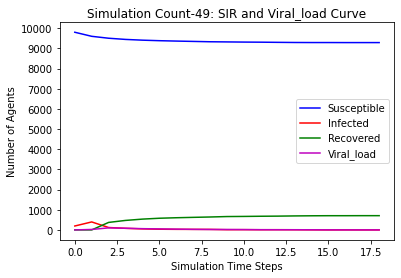

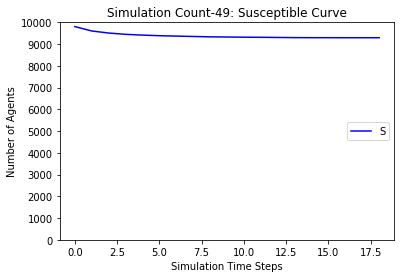

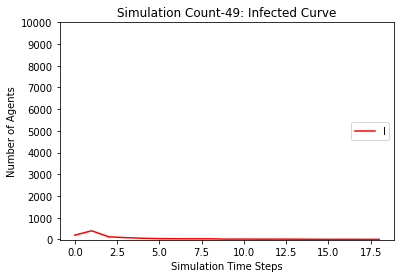

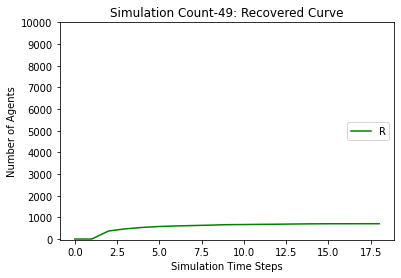

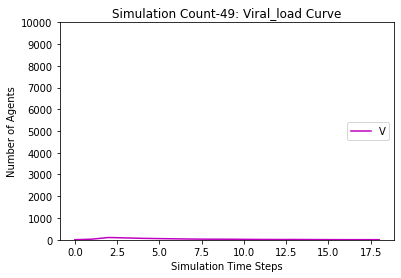

[9806, 9611, 9490, 9428, 9374, 9331, 9296, 9258, 9239, 9230, 9225, 9223, 9218, 9216, 9214, 9213, 9213, 9212, 9212, 9211, 9211]
[194, 389, 153, 82, 68, 64, 62, 47, 26, 14, 7, 3, 6, 2, 2, 1, 0, 1, 0, 1, 0]
[0, 0, 357, 490, 558, 605, 642, 695, 735, 756, 768, 774, 776, 782, 784, 786, 787, 787, 788, 788, 789]
[0.0, 22.0, 112.0, 103.0, 78.5, 62.25, 50.125, 49.0625, 36.53125, 22.265625, 15.1328125, 9.56640625, 5.783203125, 5.8916015625, 2.94580078125, 3.472900390625, 2.7364501953125, 1.36822509765625, 1.684112548828125, 0.8420562744140625, 0.42102813720703125]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 931

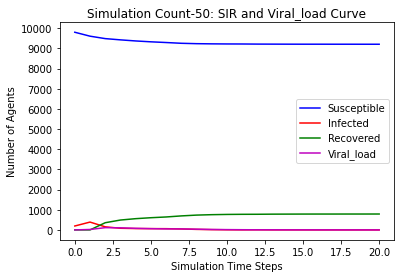

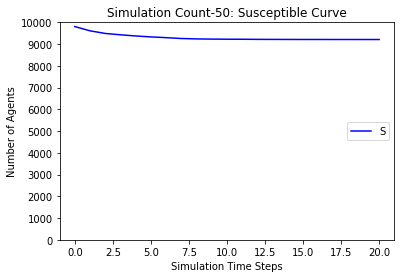

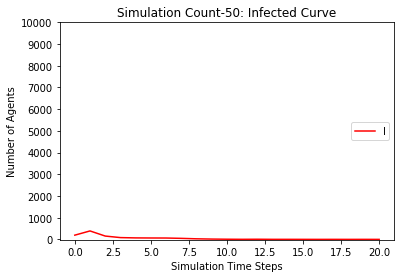

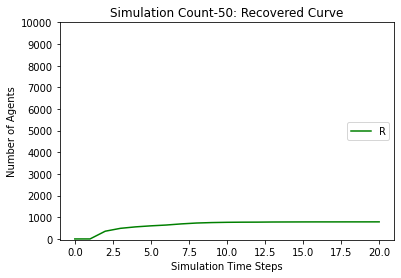

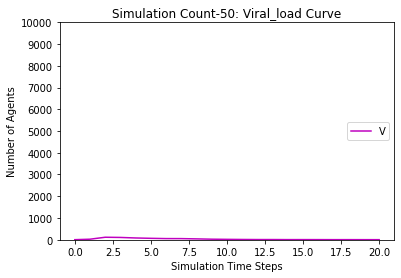

[9806, 9588, 9474, 9406, 9345, 9315, 9280, 9254, 9244, 9233, 9226, 9223, 9220, 9218, 9215, 9213, 9212, 9212, 9211, 9210, 9209, 9208, 9207, 9207, 9207]
[194, 412, 136, 90, 75, 44, 60, 30, 13, 15, 9, 4, 4, 4, 4, 2, 1, 0, 1, 1, 1, 2, 1, 0, 0]
[0, 0, 390, 504, 580, 641, 660, 716, 743, 752, 765, 773, 776, 778, 781, 785, 787, 788, 788, 789, 790, 790, 792, 793, 793]
[0.0, 31.0, 122.5, 92.25, 78.125, 65.0625, 49.53125, 41.765625, 31.8828125, 20.94140625, 15.470703125, 10.7353515625, 7.36767578125, 5.683837890625, 3.8419189453125, 3.92095947265625, 3.960479736328125, 2.9802398681640625, 1.4901199340820312, 1.7450599670410156, 1.8725299835205078, 1.936264991760254, 0.968132495880127, 1.4840662479400635, 0.7420331239700317]
830.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211,

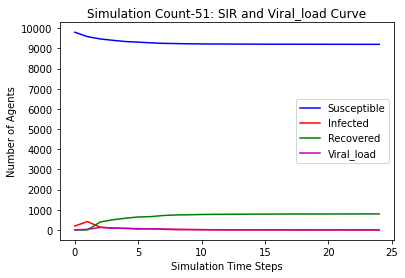

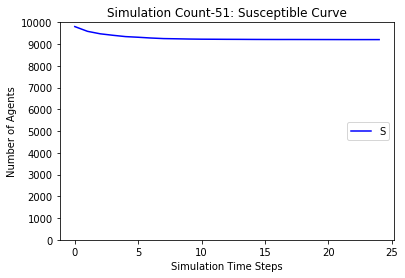

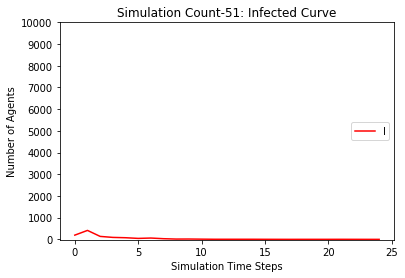

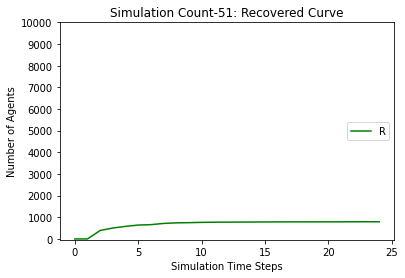

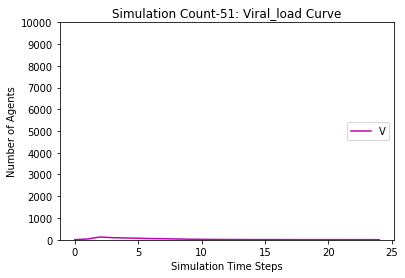

[9806, 9570, 9443, 9373, 9338, 9295, 9262, 9231, 9209, 9193, 9184, 9177, 9170, 9163, 9159, 9157, 9156, 9155, 9154, 9153, 9153, 9153]
[194, 430, 140, 91, 61, 65, 72, 42, 31, 21, 12, 10, 8, 10, 4, 2, 2, 2, 2, 1, 0, 0]
[0, 0, 417, 536, 601, 640, 666, 727, 760, 786, 804, 813, 822, 827, 837, 841, 842, 843, 844, 846, 847, 847]
[0.0, 29.0, 120.5, 103.25, 76.625, 58.3125, 44.15625, 45.078125, 34.5390625, 26.26953125, 22.134765625, 16.0673828125, 14.03369140625, 11.016845703125, 10.5084228515625, 8.25421142578125, 5.127105712890625, 2.5635528564453125, 1.2817764282226562, 0.6408882141113281, 1.320444107055664, 0.660222053527832]
2661.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9

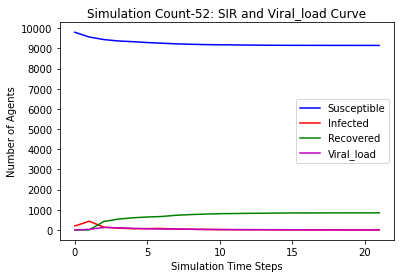

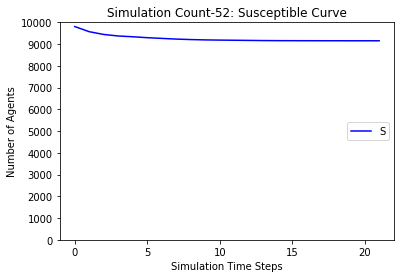

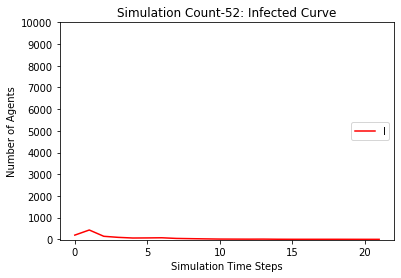

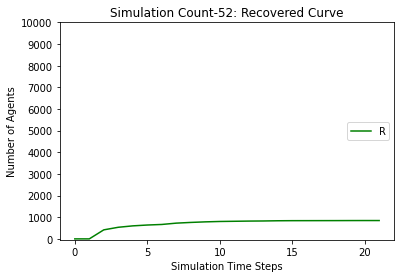

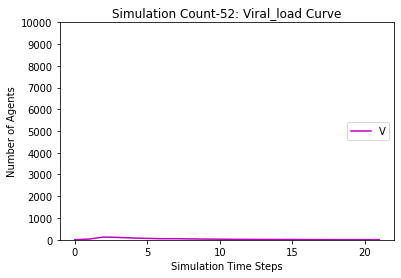

[9806, 9606, 9481, 9410, 9360, 9328, 9304, 9286, 9276, 9263, 9251, 9245, 9243, 9239, 9234, 9233, 9231, 9227, 9223, 9218, 9218, 9216, 9212, 9212, 9212, 9212]
[194, 394, 145, 87, 65, 43, 46, 25, 17, 16, 18, 9, 3, 4, 5, 1, 2, 5, 5, 6, 0, 2, 4, 0, 0, 0]
[0, 0, 374, 503, 575, 629, 650, 689, 707, 721, 731, 746, 754, 757, 761, 766, 767, 768, 772, 776, 782, 782, 784, 788, 788, 788]
[0.0, 29.0, 127.5, 96.75, 72.375, 61.1875, 45.59375, 36.796875, 26.3984375, 22.19921875, 16.099609375, 18.0498046875, 13.02490234375, 9.512451171875, 8.7562255859375, 5.37811279296875, 3.689056396484375, 2.8445281982421875, 5.422264099121094, 3.711132049560547, 3.8555660247802734, 1.9277830123901367, 2.9638915061950684, 2.481945753097534, 1.240972876548767, 0.6204864382743835]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 

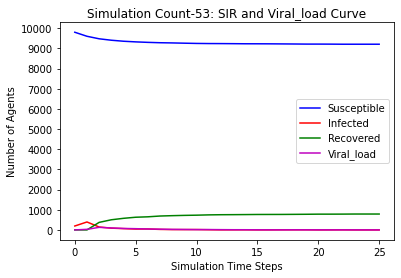

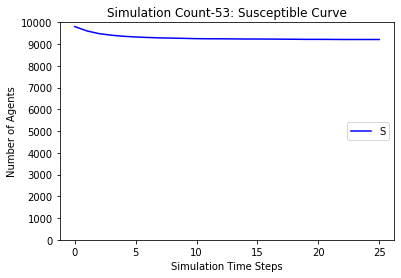

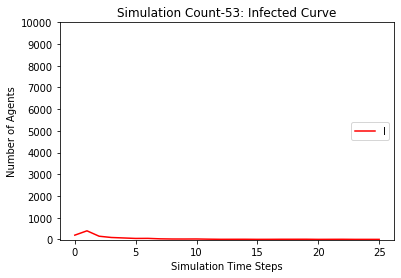

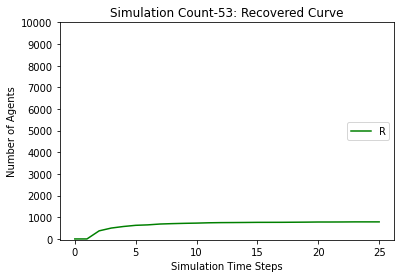

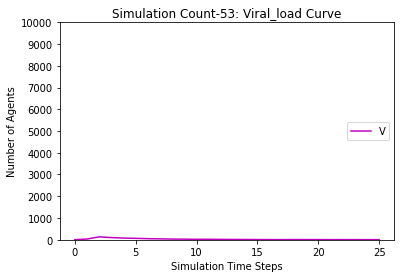

[9806, 9612, 9484, 9426, 9384, 9356, 9331, 9301, 9280, 9267, 9258, 9250, 9245, 9239, 9236, 9232, 9231, 9227, 9225, 9225, 9223, 9220, 9219, 9217, 9217, 9217, 9217]
[194, 388, 148, 77, 49, 42, 42, 42, 26, 20, 15, 12, 7, 7, 4, 5, 3, 5, 4, 1, 3, 4, 2, 2, 0, 0, 0]
[0, 0, 368, 497, 567, 602, 627, 657, 694, 713, 727, 738, 748, 754, 760, 763, 766, 768, 771, 774, 774, 776, 779, 781, 783, 783, 783]
[0.0, 26.0, 123.0, 94.5, 66.25, 48.125, 41.0625, 34.53125, 37.265625, 28.6328125, 20.31640625, 15.158203125, 10.5791015625, 8.28955078125, 9.144775390625, 4.5723876953125, 3.28619384765625, 3.643096923828125, 3.8215484619140625, 2.9107742309570312, 1.4553871154785156, 1.7276935577392578, 0.8638467788696289, 0.43192338943481445, 2.2159616947174072, 1.1079808473587036, 0.5539904236793518]
2706.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9

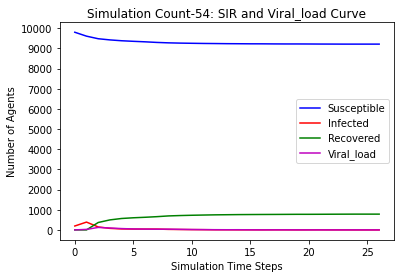

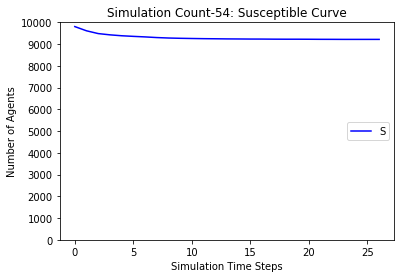

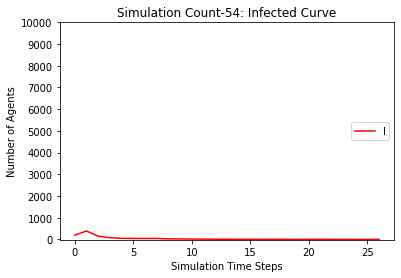

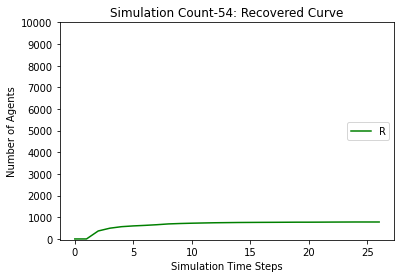

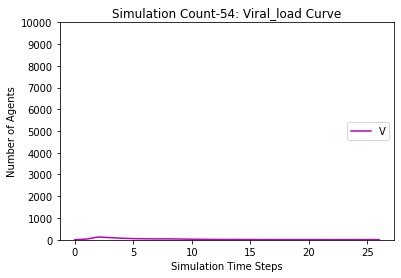

[9806, 9594, 9470, 9402, 9355, 9329, 9307, 9284, 9266, 9252, 9237, 9224, 9218, 9214, 9212, 9208, 9206, 9205, 9205, 9204, 9203, 9203]
[194, 406, 143, 90, 58, 30, 37, 28, 26, 23, 22, 16, 9, 5, 3, 4, 4, 2, 2, 2, 2, 0]
[0, 0, 387, 508, 587, 641, 656, 688, 708, 725, 741, 760, 773, 781, 785, 788, 790, 793, 793, 794, 795, 797]
[0.0, 28.0, 128.0, 102.0, 79.0, 61.5, 41.75, 31.875, 27.9375, 22.96875, 20.484375, 19.2421875, 15.62109375, 9.810546875, 7.9052734375, 4.95263671875, 6.476318359375, 4.2381591796875, 2.11907958984375, 1.059539794921875, 0.5297698974609375, 0.26488494873046875]
2694.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354

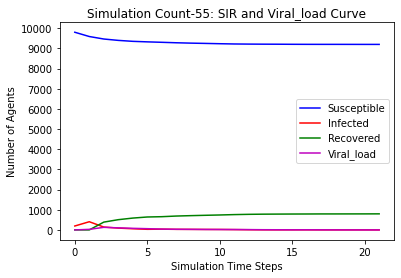

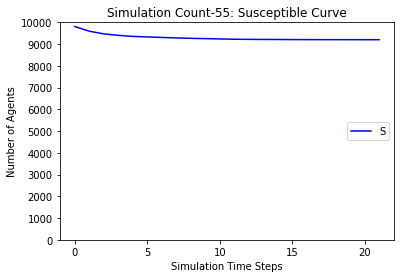

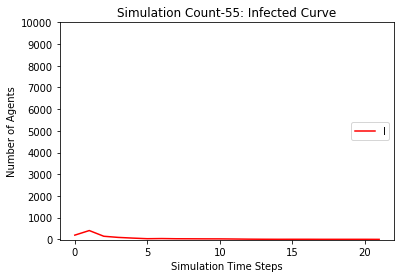

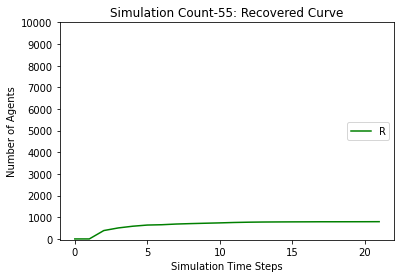

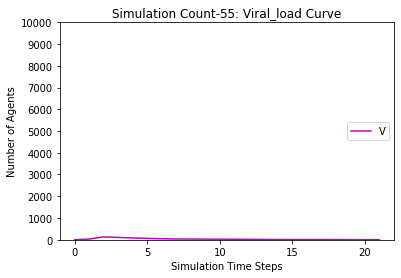

[9806, 9606, 9479, 9406, 9359, 9321, 9270, 9240, 9219, 9205, 9194, 9179, 9174, 9168, 9168, 9168, 9168, 9167, 9166, 9163, 9161, 9160, 9159, 9159, 9157, 9156, 9154, 9154, 9153, 9152, 9152, 9152]
[194, 394, 152, 93, 59, 53, 90, 40, 29, 24, 17, 21, 6, 7, 0, 0, 0, 1, 2, 5, 2, 1, 1, 1, 3, 1, 3, 0, 1, 1, 0, 0]
[0, 0, 369, 501, 582, 626, 640, 720, 752, 771, 789, 800, 820, 825, 832, 832, 832, 832, 832, 832, 837, 839, 840, 840, 840, 843, 843, 846, 846, 847, 848, 848]
[0.0, 32.0, 131.0, 110.5, 82.25, 66.125, 53.0625, 56.53125, 45.265625, 31.6328125, 25.81640625, 19.908203125, 17.9541015625, 10.97705078125, 8.488525390625, 4.2442626953125, 2.12213134765625, 1.061065673828125, 1.5305328369140625, 0.7652664184570312, 2.3826332092285156, 3.191316604614258, 2.595658302307129, 2.2978291511535645, 1.1489145755767822, 1.5744572877883911, 1.7872286438941956, 1.8936143219470978, 0.9468071609735489, 1.4734035804867744, 1.7367017902433872, 0.8683508951216936]
2646.3333333333335
[[], [9806, 9602, 9483, 9427, 

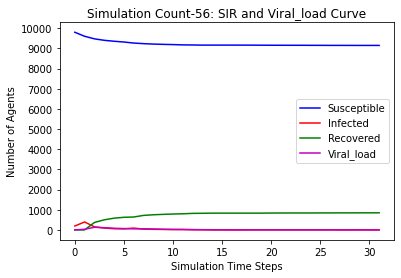

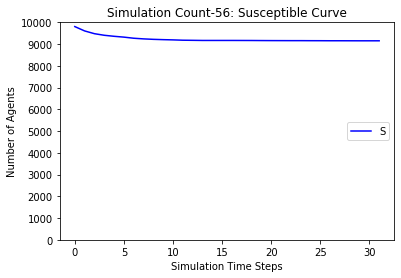

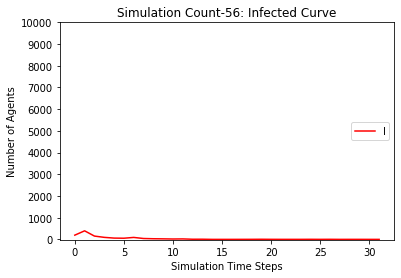

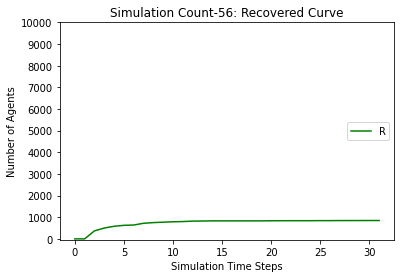

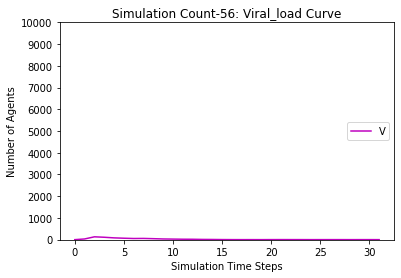

[9806, 9584, 9469, 9398, 9343, 9308, 9279, 9257, 9244, 9233, 9222, 9213, 9202, 9193, 9187, 9184, 9180, 9172, 9166, 9159, 9156, 9155, 9151, 9150, 9149, 9148, 9146, 9144, 9142, 9142, 9142, 9142]
[194, 416, 136, 89, 72, 49, 53, 32, 18, 15, 20, 17, 16, 11, 9, 7, 6, 11, 10, 8, 4, 3, 7, 2, 1, 1, 2, 2, 2, 0, 0, 0]
[0, 0, 395, 513, 585, 643, 668, 711, 738, 752, 758, 770, 782, 796, 804, 809, 814, 817, 824, 833, 840, 842, 842, 848, 850, 851, 852, 854, 856, 858, 858, 858]
[0.0, 24.0, 119.0, 95.5, 77.75, 60.875, 44.4375, 37.21875, 27.609375, 18.8046875, 12.40234375, 12.201171875, 13.1005859375, 10.55029296875, 10.275146484375, 10.1375732421875, 10.06878662109375, 5.034393310546875, 6.5171966552734375, 4.258598327636719, 5.129299163818359, 3.5646495819091797, 1.7823247909545898, 3.891162395477295, 1.9455811977386475, 1.9727905988693237, 0.9863952994346619, 2.493197649717331, 3.2465988248586655, 2.6232994124293327, 1.3116497062146664, 0.6558248531073332]
2661.3333333333335
[[], [9806, 9602, 9483, 94

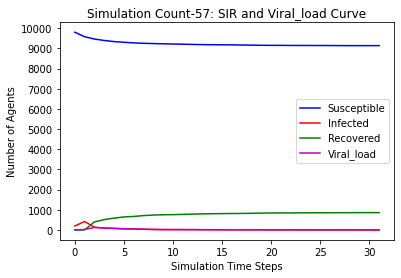

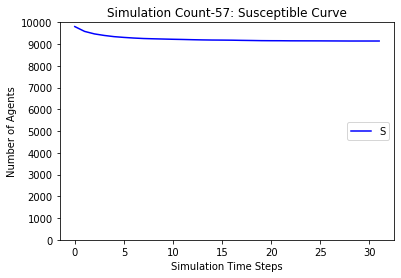

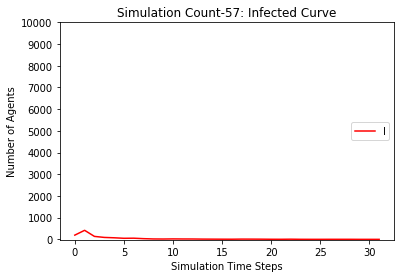

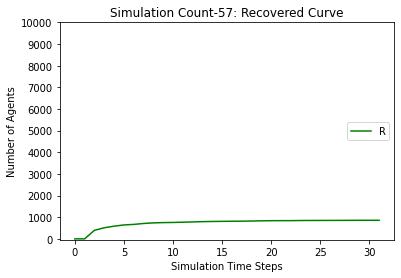

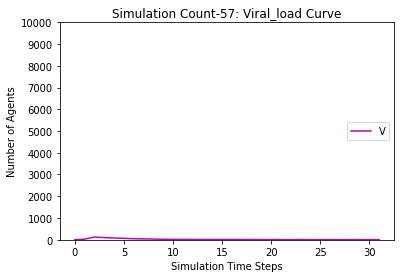

[9806, 9597, 9476, 9408, 9360, 9320, 9286, 9260, 9246, 9235, 9223, 9215, 9213, 9203, 9201, 9197, 9195, 9195, 9193, 9193, 9192, 9191, 9190, 9189, 9189]
[194, 403, 134, 79, 65, 56, 69, 32, 20, 17, 17, 8, 3, 13, 5, 5, 3, 1, 3, 0, 1, 1, 1, 1, 0]
[0, 0, 390, 513, 575, 624, 645, 708, 734, 748, 760, 777, 784, 784, 794, 798, 802, 804, 804, 807, 807, 808, 809, 810, 811]
[0.0, 24.0, 122.0, 101.0, 75.5, 60.75, 48.375, 46.1875, 35.09375, 25.546875, 18.7734375, 13.38671875, 9.693359375, 7.8466796875, 7.92333984375, 5.961669921875, 4.9808349609375, 2.49041748046875, 1.245208740234375, 1.6226043701171875, 0.8113021850585938, 1.4056510925292969, 1.7028255462646484, 1.8514127731323242, 0.9257063865661621]
780.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 

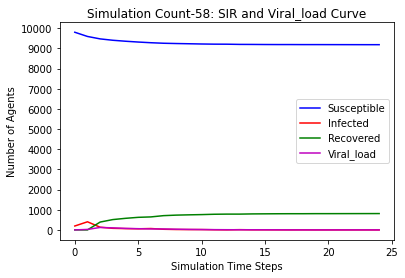

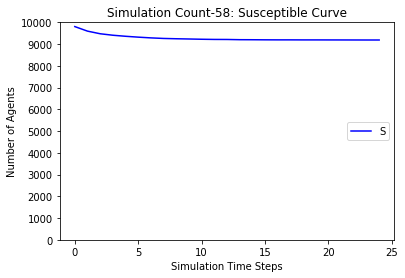

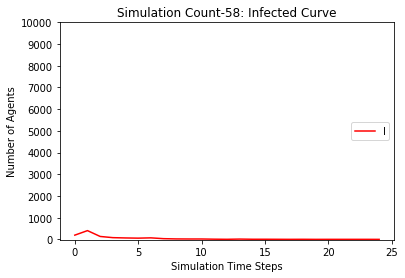

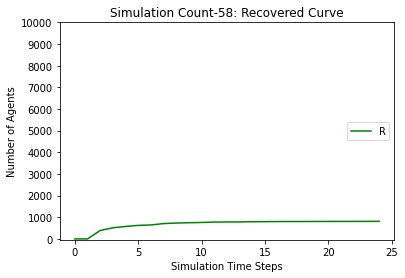

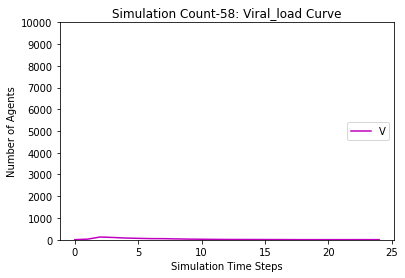

[9806, 9589, 9471, 9403, 9352, 9322, 9289, 9251, 9235, 9227, 9226, 9226, 9223, 9222, 9220, 9218, 9216, 9214, 9214]
[194, 411, 142, 84, 68, 44, 64, 45, 19, 10, 1, 0, 3, 2, 2, 3, 3, 3, 0]
[0, 0, 387, 513, 580, 634, 647, 704, 746, 763, 773, 774, 774, 776, 778, 779, 781, 783, 786]
[0.0, 26.0, 122.0, 108.0, 90.0, 62.0, 44.0, 36.0, 29.0, 22.5, 16.25, 8.125, 4.0625, 3.03125, 2.515625, 3.2578125, 2.62890625, 1.314453125, 0.6572265625]
1432.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 9373, 9337, 9300, 9276, 9263, 9254, 9245, 9240, 9237, 9233

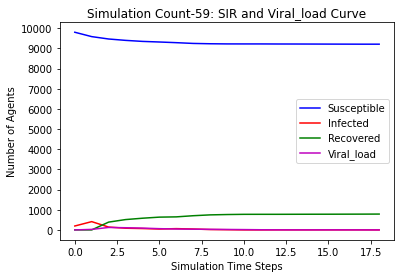

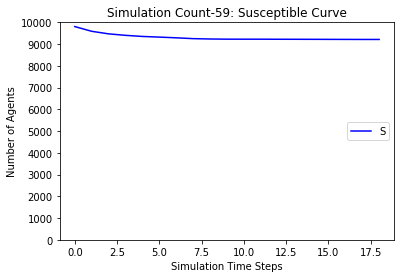

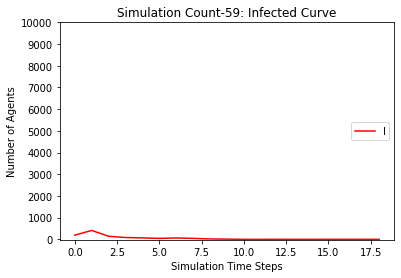

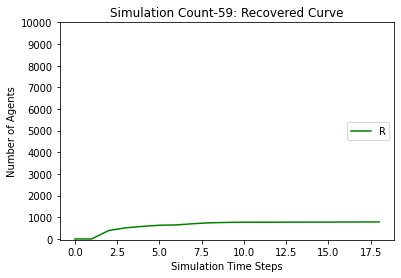

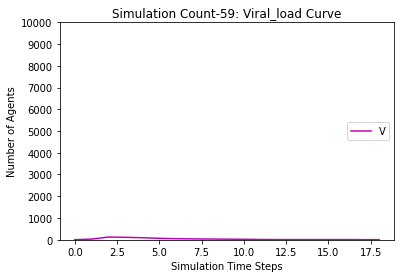

[9806, 9599, 9464, 9400, 9368, 9339, 9316, 9293, 9284, 9279, 9269, 9264, 9260, 9257, 9251, 9249, 9247, 9245, 9243, 9241, 9239, 9238, 9237, 9236, 9235, 9234, 9232, 9232]
[194, 401, 157, 75, 41, 37, 39, 31, 13, 8, 15, 6, 6, 6, 10, 3, 3, 3, 4, 2, 2, 1, 1, 1, 1, 2, 2, 0]
[0, 0, 379, 525, 591, 624, 645, 676, 703, 713, 716, 730, 734, 737, 739, 748, 750, 752, 753, 757, 759, 761, 762, 763, 764, 764, 766, 768]
[0.0, 21.0, 121.5, 99.75, 78.875, 53.4375, 42.71875, 32.359375, 29.1796875, 19.58984375, 13.794921875, 14.8974609375, 8.44873046875, 8.224365234375, 5.1121826171875, 5.55609130859375, 3.778045654296875, 4.8890228271484375, 4.444511413574219, 3.2222557067871094, 3.6111278533935547, 2.8055639266967773, 1.4027819633483887, 1.7013909816741943, 0.8506954908370972, 1.4253477454185486, 1.7126738727092743, 0.8563369363546371]
2099.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138

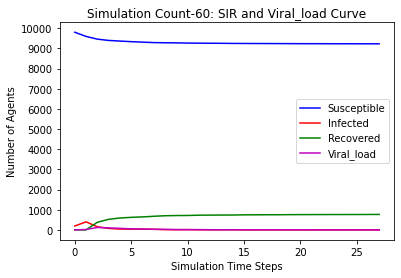

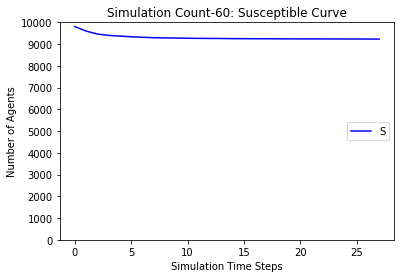

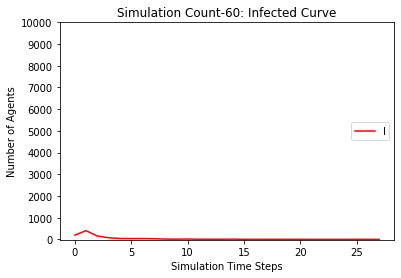

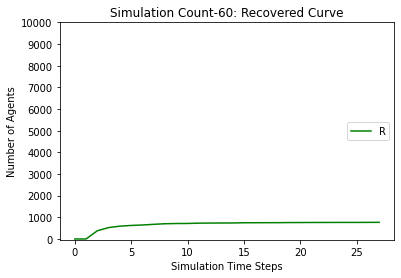

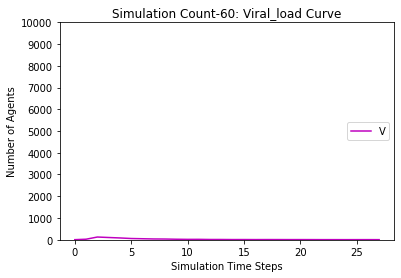

[9806, 9612, 9477, 9390, 9346, 9309, 9279, 9265, 9250, 9234, 9219, 9214, 9211, 9209, 9208, 9207, 9207, 9206, 9205, 9205, 9203, 9202, 9202, 9201, 9201]
[194, 388, 157, 103, 61, 46, 54, 18, 22, 23, 20, 6, 5, 2, 1, 2, 1, 2, 2, 1, 3, 1, 0, 1, 0]
[0, 0, 366, 507, 593, 645, 667, 717, 728, 743, 761, 780, 784, 789, 791, 791, 792, 792, 793, 794, 794, 797, 798, 798, 799]
[0.0, 26.0, 130.0, 116.0, 92.0, 68.0, 50.0, 43.0, 30.5, 20.25, 18.125, 16.0625, 9.03125, 6.515625, 5.2578125, 2.62890625, 2.314453125, 1.1572265625, 0.57861328125, 1.289306640625, 0.6446533203125, 3.32232666015625, 2.661163330078125, 1.3305816650390625, 0.6652908325195312]
791.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 

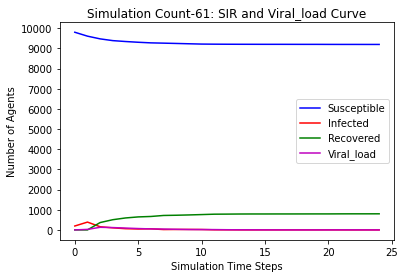

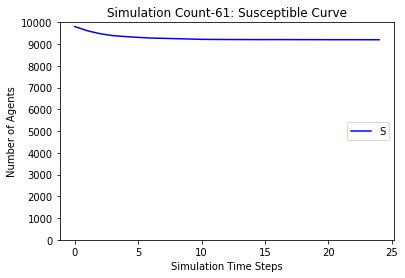

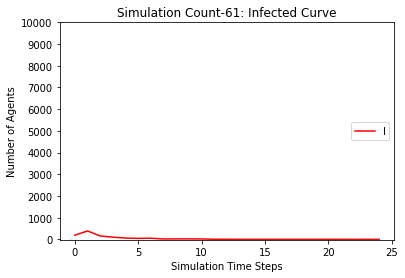

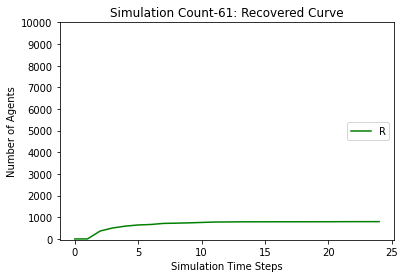

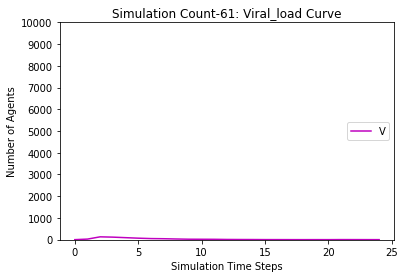

[9806, 9584, 9483, 9420, 9369, 9335, 9297, 9276, 9260, 9243, 9240, 9229, 9218, 9209, 9202, 9199, 9195, 9193, 9193, 9193]
[194, 416, 120, 82, 62, 47, 54, 27, 22, 21, 7, 17, 16, 14, 10, 5, 6, 2, 0, 0]
[0, 0, 397, 498, 569, 618, 649, 697, 718, 736, 753, 754, 766, 777, 788, 796, 799, 805, 807, 807]
[0.0, 24.0, 108.0, 95.0, 78.5, 62.25, 45.125, 37.5625, 29.78125, 24.890625, 18.4453125, 13.22265625, 13.611328125, 10.8056640625, 8.40283203125, 7.201416015625, 4.6007080078125, 3.30035400390625, 1.650177001953125, 0.8250885009765625]
810.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 930

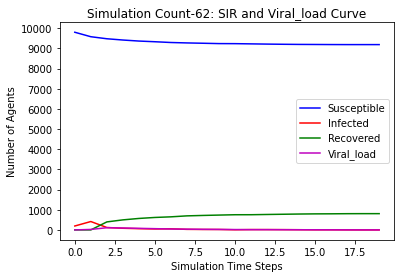

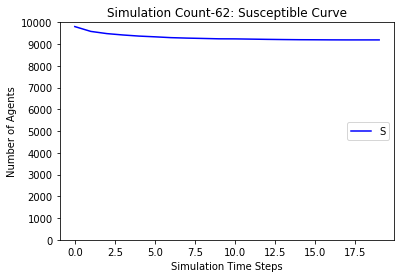

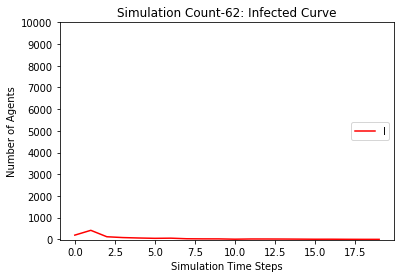

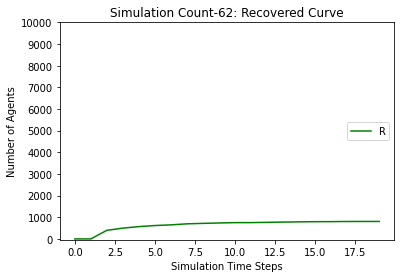

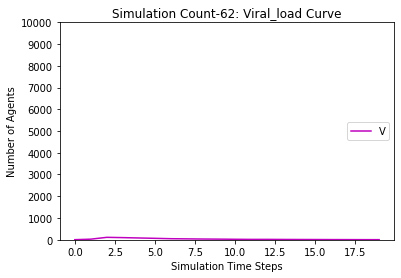

[9806, 9568, 9426, 9353, 9312, 9273, 9232, 9209, 9183, 9162, 9149, 9133, 9120, 9108, 9100, 9092, 9089, 9088, 9085, 9081, 9079, 9078, 9075, 9073, 9073, 9073, 9072, 9070, 9070, 9070]
[194, 432, 157, 94, 54, 56, 80, 33, 33, 24, 15, 28, 20, 18, 10, 11, 4, 1, 4, 5, 3, 4, 4, 2, 1, 1, 2, 2, 0, 0]
[0, 0, 417, 553, 634, 671, 688, 758, 784, 814, 836, 839, 860, 874, 890, 897, 907, 911, 911, 914, 918, 918, 921, 925, 926, 926, 926, 928, 930, 930]
[0.0, 29.0, 142.5, 109.25, 79.625, 56.8125, 51.40625, 48.703125, 35.3515625, 28.67578125, 25.337890625, 17.6689453125, 17.83447265625, 19.917236328125, 16.9586181640625, 15.47930908203125, 10.739654541015625, 6.3698272705078125, 4.184913635253906, 5.092456817626953, 5.546228408813477, 2.7731142044067383, 5.386557102203369, 3.6932785511016846, 1.8466392755508423, 0.9233196377754211, 0.46165981888771057, 0.23082990944385529, 1.1154149547219276, 0.5577074773609638]
362.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201,

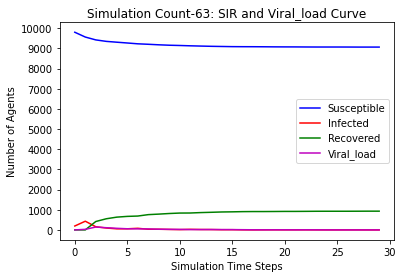

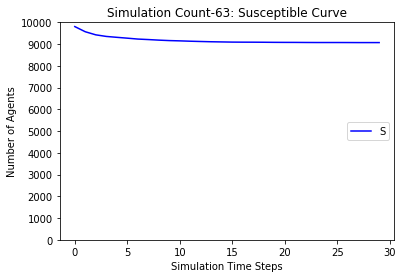

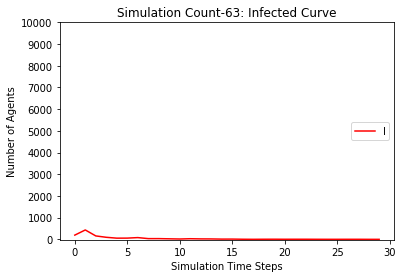

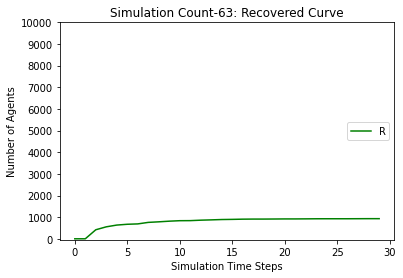

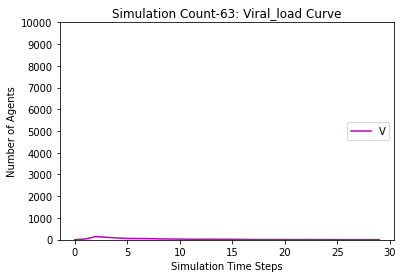

[9806, 9576, 9467, 9412, 9386, 9352, 9327, 9311, 9297, 9289, 9279, 9270, 9263, 9262, 9259, 9259, 9259]
[194, 424, 118, 68, 35, 48, 50, 23, 21, 10, 13, 13, 8, 3, 3, 0, 0]
[0, 0, 415, 520, 579, 600, 623, 666, 682, 701, 708, 717, 729, 735, 738, 741, 741]
[0.0, 25.0, 120.5, 93.25, 63.625, 44.8125, 35.40625, 33.703125, 24.8515625, 17.42578125, 11.712890625, 10.8564453125, 11.42822265625, 6.714111328125, 3.3570556640625, 1.67852783203125, 0.839263916015625]
2734.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 9373, 9337, 9300, 9276, 9263, 925

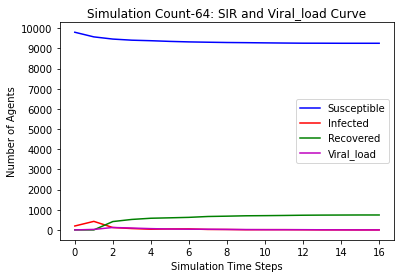

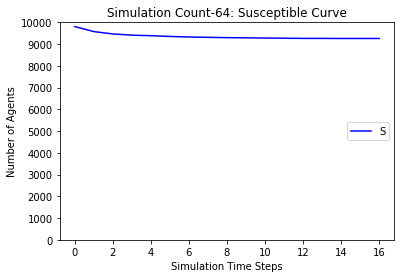

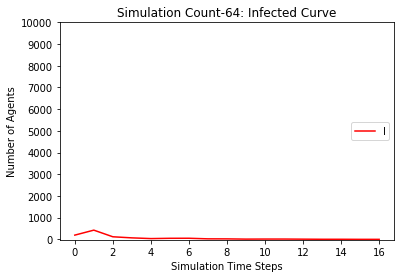

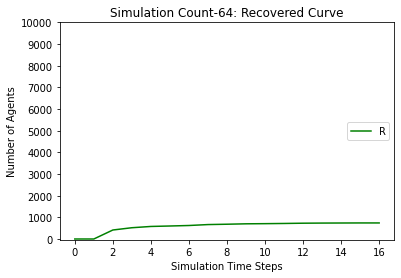

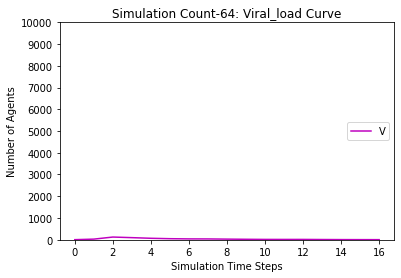

[9806, 9607, 9486, 9415, 9376, 9356, 9338, 9321, 9307, 9300, 9295, 9292, 9288, 9283, 9280, 9279, 9277, 9276, 9276, 9275, 9275, 9273, 9273, 9273, 9272, 9272]
[194, 393, 149, 85, 51, 28, 27, 19, 16, 9, 8, 5, 6, 8, 3, 1, 2, 1, 0, 1, 0, 2, 1, 1, 2, 0]
[0, 0, 365, 500, 573, 616, 635, 660, 677, 691, 697, 703, 706, 709, 717, 720, 721, 723, 724, 724, 725, 725, 726, 726, 726, 728]
[0.0, 27.0, 119.5, 98.75, 76.375, 59.1875, 39.59375, 31.796875, 22.8984375, 18.44921875, 12.224609375, 7.1123046875, 3.55615234375, 3.778076171875, 5.8890380859375, 4.94451904296875, 2.472259521484375, 2.2361297607421875, 2.1180648803710938, 1.0590324401855469, 1.5295162200927734, 0.7647581100463867, 2.3823790550231934, 1.1911895275115967, 0.5955947637557983, 0.29779738187789917]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451,

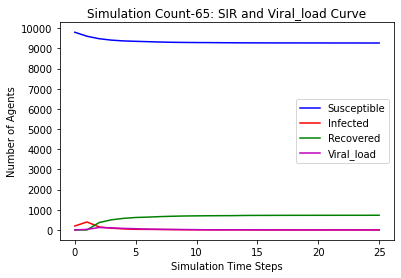

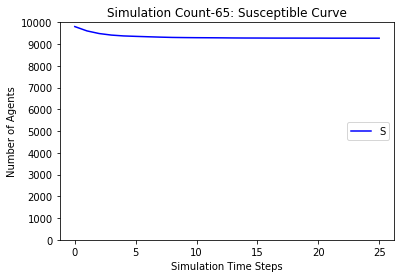

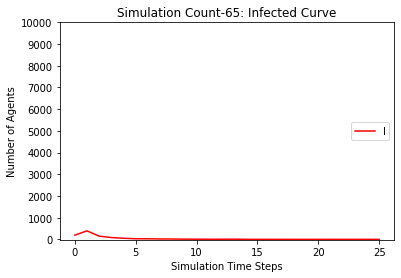

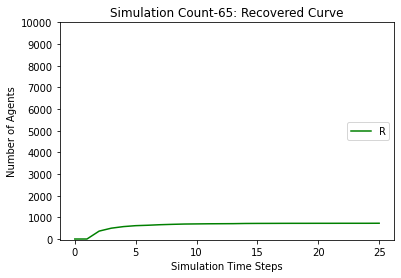

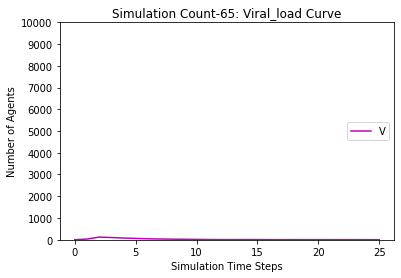

[9806, 9580, 9446, 9373, 9330, 9300, 9271, 9250, 9224, 9212, 9197, 9193, 9189, 9183, 9180, 9176, 9174, 9173, 9173, 9173, 9173]
[194, 420, 164, 91, 56, 44, 56, 28, 34, 19, 20, 9, 9, 7, 3, 4, 4, 2, 1, 0, 0]
[0, 0, 390, 536, 614, 656, 673, 722, 742, 769, 783, 798, 802, 810, 817, 820, 822, 825, 826, 827, 827]
[0.0, 33.0, 131.5, 108.75, 85.375, 59.6875, 44.84375, 41.421875, 31.7109375, 27.85546875, 19.927734375, 17.9638671875, 12.98193359375, 11.490966796875, 7.7454833984375, 5.87274169921875, 3.936370849609375, 3.9681854248046875, 2.9840927124023438, 1.4920463562011719, 0.7460231781005859]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 

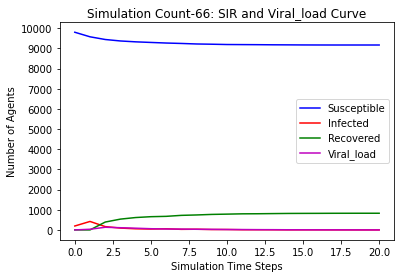

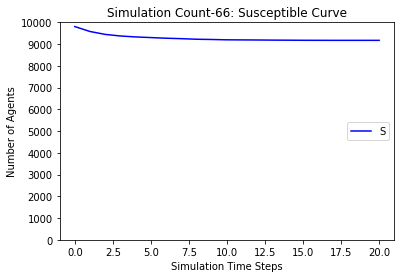

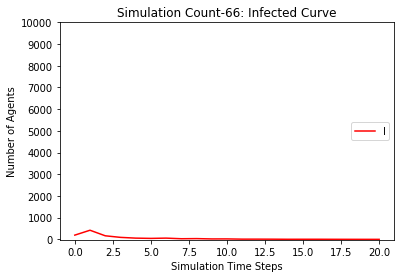

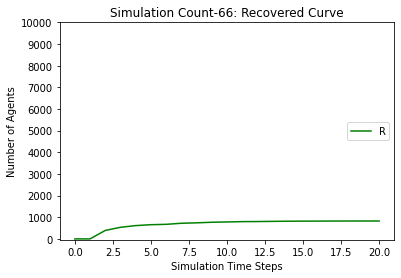

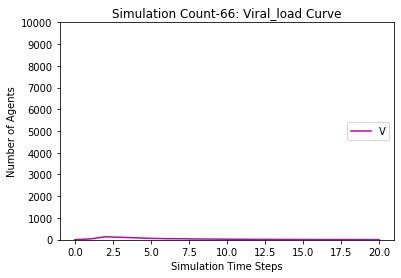

[9806, 9566, 9431, 9366, 9322, 9291, 9252, 9223, 9199, 9186, 9174, 9157, 9143, 9136, 9132, 9130, 9124, 9123, 9122, 9119, 9119, 9119]
[194, 434, 151, 83, 55, 41, 68, 35, 30, 16, 18, 27, 17, 7, 4, 2, 8, 2, 1, 4, 0, 0]
[0, 0, 418, 551, 623, 668, 680, 742, 771, 798, 808, 816, 840, 857, 864, 868, 868, 875, 877, 877, 881, 881]
[0.0, 35.0, 136.5, 115.25, 84.625, 54.3125, 45.15625, 42.578125, 34.2890625, 26.14453125, 20.072265625, 19.0361328125, 18.51806640625, 16.259033203125, 10.1295166015625, 7.06475830078125, 4.532379150390625, 3.2661895751953125, 2.6330947875976562, 2.316547393798828, 1.158273696899414, 0.579136848449707]
2623.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [98

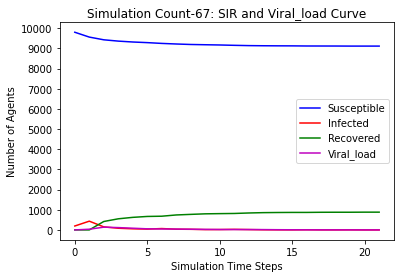

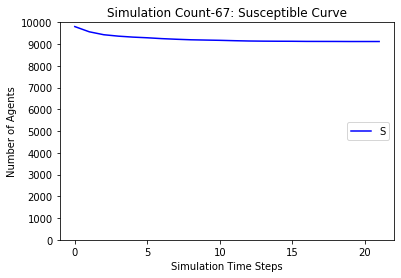

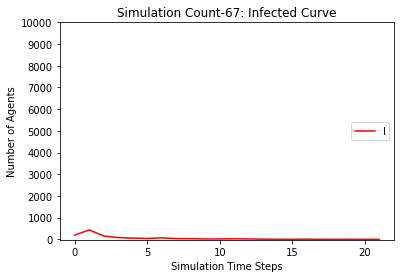

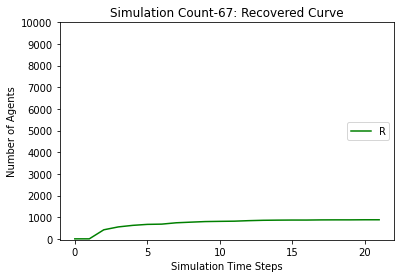

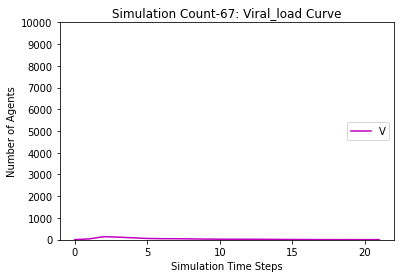

[9806, 9584, 9444, 9368, 9333, 9304, 9276, 9259, 9245, 9232, 9224, 9218, 9215, 9210, 9207, 9207, 9205, 9204, 9204]
[194, 416, 160, 94, 47, 40, 48, 25, 18, 17, 11, 9, 4, 5, 5, 1, 3, 1, 0]
[0, 0, 396, 538, 620, 656, 676, 716, 737, 751, 765, 773, 781, 785, 788, 792, 792, 795, 796]
[0.0, 29.0, 122.5, 114.25, 81.125, 59.5625, 44.78125, 39.390625, 29.6953125, 20.84765625, 16.423828125, 9.2119140625, 8.60595703125, 4.302978515625, 6.1514892578125, 4.07574462890625, 2.037872314453125, 1.0189361572265625, 0.5094680786132812]
1418.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303,

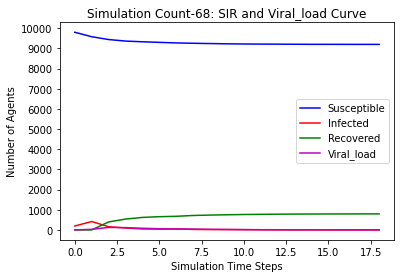

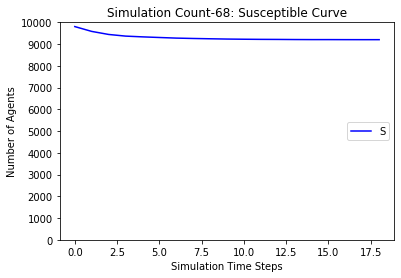

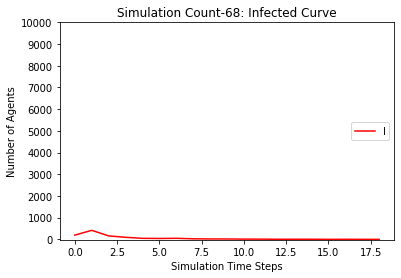

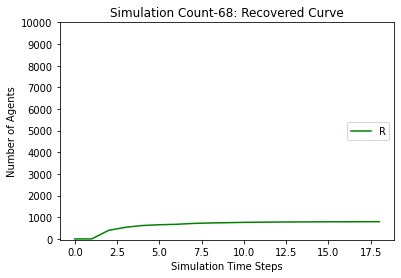

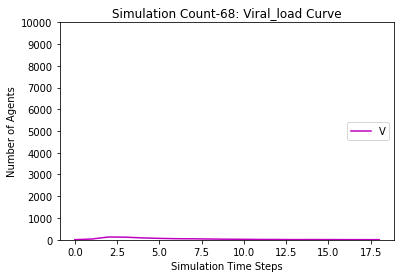

[9806, 9605, 9494, 9425, 9367, 9331, 9293, 9271, 9260, 9251, 9243, 9239, 9238, 9232, 9226, 9223, 9223, 9223, 9222, 9221, 9220, 9220]
[194, 395, 128, 87, 74, 44, 57, 28, 16, 13, 10, 8, 4, 9, 7, 3, 0, 0, 1, 1, 1, 0]
[0, 0, 378, 488, 559, 625, 650, 701, 724, 736, 747, 753, 758, 759, 767, 774, 777, 777, 777, 778, 779, 780]
[0.0, 25.0, 115.5, 108.75, 82.375, 64.1875, 46.09375, 42.046875, 32.0234375, 21.01171875, 15.505859375, 12.7529296875, 8.37646484375, 5.188232421875, 4.5941162109375, 5.29705810546875, 3.648529052734375, 1.8242645263671875, 0.9121322631835938, 1.4560661315917969, 1.7280330657958984, 0.8640165328979492]
2710.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806

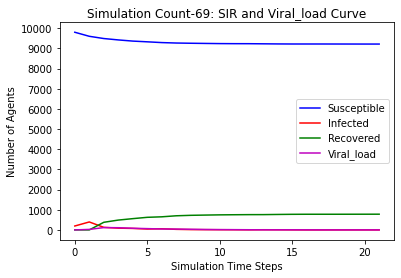

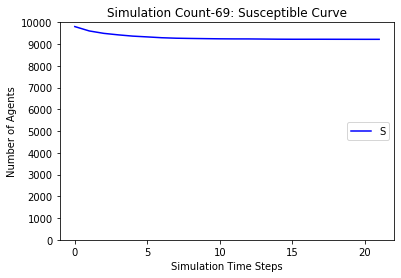

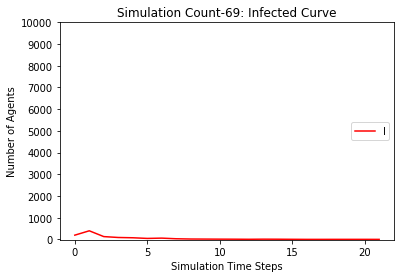

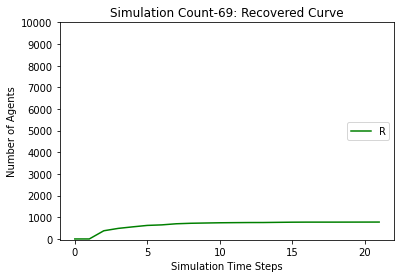

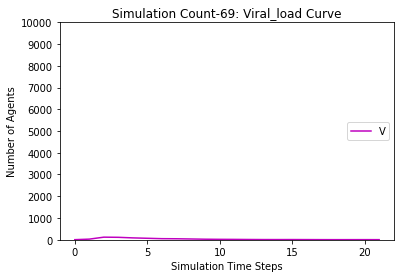

[9806, 9608, 9485, 9397, 9341, 9300, 9264, 9232, 9206, 9194, 9183, 9176, 9169, 9160, 9155, 9154, 9152, 9152, 9151, 9150, 9148, 9147, 9145, 9143, 9142, 9142]
[194, 392, 156, 119, 78, 56, 63, 42, 35, 17, 15, 11, 10, 11, 6, 1, 2, 1, 2, 3, 3, 1, 2, 3, 1, 0]
[0, 0, 359, 484, 581, 644, 673, 726, 759, 789, 802, 813, 821, 829, 839, 845, 846, 847, 847, 847, 849, 852, 853, 854, 857, 858]
[0.0, 30.0, 115.0, 103.5, 84.75, 73.375, 53.6875, 54.84375, 48.421875, 33.2109375, 22.60546875, 17.302734375, 12.6513671875, 9.32568359375, 6.662841796875, 5.3314208984375, 3.66571044921875, 2.832855224609375, 1.4164276123046875, 1.7082138061523438, 1.8541069030761719, 1.927053451538086, 1.963526725769043, 2.9817633628845215, 1.4908816814422607, 0.7454408407211304]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 93

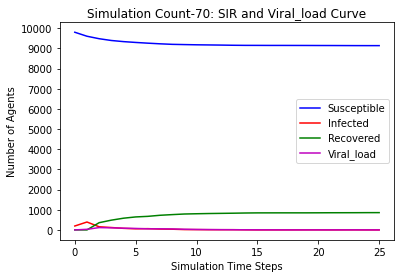

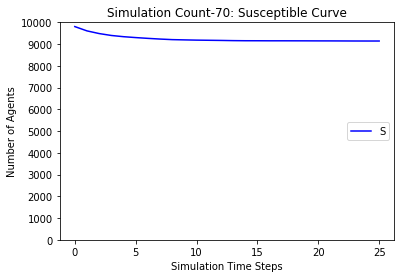

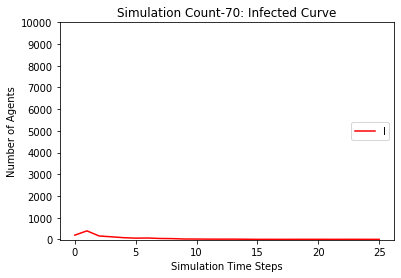

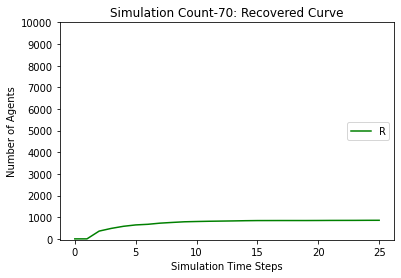

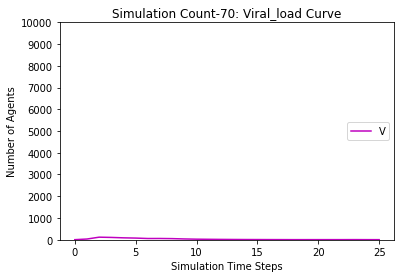

[9806, 9579, 9440, 9360, 9323, 9294, 9254, 9239, 9228, 9223, 9216, 9211, 9206, 9203, 9202, 9202, 9202, 9202]
[194, 421, 161, 100, 50, 39, 65, 19, 13, 8, 8, 7, 7, 5, 1, 0, 0, 0]
[0, 0, 399, 540, 627, 667, 681, 742, 759, 769, 776, 782, 787, 792, 797, 798, 798, 798]
[0.0, 33.0, 128.5, 118.25, 84.125, 58.0625, 44.03125, 41.015625, 23.5078125, 19.75390625, 12.876953125, 10.4384765625, 7.21923828125, 5.609619140625, 4.8048095703125, 3.40240478515625, 1.701202392578125, 0.8506011962890625]
2073.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 9

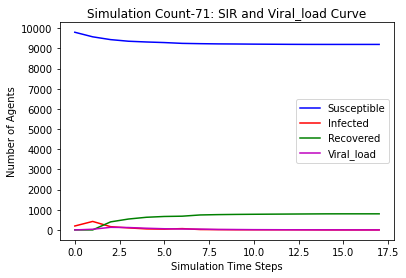

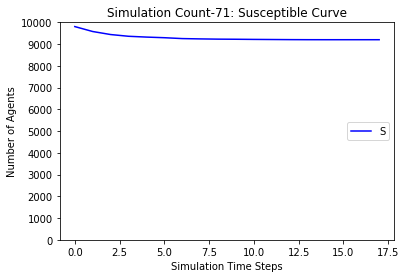

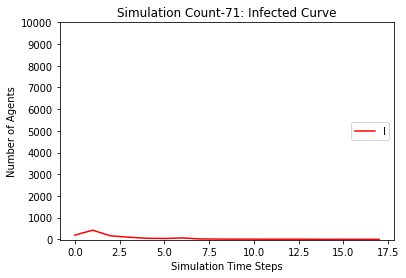

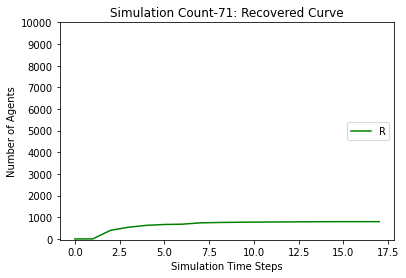

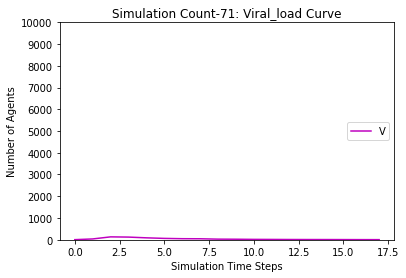

[9806, 9585, 9457, 9372, 9308, 9264, 9218, 9178, 9162, 9148, 9137, 9126, 9122, 9115, 9114, 9110, 9107, 9104, 9103, 9103, 9103, 9101, 9099, 9096, 9092, 9090, 9090, 9085, 9077, 9069, 9060, 9056, 9055, 9053, 9051, 9049, 9048, 9048, 9048, 9048, 9048]
[194, 415, 150, 104, 81, 60, 93, 51, 21, 17, 15, 21, 5, 10, 2, 5, 4, 3, 1, 0, 0, 2, 3, 4, 5, 3, 2, 7, 9, 10, 11, 8, 3, 5, 4, 3, 2, 2, 1, 1, 0]
[0, 0, 393, 524, 611, 676, 689, 771, 817, 835, 848, 853, 873, 875, 884, 885, 889, 893, 896, 897, 897, 897, 898, 900, 903, 907, 908, 908, 914, 921, 929, 936, 942, 942, 945, 948, 950, 950, 951, 951, 952]
[0.0, 30.0, 135.0, 112.5, 79.25, 71.625, 58.8125, 51.40625, 36.703125, 25.3515625, 18.67578125, 14.337890625, 14.1689453125, 10.08447265625, 11.042236328125, 5.5211181640625, 3.76055908203125, 3.880279541015625, 4.9401397705078125, 3.4700698852539062, 1.7350349426269531, 0.8675174713134766, 1.4337587356567383, 1.7168793678283691, 2.8584396839141846, 3.4292198419570923, 2.714609920978546, 1.357304960489273

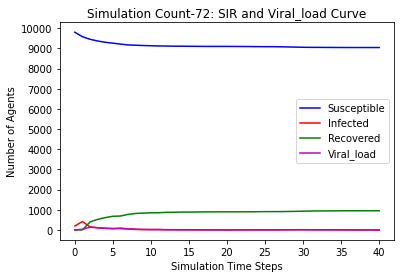

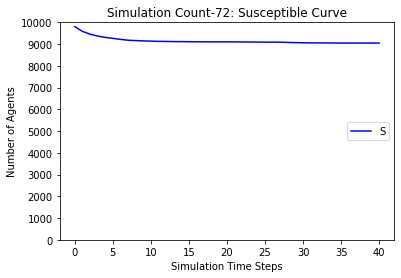

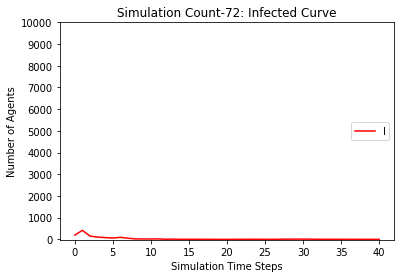

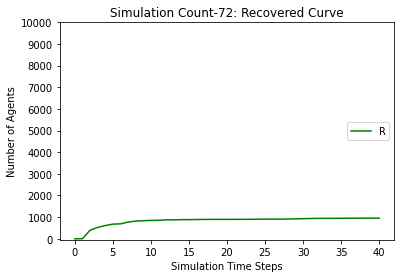

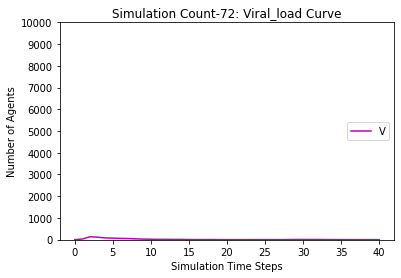

[9806, 9600, 9497, 9411, 9364, 9327, 9302, 9288, 9275, 9266, 9259, 9248, 9242, 9234, 9225, 9216, 9207, 9200, 9196, 9191, 9190, 9184, 9184, 9183, 9182, 9180, 9178, 9178, 9177, 9176, 9174, 9174, 9174, 9172, 9172, 9170, 9170, 9170]
[194, 400, 128, 115, 62, 51, 49, 18, 18, 14, 10, 14, 8, 9, 12, 9, 12, 11, 8, 8, 2, 7, 0, 1, 2, 4, 4, 0, 1, 1, 2, 0, 0, 2, 1, 3, 0, 0]
[0, 0, 375, 474, 574, 622, 649, 694, 707, 720, 731, 738, 750, 757, 763, 775, 781, 789, 796, 801, 808, 809, 816, 816, 816, 816, 818, 822, 822, 823, 824, 826, 826, 826, 827, 827, 830, 830]
[0.0, 31.0, 114.5, 89.25, 85.625, 61.8125, 56.90625, 43.453125, 24.7265625, 19.36328125, 13.681640625, 10.8408203125, 11.42041015625, 7.710205078125, 8.8551025390625, 11.42755126953125, 7.713775634765625, 6.8568878173828125, 6.428443908691406, 6.214221954345703, 3.1071109771728516, 2.553555488586426, 3.276777744293213, 1.6383888721466064, 0.8191944360733032, 0.4095972180366516, 3.204798609018326, 1.602399304509163, 0.8011996522545815, 0.400599826

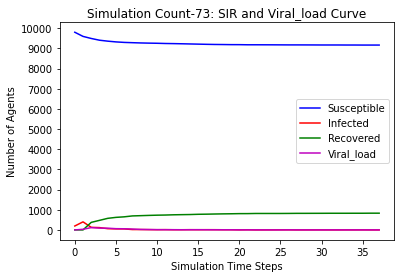

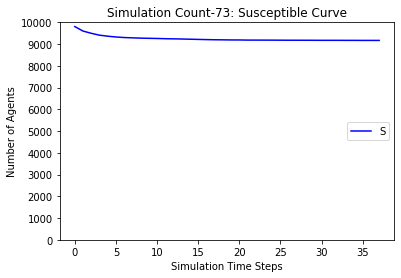

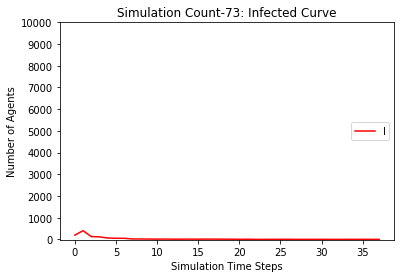

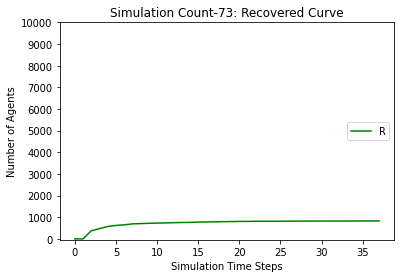

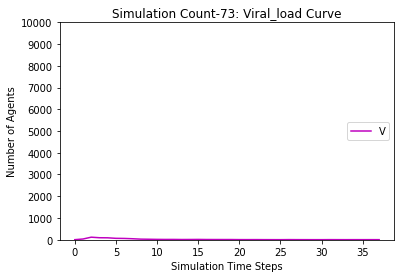

[9806, 9595, 9462, 9389, 9338, 9316, 9290, 9269, 9253, 9241, 9233, 9223, 9213, 9208, 9206, 9205, 9203, 9201, 9200, 9200, 9197, 9195, 9189, 9186, 9183, 9182, 9182, 9182, 9182]
[194, 405, 157, 101, 61, 30, 45, 26, 22, 15, 13, 16, 13, 9, 5, 3, 2, 3, 2, 1, 3, 3, 8, 4, 4, 1, 0, 0, 0]
[0, 0, 381, 510, 601, 654, 665, 705, 725, 744, 754, 761, 774, 783, 789, 792, 795, 796, 798, 799, 800, 802, 803, 810, 813, 817, 818, 818, 818]
[0.0, 26.0, 128.0, 102.0, 84.0, 61.0, 37.5, 31.75, 25.875, 21.9375, 18.96875, 15.484375, 13.7421875, 9.87109375, 6.935546875, 3.4677734375, 2.73388671875, 3.366943359375, 2.6834716796875, 2.34173583984375, 1.170867919921875, 2.5854339599609375, 3.2927169799804688, 3.6463584899902344, 4.823179244995117, 2.4115896224975586, 2.2057948112487793, 1.1028974056243896, 0.5514487028121948]
1383.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9

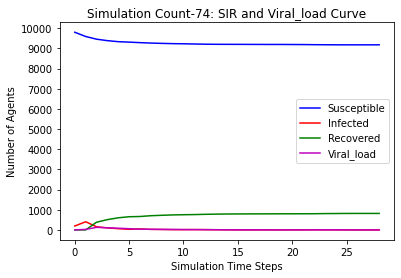

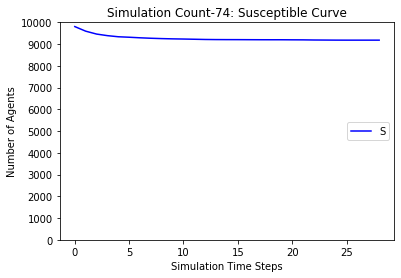

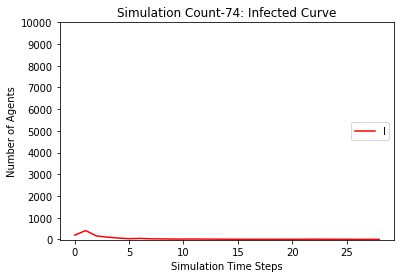

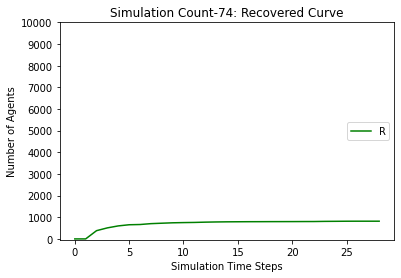

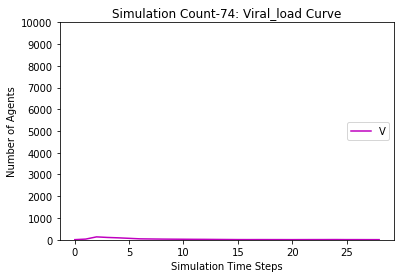

[9806, 9574, 9468, 9410, 9373, 9347, 9314, 9297, 9287, 9278, 9268, 9255, 9250, 9249, 9245, 9244, 9243, 9241, 9239, 9239, 9235, 9235]
[194, 426, 126, 67, 46, 31, 50, 24, 17, 14, 16, 15, 5, 1, 5, 1, 1, 3, 4, 2, 5, 0]
[0, 0, 406, 523, 581, 622, 636, 679, 696, 708, 716, 730, 745, 750, 750, 755, 756, 756, 757, 759, 760, 765]
[0.0, 26.0, 115.0, 97.5, 70.75, 52.375, 36.1875, 32.09375, 26.046875, 19.0234375, 18.51171875, 15.255859375, 11.6279296875, 7.81396484375, 4.906982421875, 4.4534912109375, 3.22674560546875, 1.613372802734375, 2.8066864013671875, 2.4033432006835938, 1.2016716003417969, 0.6008358001708984]
2715.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 

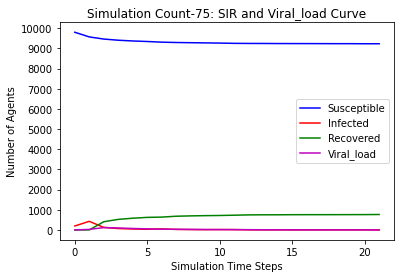

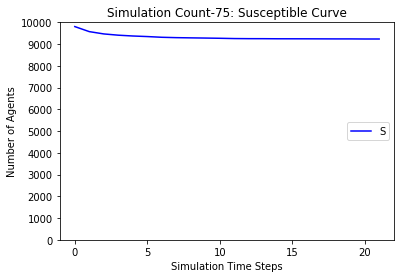

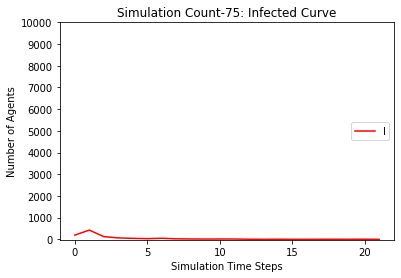

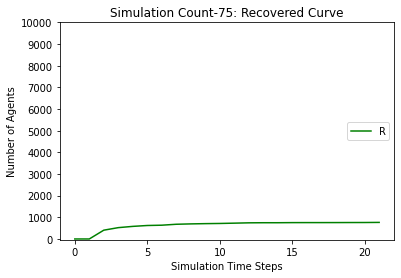

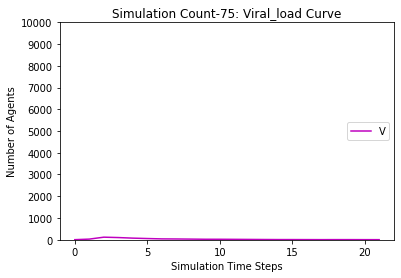

[9806, 9589, 9465, 9407, 9356, 9315, 9279, 9251, 9239, 9224, 9216, 9201, 9196, 9194, 9192, 9187, 9184, 9180, 9178, 9177, 9176, 9175, 9175, 9175]
[194, 411, 140, 81, 70, 54, 67, 34, 21, 23, 15, 23, 7, 4, 3, 5, 3, 4, 2, 2, 2, 3, 0, 0]
[0, 0, 395, 512, 574, 631, 654, 715, 740, 753, 769, 776, 797, 802, 805, 808, 813, 816, 820, 821, 822, 822, 825, 825]
[0.0, 24.0, 122.0, 97.0, 73.5, 61.75, 49.875, 45.9375, 35.96875, 25.984375, 23.9921875, 16.99609375, 17.498046875, 10.7490234375, 7.37451171875, 6.687255859375, 7.3436279296875, 4.67181396484375, 3.335906982421875, 2.6679534912109375, 2.3339767456054688, 1.1669883728027344, 1.5834941864013672, 0.7917470932006836]
1374.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 91

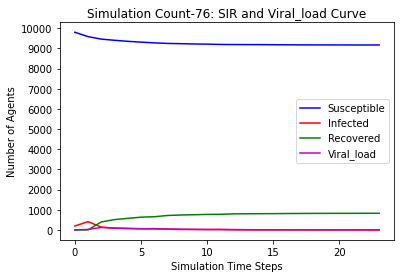

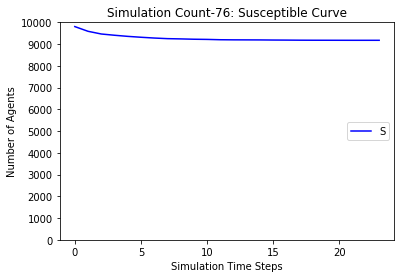

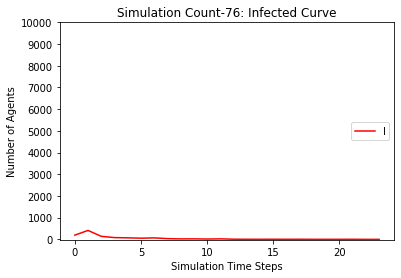

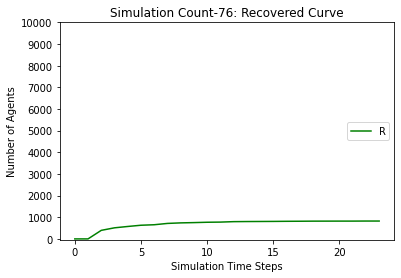

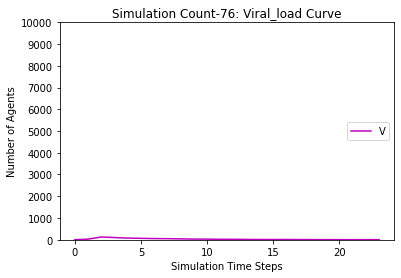

[9806, 9603, 9470, 9392, 9347, 9310, 9277, 9253, 9236, 9222, 9218, 9212, 9210, 9208, 9207, 9204, 9204, 9204]
[194, 397, 154, 102, 65, 53, 67, 33, 20, 20, 7, 10, 2, 3, 3, 5, 0, 0]
[0, 0, 376, 506, 588, 637, 656, 714, 744, 758, 775, 778, 788, 789, 790, 791, 796, 796]
[0.0, 25.0, 111.5, 101.75, 81.875, 57.9375, 45.96875, 43.984375, 33.9921875, 22.99609375, 15.498046875, 10.7490234375, 10.37451171875, 7.187255859375, 4.5936279296875, 2.29681396484375, 1.148406982421875, 0.5742034912109375]
2061.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415

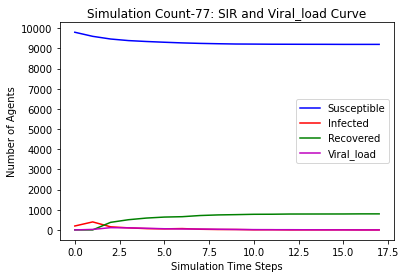

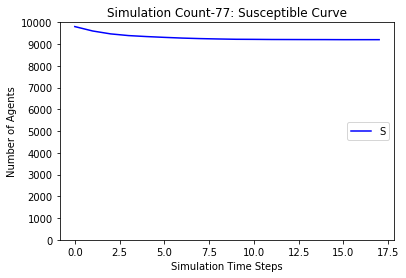

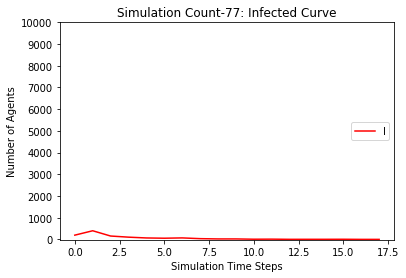

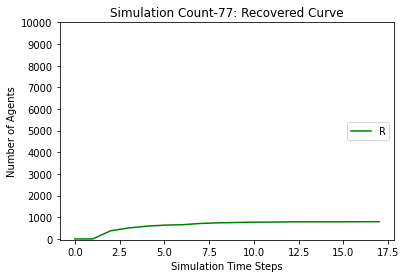

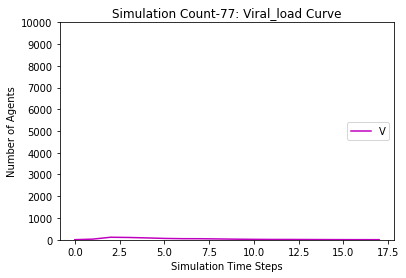

[9806, 9558, 9414, 9327, 9263, 9224, 9170, 9142, 9121, 9110, 9100, 9085, 9073, 9068, 9066, 9057, 9048, 9041, 9034, 9033, 9033, 9032, 9032, 9031, 9031]
[194, 442, 160, 109, 88, 51, 98, 34, 29, 18, 17, 29, 14, 7, 5, 11, 18, 8, 10, 1, 0, 1, 0, 1, 0]
[0, 0, 426, 564, 649, 725, 732, 824, 850, 872, 883, 886, 913, 925, 929, 932, 934, 951, 956, 966, 967, 967, 968, 968, 969]
[0.0, 35.0, 140.5, 127.25, 105.625, 74.8125, 53.40625, 58.703125, 41.3515625, 32.67578125, 25.337890625, 15.6689453125, 17.83447265625, 10.917236328125, 8.4586181640625, 9.22930908203125, 10.614654541015625, 9.307327270507812, 7.653663635253906, 6.826831817626953, 4.413415908813477, 2.2067079544067383, 2.103353977203369, 1.0516769886016846, 0.5258384943008423]
231.33333333333348
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9

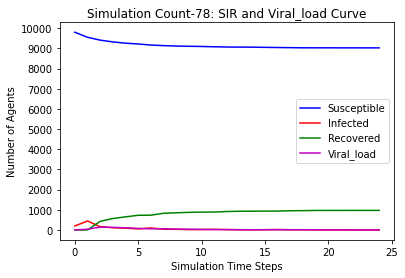

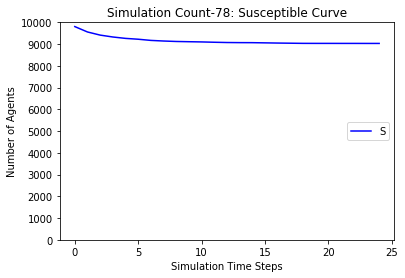

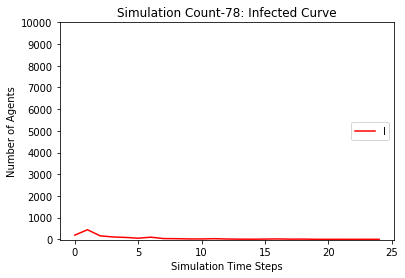

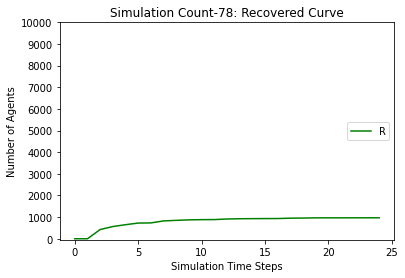

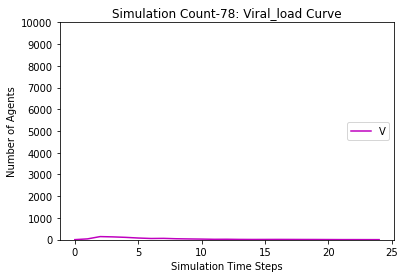

[9806, 9587, 9455, 9381, 9332, 9288, 9243, 9208, 9194, 9183, 9173, 9159, 9150, 9144, 9140, 9136, 9133, 9131, 9131, 9130, 9130, 9130]
[194, 413, 151, 97, 68, 60, 82, 44, 17, 15, 14, 20, 13, 7, 5, 5, 3, 2, 0, 1, 0, 0]
[0, 0, 394, 522, 600, 652, 675, 748, 789, 802, 813, 821, 837, 849, 855, 859, 864, 867, 869, 869, 870, 870]
[0.0, 23.0, 121.5, 103.75, 76.875, 62.4375, 53.21875, 58.609375, 42.3046875, 24.15234375, 19.076171875, 17.5380859375, 17.76904296875, 12.884521484375, 9.4422607421875, 6.72113037109375, 4.360565185546875, 2.1802825927734375, 2.0901412963867188, 1.0450706481933594, 1.5225353240966797, 0.7612676620483398]
2639.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [

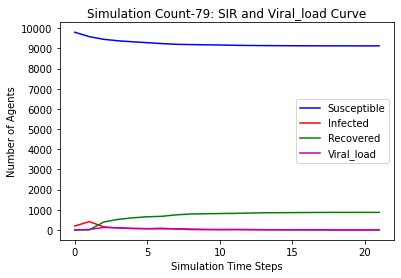

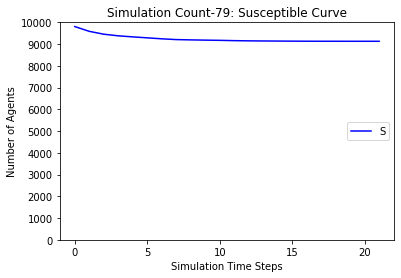

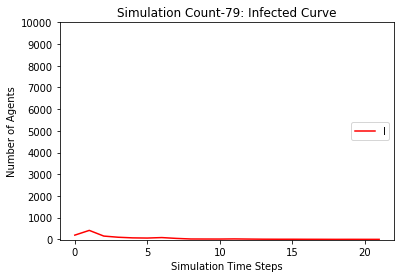

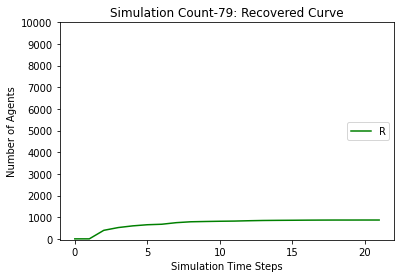

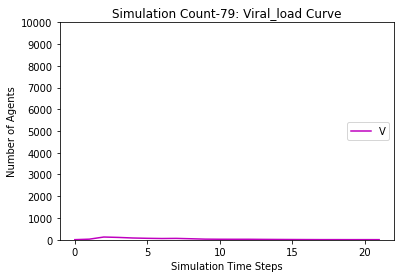

[9806, 9596, 9464, 9375, 9319, 9295, 9262, 9245, 9232, 9215, 9199, 9189, 9176, 9164, 9153, 9146, 9142, 9137, 9137, 9136, 9136, 9135, 9135, 9134, 9134, 9132, 9129, 9128, 9128, 9127, 9126, 9124, 9124, 9123, 9123]
[194, 404, 153, 108, 70, 36, 57, 26, 21, 27, 24, 15, 20, 25, 19, 13, 6, 5, 2, 3, 2, 1, 0, 1, 1, 3, 3, 1, 0, 1, 2, 4, 1, 1, 0]
[0, 0, 383, 517, 611, 669, 681, 729, 747, 758, 777, 796, 804, 811, 828, 841, 852, 858, 861, 861, 862, 864, 865, 865, 865, 865, 868, 871, 872, 872, 872, 872, 875, 876, 877]
[0.0, 28.0, 125.0, 105.5, 88.75, 67.375, 52.6875, 40.34375, 31.171875, 25.5859375, 20.79296875, 18.396484375, 16.1982421875, 19.09912109375, 15.549560546875, 12.7747802734375, 12.38739013671875, 10.193695068359375, 7.0968475341796875, 3.5484237670898438, 2.774211883544922, 1.387105941772461, 1.6935529708862305, 0.8467764854431152, 0.4233882427215576, 1.2116941213607788, 1.6058470606803894, 1.8029235303401947, 1.9014617651700974, 0.9507308825850487, 0.47536544129252434, 1.237682720646262

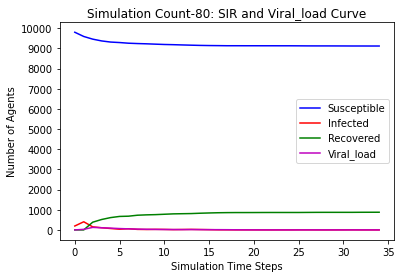

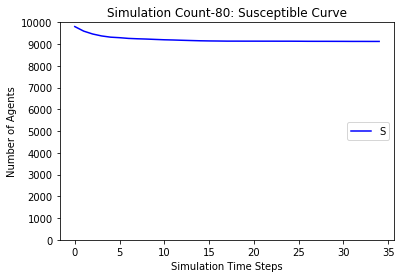

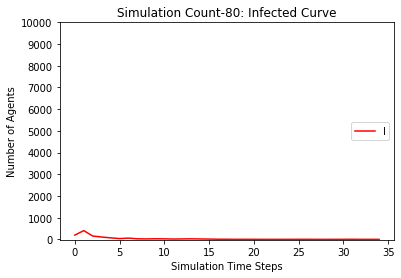

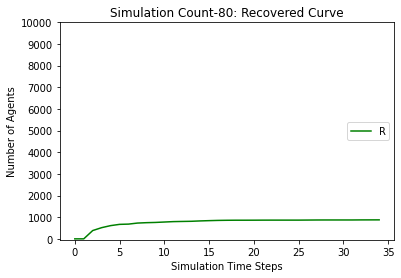

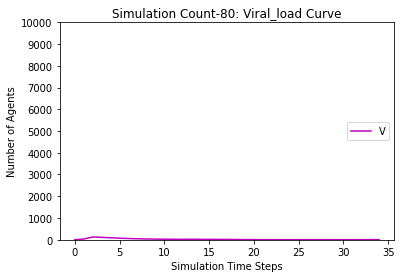

[9806, 9586, 9472, 9417, 9366, 9336, 9321, 9306, 9294, 9285, 9281, 9278, 9276, 9276, 9275, 9272, 9266, 9260, 9257, 9257, 9257, 9257]
[194, 414, 130, 69, 67, 41, 22, 18, 16, 11, 4, 4, 2, 0, 1, 4, 9, 8, 5, 0, 0, 0]
[0, 0, 398, 514, 567, 623, 657, 676, 690, 704, 715, 718, 722, 724, 724, 724, 725, 732, 738, 743, 743, 743]
[0.0, 25.0, 105.5, 98.75, 71.375, 60.6875, 40.34375, 29.171875, 25.5859375, 19.79296875, 11.896484375, 5.9482421875, 5.97412109375, 4.987060546875, 2.4935302734375, 2.24676513671875, 4.123382568359375, 8.061691284179688, 7.030845642089844, 3.515422821044922, 1.757711410522461, 0.8788557052612305]
2739.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616,

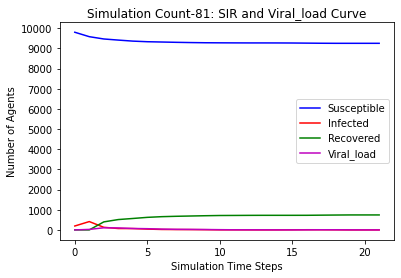

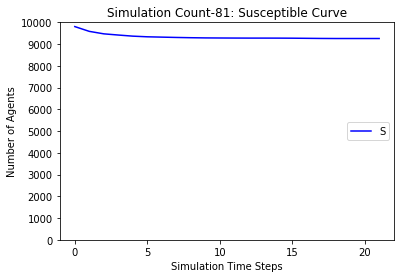

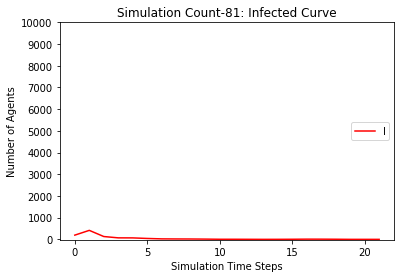

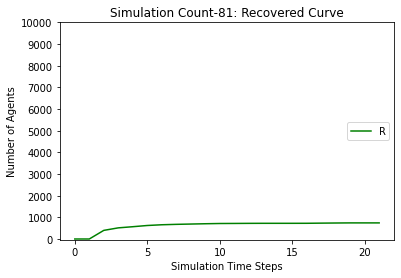

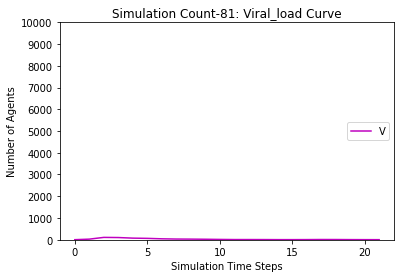

[9806, 9578, 9439, 9349, 9300, 9271, 9227, 9199, 9181, 9172, 9168, 9162, 9157, 9154, 9151, 9144, 9142, 9140, 9140, 9138, 9137, 9137, 9137]
[194, 422, 161, 111, 66, 48, 85, 35, 23, 11, 6, 9, 7, 5, 5, 9, 4, 3, 1, 2, 1, 0, 0]
[0, 0, 400, 540, 634, 681, 688, 766, 796, 817, 826, 829, 836, 841, 844, 847, 854, 857, 859, 860, 862, 863, 863]
[0.0, 33.0, 129.5, 112.75, 84.375, 57.1875, 47.59375, 53.796875, 37.8984375, 26.94921875, 17.474609375, 9.7373046875, 6.86865234375, 6.434326171875, 6.2171630859375, 4.10858154296875, 4.054290771484375, 3.0271453857421875, 2.5135726928710938, 2.256786346435547, 2.1283931732177734, 1.0641965866088867, 0.5320982933044434]
1957.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189

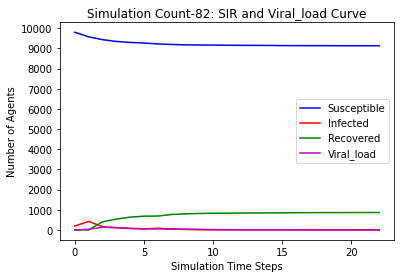

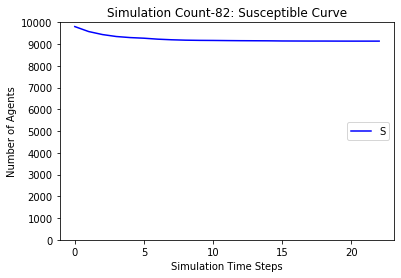

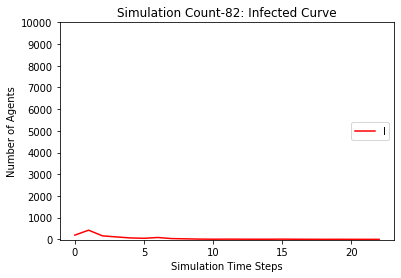

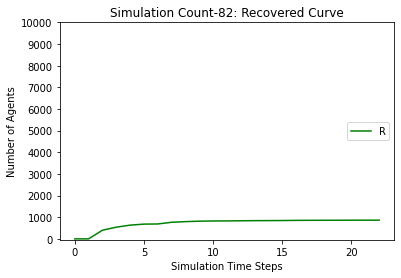

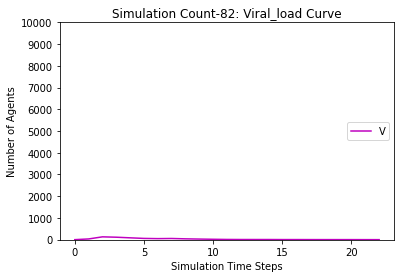

[9806, 9631, 9534, 9474, 9424, 9398, 9378, 9353, 9341, 9330, 9325, 9321, 9319, 9318, 9316, 9313, 9310, 9309, 9306, 9305, 9305, 9304, 9302, 9301, 9299, 9299, 9298, 9298, 9297, 9297, 9296, 9295, 9294, 9294, 9293, 9293]
[194, 369, 125, 77, 65, 44, 39, 42, 17, 15, 8, 7, 6, 3, 4, 4, 3, 2, 4, 1, 0, 1, 2, 1, 2, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0]
[0, 0, 341, 449, 511, 558, 583, 605, 642, 655, 667, 672, 675, 679, 680, 683, 687, 689, 690, 694, 695, 695, 696, 698, 699, 701, 701, 702, 702, 703, 703, 704, 705, 706, 706, 707]
[0.0, 24.0, 104.0, 88.0, 62.0, 48.0, 35.0, 30.5, 28.25, 20.125, 15.0625, 9.53125, 7.765625, 5.8828125, 4.94140625, 4.470703125, 4.2353515625, 5.11767578125, 2.558837890625, 2.2794189453125, 2.13970947265625, 1.069854736328125, 1.5349273681640625, 1.7674636840820312, 1.8837318420410156, 2.941865921020508, 1.470932960510254, 1.735466480255127, 0.8677332401275635, 1.4338666200637817, 0.7169333100318909, 1.3584666550159454, 1.6792333275079727, 1.8396166637539864, 0.9198083318769932, 

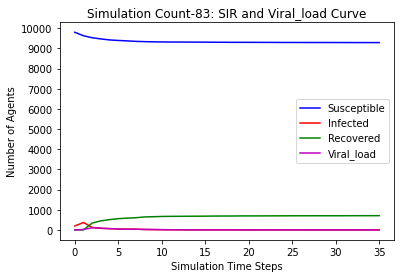

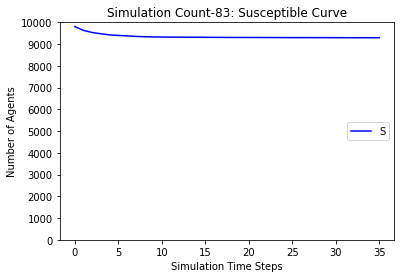

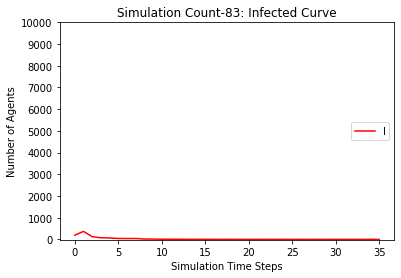

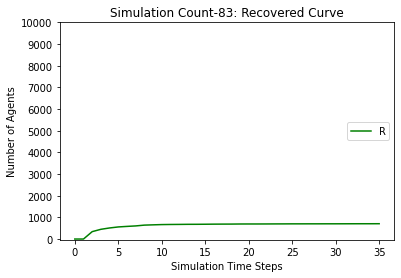

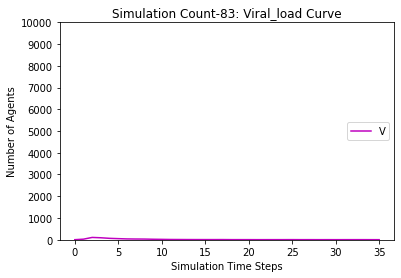

[9806, 9590, 9462, 9381, 9333, 9295, 9253, 9229, 9214, 9201, 9192, 9178, 9168, 9166, 9165, 9164, 9164, 9164]
[194, 410, 147, 106, 63, 47, 73, 35, 24, 18, 13, 20, 12, 2, 1, 1, 0, 0]
[0, 0, 391, 513, 604, 658, 674, 736, 762, 781, 795, 802, 820, 832, 834, 835, 836, 836]
[0.0, 26.0, 136.0, 105.0, 88.5, 71.25, 55.625, 50.8125, 38.40625, 30.203125, 21.1015625, 14.55078125, 13.275390625, 13.6376953125, 7.81884765625, 3.909423828125, 1.9547119140625, 0.97735595703125]
1973.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 9373, 9337, 9300, 9276, 

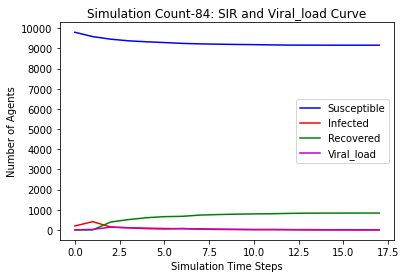

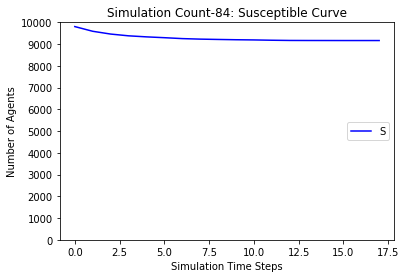

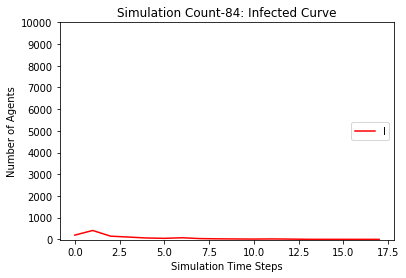

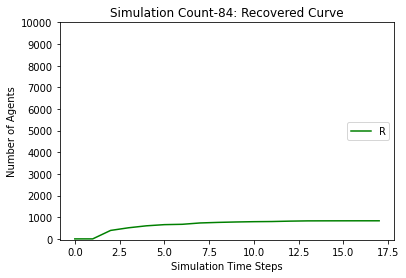

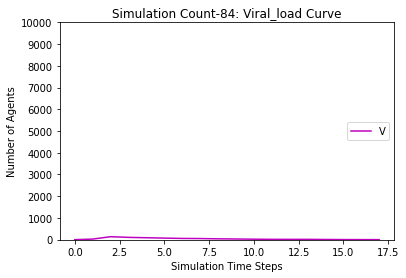

[9806, 9588, 9459, 9383, 9334, 9304, 9271, 9245, 9234, 9225, 9219, 9217, 9216, 9214, 9213, 9209, 9209, 9209, 9209, 9209]
[194, 412, 148, 95, 68, 49, 53, 36, 14, 11, 6, 3, 2, 4, 2, 4, 1, 1, 1, 0]
[0, 0, 393, 522, 598, 647, 676, 719, 752, 764, 775, 780, 782, 782, 785, 787, 790, 790, 790, 791]
[0.0, 28.0, 109.0, 100.5, 82.25, 62.125, 50.0625, 42.03125, 31.015625, 18.5078125, 11.25390625, 9.626953125, 5.8134765625, 3.90673828125, 2.953369140625, 2.4766845703125, 2.23834228515625, 1.119171142578125, 0.5595855712890625, 0.27979278564453125]
849.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305,

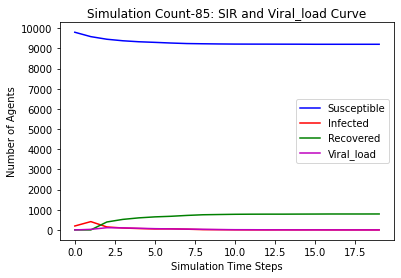

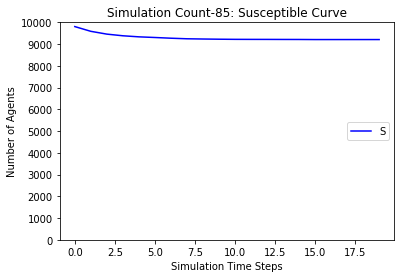

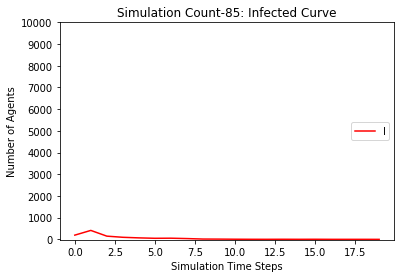

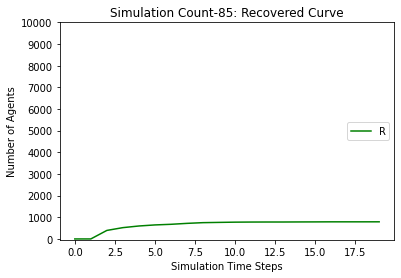

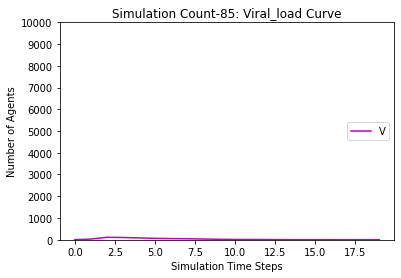

[9806, 9584, 9459, 9367, 9303, 9255, 9202, 9164, 9138, 9120, 9109, 9094, 9090, 9083, 9077, 9072, 9065, 9062, 9061, 9060, 9057, 9056, 9056, 9056]
[194, 416, 151, 123, 89, 62, 97, 49, 38, 25, 20, 27, 4, 9, 8, 7, 9, 3, 1, 1, 4, 5, 0, 0]
[0, 0, 390, 510, 608, 683, 701, 787, 824, 855, 871, 879, 906, 908, 915, 921, 926, 935, 938, 939, 939, 939, 944, 944]
[0.0, 28.0, 129.0, 114.5, 96.25, 76.125, 59.0625, 66.53125, 48.265625, 38.1328125, 32.06640625, 18.033203125, 13.0166015625, 9.50830078125, 9.754150390625, 8.8770751953125, 6.43853759765625, 9.219268798828125, 5.6096343994140625, 2.8048171997070312, 1.4024085998535156, 0.7012042999267578, 1.350602149963379, 0.6753010749816895]
1092.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192,

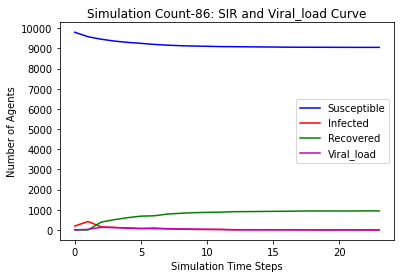

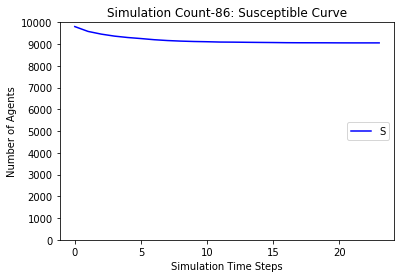

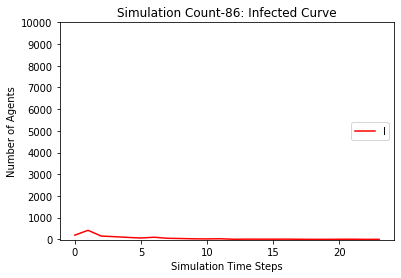

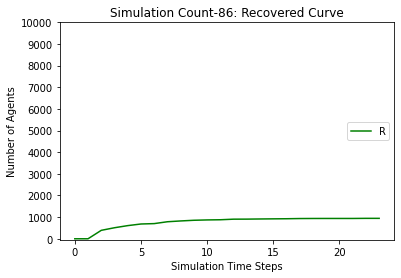

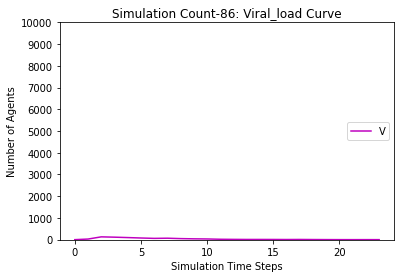

[9806, 9589, 9477, 9392, 9346, 9312, 9288, 9274, 9267, 9257, 9251, 9242, 9235, 9226, 9222, 9220, 9220, 9219, 9219, 9217, 9216, 9216, 9216]
[194, 411, 135, 102, 62, 44, 49, 20, 12, 17, 12, 11, 9, 12, 4, 2, 0, 1, 0, 2, 1, 0, 0]
[0, 0, 388, 506, 592, 644, 663, 706, 721, 726, 737, 747, 756, 762, 774, 778, 780, 780, 781, 781, 783, 784, 784]
[0.0, 30.0, 118.0, 103.0, 79.5, 66.75, 48.375, 39.1875, 25.59375, 16.796875, 14.3984375, 13.19921875, 12.599609375, 8.2998046875, 9.14990234375, 4.574951171875, 2.2874755859375, 1.14373779296875, 1.571868896484375, 0.7859344482421875, 0.39296722412109375, 1.1964836120605469, 0.5982418060302734]
2049.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 918

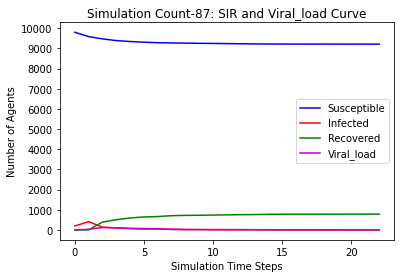

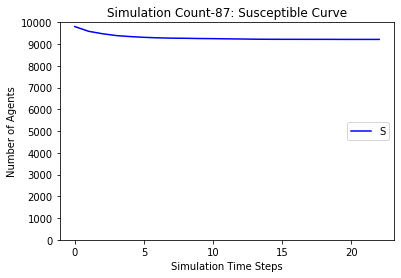

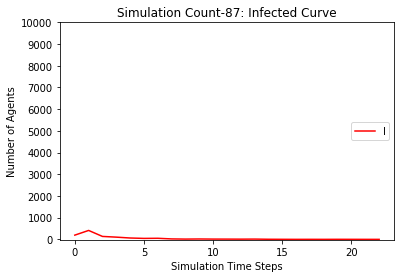

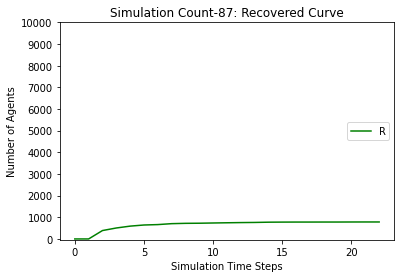

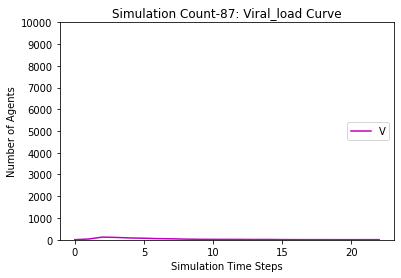

[9806, 9602, 9491, 9430, 9387, 9357, 9333, 9314, 9305, 9300, 9299, 9297, 9295, 9294, 9294, 9294]
[194, 398, 128, 79, 59, 41, 32, 26, 11, 7, 3, 4, 3, 1, 0, 0]
[0, 0, 381, 491, 554, 602, 635, 660, 684, 693, 698, 699, 702, 705, 706, 706]
[0.0, 19.0, 114.5, 93.25, 67.625, 52.8125, 38.40625, 31.203125, 25.6015625, 15.80078125, 8.900390625, 4.4501953125, 2.22509765625, 3.112548828125, 1.5562744140625, 0.77813720703125]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 9373, 9337, 9300, 9276, 9263, 9254, 9245, 9240, 9237, 9233, 9228, 9227, 

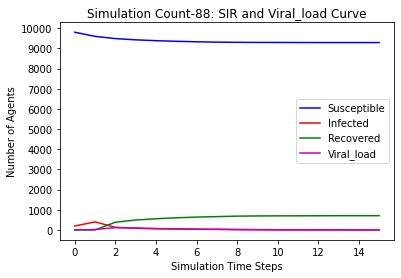

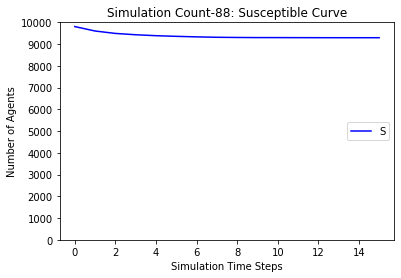

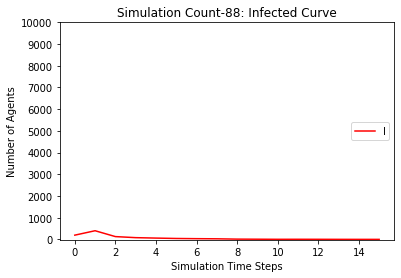

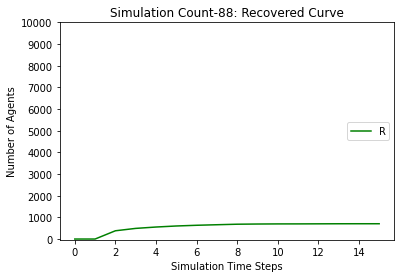

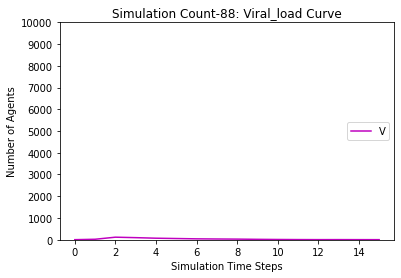

[9806, 9597, 9486, 9417, 9372, 9346, 9314, 9293, 9271, 9254, 9251, 9248, 9245, 9243, 9241, 9241, 9241, 9241]
[194, 403, 136, 85, 59, 44, 49, 33, 30, 22, 6, 4, 3, 2, 3, 0, 0, 0]
[0, 0, 378, 498, 569, 610, 637, 674, 699, 724, 743, 748, 752, 755, 756, 759, 759, 759]
[0.0, 21.0, 109.5, 97.75, 73.875, 55.9375, 40.96875, 35.484375, 32.7421875, 23.37109375, 15.685546875, 9.8427734375, 5.92138671875, 3.960693359375, 3.9803466796875, 2.99017333984375, 1.495086669921875, 0.7475433349609375]
2143.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 937

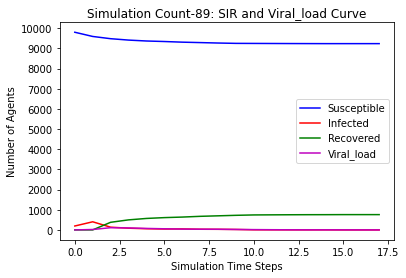

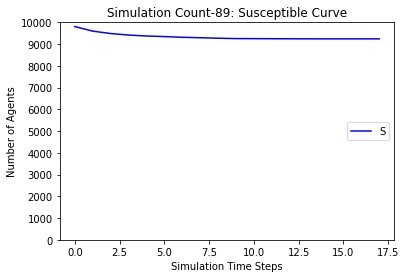

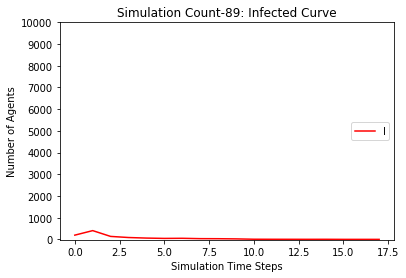

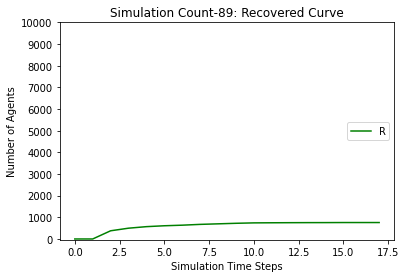

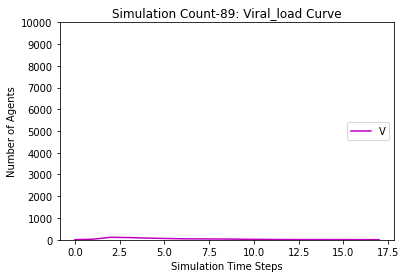

[9806, 9589, 9471, 9410, 9383, 9359, 9341, 9318, 9311, 9306, 9301, 9295, 9292, 9290, 9286, 9283, 9282, 9279, 9276, 9273, 9272, 9268, 9267, 9264, 9262, 9261, 9261, 9261]
[194, 411, 136, 73, 42, 40, 37, 31, 10, 10, 7, 9, 5, 5, 5, 6, 3, 5, 5, 5, 2, 5, 3, 5, 4, 1, 0, 0]
[0, 0, 393, 517, 575, 601, 622, 651, 679, 684, 692, 696, 703, 705, 709, 711, 715, 716, 719, 722, 726, 727, 730, 731, 734, 738, 739, 739]
[0.0, 23.0, 114.5, 80.25, 57.125, 46.5625, 33.28125, 30.640625, 25.3203125, 15.66015625, 9.830078125, 5.9150390625, 4.95751953125, 4.478759765625, 3.2393798828125, 3.61968994140625, 4.809844970703125, 4.4049224853515625, 5.202461242675781, 4.601230621337891, 4.300615310668945, 3.1503076553344727, 2.5751538276672363, 1.2875769138336182, 2.643788456916809, 2.3218942284584045, 1.1609471142292023, 0.5804735571146011]
2157.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135

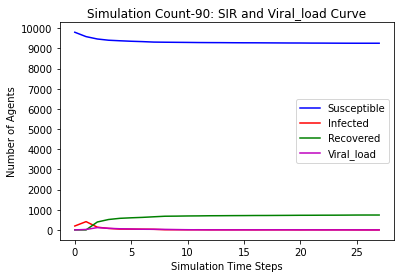

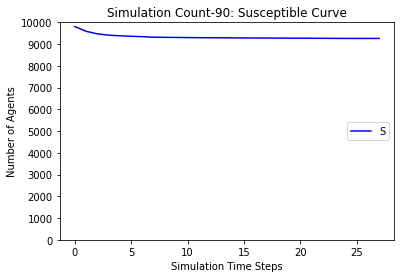

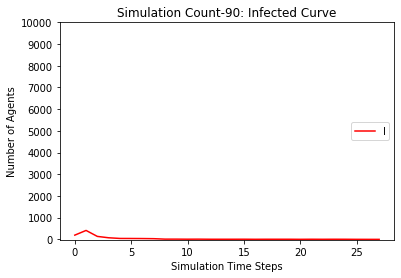

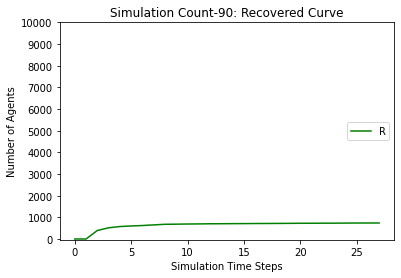

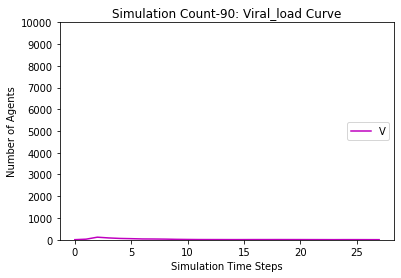

[9806, 9581, 9431, 9341, 9291, 9261, 9214, 9190, 9178, 9167, 9159, 9154, 9152, 9146, 9136, 9130, 9123, 9118, 9117, 9117, 9115, 9111, 9111, 9111, 9109, 9104, 9103, 9100, 9099, 9099, 9098, 9097, 9094, 9090, 9087, 9087, 9086, 9086, 9085, 9084, 9083, 9082, 9082]
[194, 419, 179, 113, 67, 45, 81, 28, 16, 14, 10, 7, 3, 9, 13, 6, 12, 5, 3, 3, 5, 7, 0, 0, 2, 5, 1, 4, 1, 1, 2, 3, 4, 6, 3, 0, 1, 0, 1, 1, 1, 2, 0]
[0, 0, 390, 546, 642, 694, 705, 782, 806, 819, 831, 839, 845, 845, 851, 864, 865, 877, 880, 880, 880, 882, 889, 889, 889, 891, 896, 896, 900, 900, 900, 900, 902, 904, 910, 913, 913, 914, 914, 915, 916, 916, 918]
[0.0, 34.0, 143.0, 117.5, 94.75, 71.375, 50.6875, 49.34375, 33.671875, 23.8359375, 17.91796875, 11.958984375, 7.9794921875, 5.98974609375, 8.994873046875, 12.4974365234375, 8.24871826171875, 6.124359130859375, 7.0621795654296875, 3.5310897827148438, 1.7655448913574219, 2.882772445678711, 2.4413862228393555, 1.2206931114196777, 0.6103465557098389, 1.3051732778549194, 1.65258663892

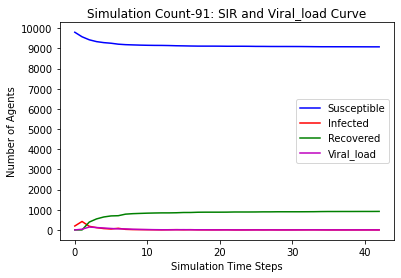

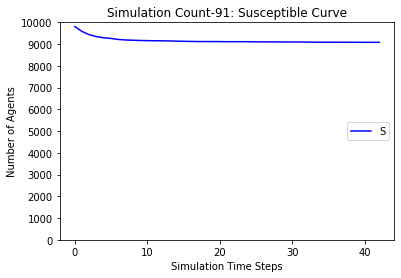

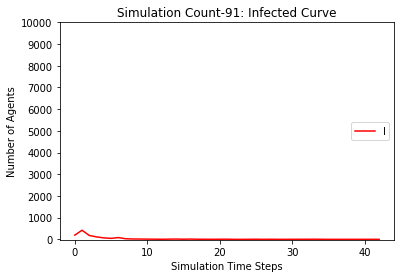

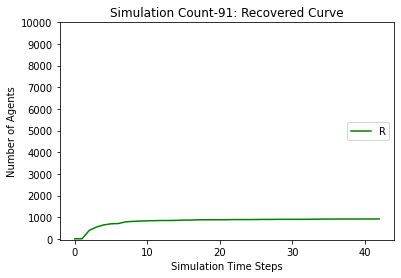

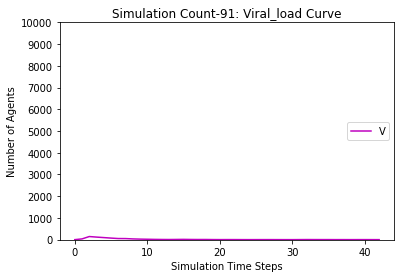

[9806, 9578, 9461, 9381, 9333, 9289, 9248, 9218, 9198, 9183, 9174, 9161, 9155, 9152, 9150, 9150, 9150, 9150, 9147, 9146, 9144, 9142, 9140, 9140, 9140, 9139, 9138, 9135, 9133, 9131, 9129, 9126, 9126, 9125, 9125]
[194, 422, 130, 103, 62, 63, 76, 35, 25, 23, 14, 23, 7, 4, 3, 0, 0, 0, 3, 1, 3, 5, 2, 0, 0, 1, 1, 3, 2, 3, 2, 3, 0, 1, 0]
[0, 0, 409, 516, 605, 648, 676, 747, 777, 794, 812, 816, 838, 844, 847, 850, 850, 850, 850, 853, 853, 853, 858, 860, 860, 860, 861, 862, 865, 866, 869, 871, 874, 874, 875]
[0.0, 31.0, 129.5, 101.75, 82.875, 61.4375, 56.71875, 52.359375, 40.1796875, 28.08984375, 25.044921875, 16.5224609375, 19.26123046875, 10.630615234375, 8.3153076171875, 5.15765380859375, 2.578826904296875, 1.2894134521484375, 0.6447067260742188, 3.3223533630371094, 2.6611766815185547, 1.3305883407592773, 2.6652941703796387, 3.3326470851898193, 1.6663235425949097, 0.8331617712974548, 1.4165808856487274, 1.7082904428243637, 3.854145221412182, 3.927072610706091, 4.9635363053530455, 4.481768152

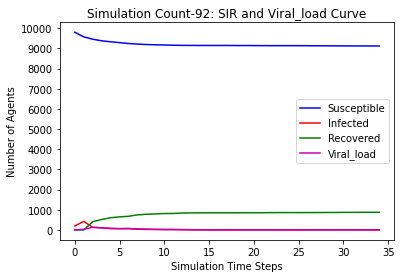

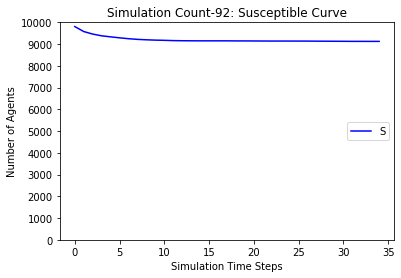

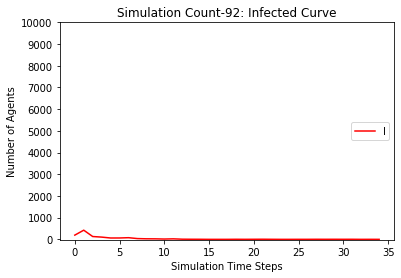

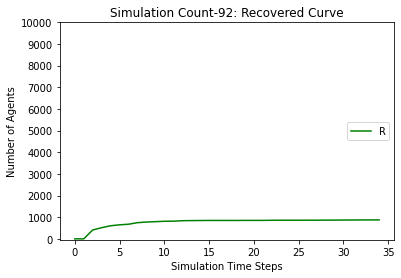

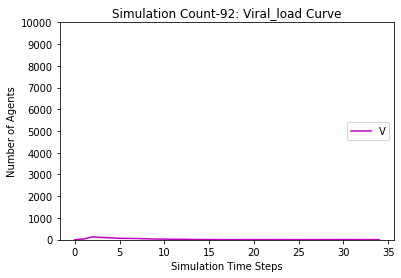

[9806, 9595, 9470, 9400, 9349, 9318, 9284, 9252, 9232, 9223, 9217, 9213, 9210, 9208, 9208, 9207, 9206, 9206, 9206, 9206]
[194, 405, 139, 88, 61, 51, 65, 40, 26, 15, 12, 7, 5, 2, 0, 1, 2, 0, 0, 0]
[0, 0, 391, 512, 590, 631, 651, 708, 742, 762, 771, 780, 785, 790, 792, 792, 792, 794, 794, 794]
[0.0, 33.0, 123.5, 98.75, 79.375, 63.6875, 47.84375, 49.921875, 38.9609375, 26.48046875, 17.240234375, 12.6201171875, 8.31005859375, 6.155029296875, 4.0775146484375, 2.03875732421875, 2.019378662109375, 2.0096893310546875, 1.0048446655273438, 0.5024223327636719]
794.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 93

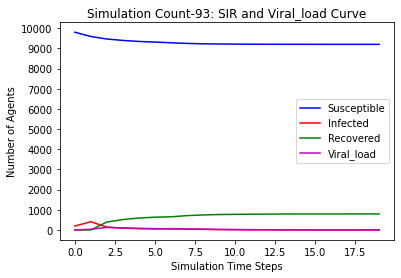

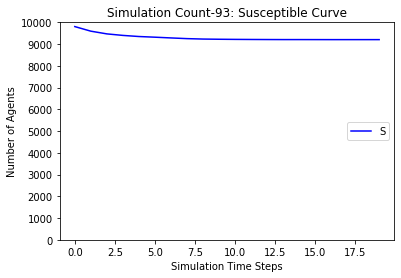

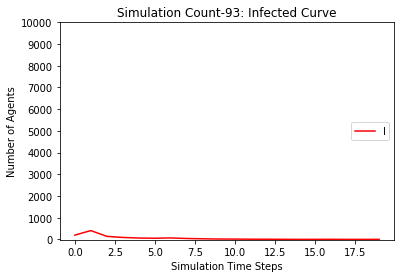

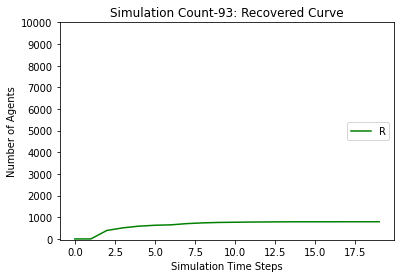

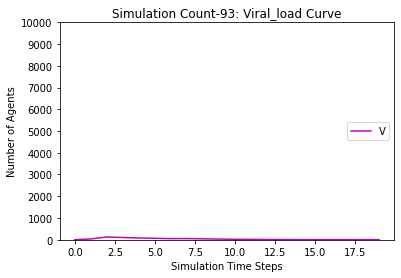

[9806, 9620, 9519, 9458, 9416, 9376, 9347, 9337, 9328, 9327, 9321, 9316, 9315, 9314, 9314, 9314, 9314]
[194, 380, 127, 85, 58, 56, 41, 14, 11, 4, 8, 6, 1, 1, 0, 0, 0]
[0, 0, 354, 457, 526, 568, 612, 649, 661, 669, 671, 678, 684, 685, 686, 686, 686]
[0.0, 16.0, 91.0, 83.5, 71.75, 54.875, 46.4375, 35.21875, 18.609375, 11.3046875, 8.65234375, 7.326171875, 6.6630859375, 3.33154296875, 2.665771484375, 1.3328857421875, 0.66644287109375]
2787.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 9326, 9320, 9316, 9312, 9309, 9305, 9305, 9303, 9303, 9303], [9806, 9582, 9469, 9415, 9373, 9337, 9300, 9276, 9263, 9254, 9245, 9240, 9237, 

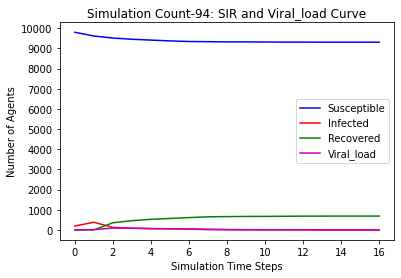

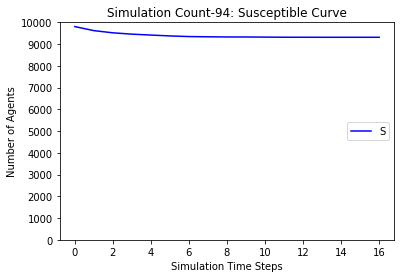

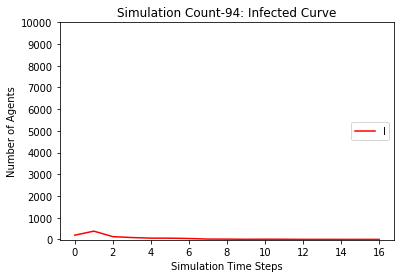

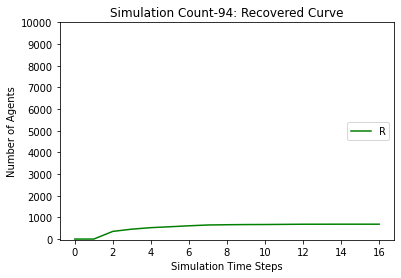

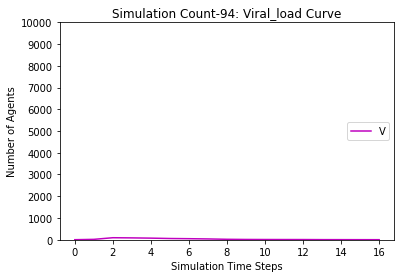

[9806, 9591, 9465, 9399, 9354, 9321, 9296, 9280, 9260, 9247, 9242, 9239, 9238, 9237, 9233, 9233, 9233, 9232, 9231, 9231, 9231]
[194, 409, 147, 86, 58, 49, 52, 22, 29, 17, 6, 3, 1, 1, 4, 0, 0, 1, 1, 0, 0]
[0, 0, 388, 515, 588, 630, 652, 698, 711, 736, 752, 758, 761, 762, 763, 767, 767, 767, 768, 769, 769]
[0.0, 31.0, 108.5, 99.25, 78.625, 56.3125, 40.15625, 35.078125, 26.5390625, 24.26953125, 16.134765625, 11.0673828125, 7.53369140625, 4.766845703125, 3.3834228515625, 2.69171142578125, 1.345855712890625, 0.6729278564453125, 1.3364639282226562, 1.6682319641113281, 0.8341159820556641]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378

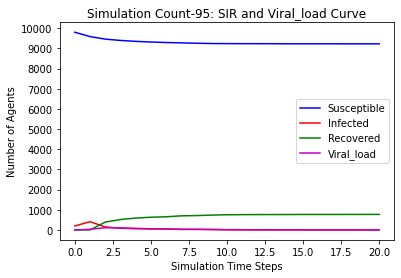

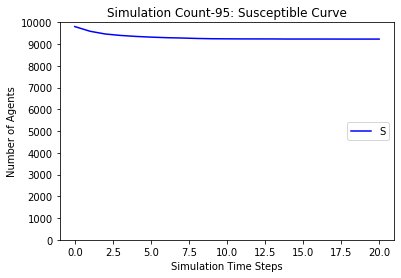

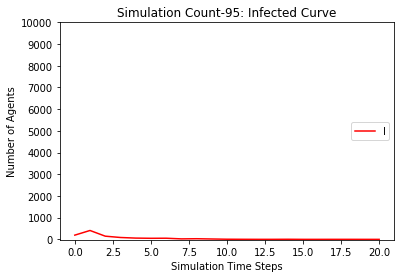

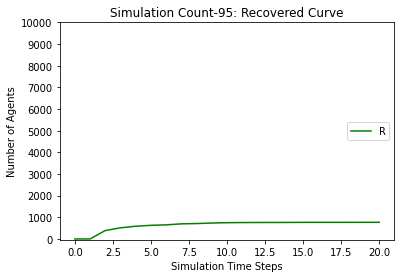

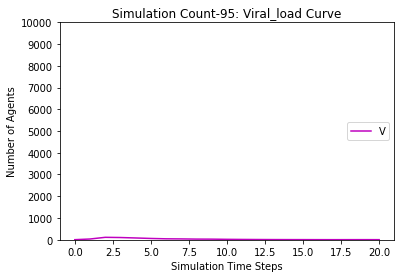

[9806, 9589, 9483, 9424, 9388, 9354, 9318, 9293, 9267, 9249, 9239, 9232, 9225, 9216, 9212, 9207, 9205, 9204, 9203, 9202, 9201, 9201, 9201]
[194, 411, 129, 73, 52, 49, 57, 35, 31, 22, 15, 9, 9, 10, 6, 8, 2, 1, 2, 1, 1, 0, 0]
[0, 0, 388, 503, 560, 597, 625, 672, 702, 729, 746, 759, 766, 774, 782, 785, 793, 795, 795, 797, 798, 799, 799]
[0.0, 24.0, 103.0, 100.5, 66.25, 52.125, 51.0625, 46.53125, 41.265625, 33.6328125, 22.81640625, 16.408203125, 14.2041015625, 11.10205078125, 9.551025390625, 6.7755126953125, 5.38775634765625, 3.693878173828125, 1.8469390869140625, 1.9234695434570312, 1.9617347717285156, 1.9808673858642578, 0.9904336929321289]
2035.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 91

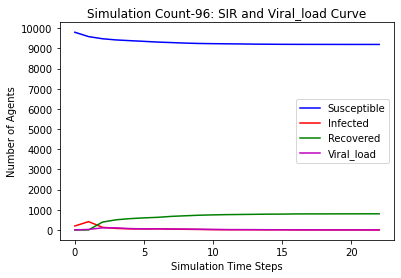

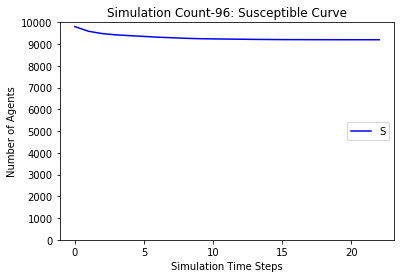

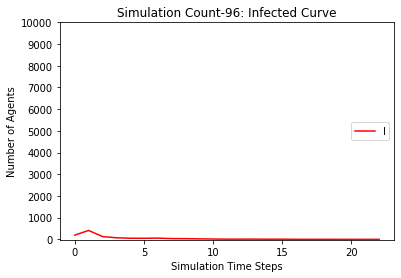

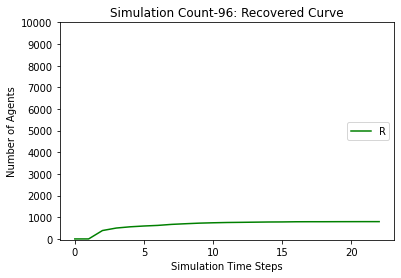

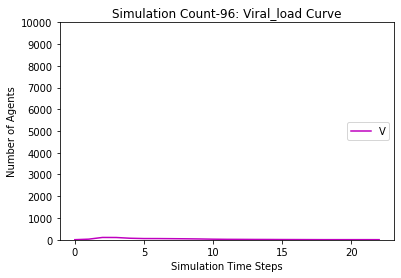

[9806, 9591, 9460, 9368, 9316, 9281, 9236, 9207, 9192, 9179, 9171, 9161, 9155, 9153, 9147, 9145, 9145, 9145, 9142, 9139, 9139, 9134, 9131, 9131, 9131, 9131]
[194, 409, 156, 116, 66, 47, 75, 38, 24, 18, 9, 15, 9, 5, 8, 4, 0, 0, 3, 4, 2, 7, 3, 0, 0, 0]
[0, 0, 384, 516, 618, 672, 689, 755, 784, 803, 820, 824, 836, 842, 845, 851, 855, 855, 855, 857, 859, 859, 866, 869, 869, 869]
[0.0, 32.0, 130.0, 111.0, 98.5, 78.25, 56.125, 53.0625, 37.53125, 27.765625, 18.8828125, 13.44140625, 12.720703125, 9.3603515625, 4.68017578125, 4.340087890625, 2.1700439453125, 1.08502197265625, 0.542510986328125, 3.2712554931640625, 4.635627746582031, 2.3178138732910156, 3.158906936645508, 3.579453468322754, 1.789726734161377, 0.8948633670806885]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221

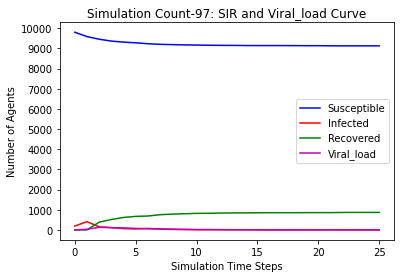

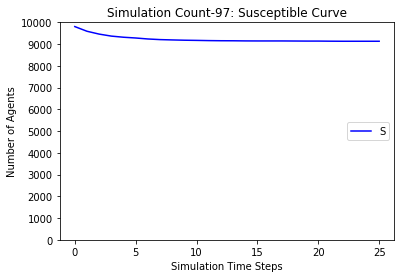

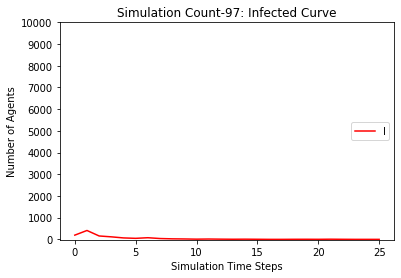

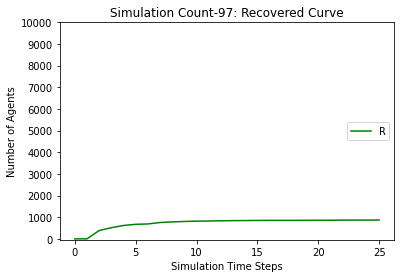

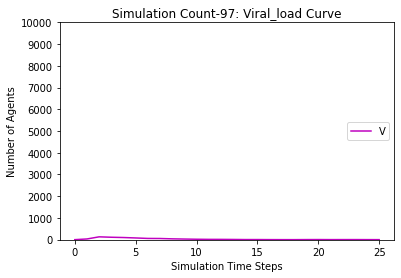

[9806, 9585, 9460, 9385, 9317, 9274, 9228, 9205, 9189, 9173, 9162, 9154, 9148, 9142, 9140, 9139, 9137, 9137, 9135, 9134, 9131, 9129, 9126, 9125, 9124, 9123, 9123, 9122, 9122, 9122]
[194, 415, 154, 99, 82, 61, 83, 33, 21, 19, 17, 12, 9, 6, 2, 1, 2, 0, 2, 1, 4, 4, 4, 1, 1, 1, 0, 1, 0, 0]
[0, 0, 386, 516, 601, 665, 689, 762, 790, 808, 821, 834, 843, 852, 858, 860, 861, 863, 863, 865, 865, 867, 870, 874, 875, 876, 877, 877, 878, 878]
[0.0, 26.0, 115.0, 103.5, 89.75, 72.875, 54.4375, 49.21875, 39.609375, 28.8046875, 20.40234375, 17.201171875, 12.6005859375, 8.30029296875, 6.150146484375, 4.0750732421875, 3.03753662109375, 2.518768310546875, 1.2593841552734375, 2.6296920776367188, 1.3148460388183594, 4.65742301940918, 3.32871150970459, 3.664355754852295, 1.8321778774261475, 1.9160889387130737, 1.9580444693565369, 0.9790222346782684, 1.4895111173391342, 0.7447555586695671]
594.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9

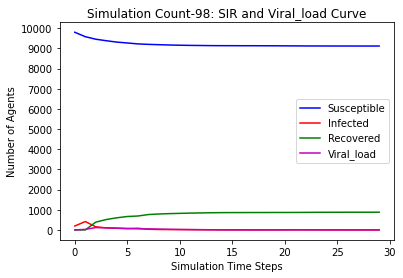

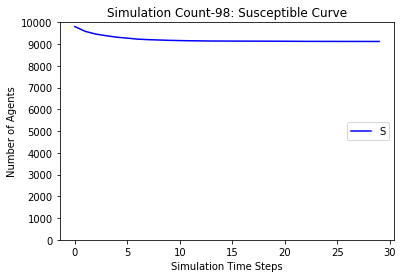

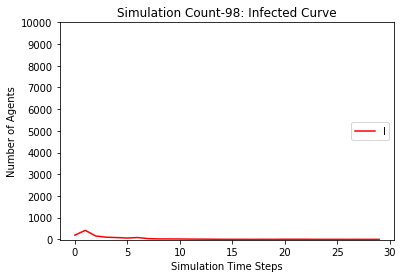

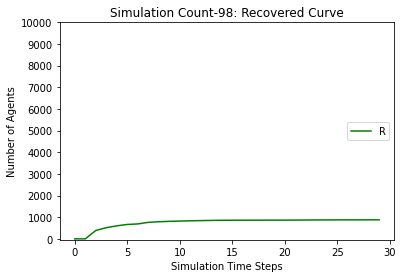

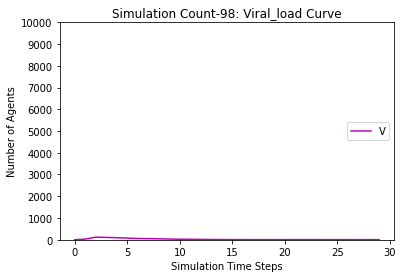

[9806, 9583, 9450, 9367, 9314, 9282, 9250, 9235, 9222, 9216, 9209, 9202, 9196, 9192, 9190, 9189, 9187, 9184, 9183, 9183, 9183]
[194, 417, 153, 103, 68, 44, 65, 20, 14, 8, 8, 9, 6, 4, 2, 1, 2, 4, 1, 0, 0]
[0, 0, 397, 530, 618, 674, 685, 745, 764, 776, 783, 789, 798, 804, 808, 810, 811, 812, 816, 817, 817]
[0.0, 30.0, 143.0, 120.5, 84.25, 60.125, 46.0625, 43.03125, 28.515625, 20.2578125, 15.12890625, 11.564453125, 8.7822265625, 6.39111328125, 5.195556640625, 4.5977783203125, 3.29888916015625, 1.649444580078125, 1.8247222900390625, 1.9123611450195312, 0.9561805725097656]
3333.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 9188, 9186, 9186, 9186], [9806, 9616, 9526, 9461, 9431, 9401, 9378, 9354, 9338, 

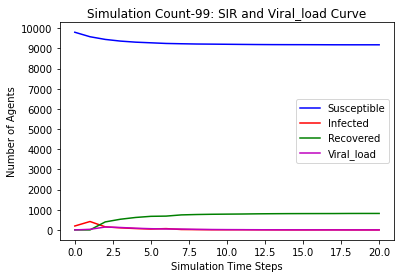

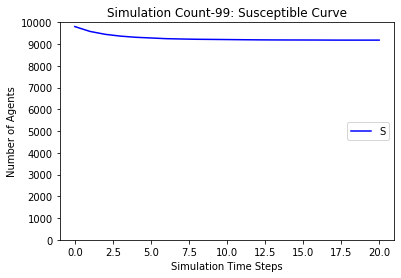

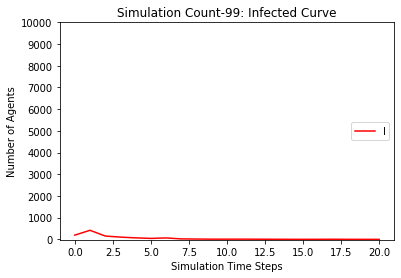

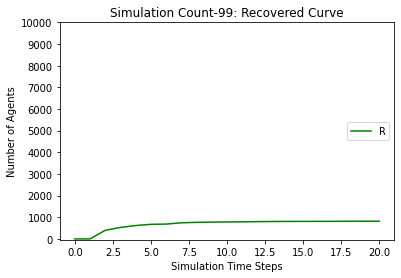

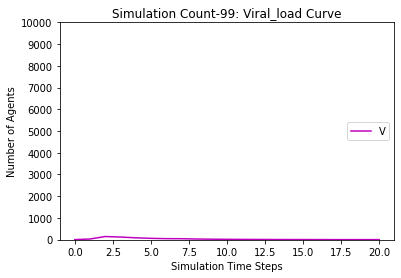

[9806, 9607, 9497, 9421, 9382, 9355, 9334, 9318, 9311, 9306, 9299, 9291, 9286, 9286, 9284, 9282, 9279, 9278, 9277, 9277, 9276, 9276, 9276]
[194, 393, 134, 100, 53, 39, 35, 21, 7, 6, 9, 10, 7, 0, 2, 3, 5, 1, 1, 0, 1, 0, 0]
[0, 0, 369, 479, 565, 606, 631, 661, 682, 688, 692, 699, 707, 714, 714, 715, 716, 721, 722, 723, 723, 724, 724]
[0.0, 17.0, 103.5, 89.75, 77.875, 57.9375, 43.96875, 32.984375, 25.4921875, 17.74609375, 8.873046875, 8.4365234375, 9.21826171875, 6.609130859375, 3.3045654296875, 2.65228271484375, 2.326141357421875, 3.1630706787109375, 2.5815353393554688, 1.2907676696777344, 0.6453838348388672, 1.3226919174194336, 0.6613459587097168]
2189.3333333333335
[[], [9806, 9602, 9483, 9427, 9376, 9343, 9300, 9265, 9245, 9225, 9209, 9201, 9190, 9183, 9177, 9171, 9167, 9163, 9161, 9158, 9151, 9148, 9144, 9141, 9138, 9135, 9135, 9134, 9134, 9133, 9132, 9131, 9131], [9806, 9590, 9451, 9361, 9311, 9279, 9244, 9221, 9211, 9204, 9201, 9199, 9196, 9195, 9193, 9192, 9191, 9189, 9189, 9189, 

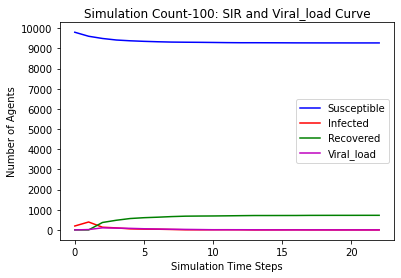

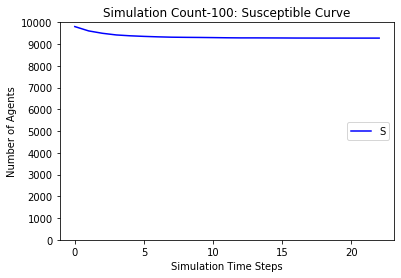

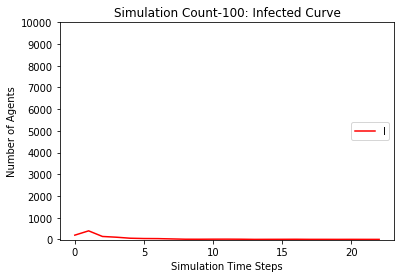

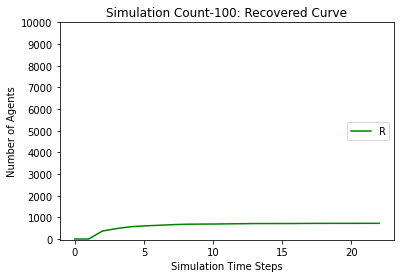

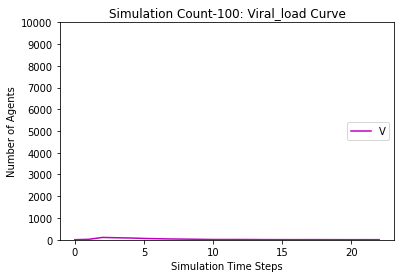

In [10]:
SS,II,RR,VV,TT = [[]],[[]],[[]],[[]],[[]]
for i in range(100):
  j=0
  count_timestep=0
  Node_p=Node.copy()
  Node_n=Node.copy() 
  Agent_p=Agent.copy()
  Agent_n=Agent.copy()
  num_tests_p=NUM_TESTS
  num_tests_n=NUM_TESTS 
  Sj,Ij,Rj,ISOLATED_Ij,Vj = Count_SIR_Node(Node_n) 
  #print([Sj,Ij,Rj]) 
  S,I,R,V,T = [],[],[],[],[]
  S.append(Sj)
  I.append(Ij)
  R.append(Rj)
  V.append(Vj)
  T.append(j)

  while Ij > 0 or Vj >= 1 :
    Node_p,Node_n,Agent_p,Agent_n,num_tests_n = random_walk(Graph,GraphN,Node_n,Agent_n,1,1,num_tests_n)
    count_timestep=count_timestep+1
    if count_timestep == 5:
      num_tests_n = NUM_TESTS
      count_timestep=0
    #if num_tests_n < K/100:
    #  num_tests_n = NUM_TESTS
    j+=1 
    Sj,Ij,Rj,ISOLATED_Ij,Vj = Count_SIR_Node(Node_n) 
    S.append(Sj)
    I.append(Ij)
    R.append(Rj)
    V.append(Vj)
    T.append(j)
    
  print(S)
  print(I)
  print(R)
  print(V)
  print(num_tests_n)
  SS.append(S)
  II.append(I)
  RR.append(R)
  VV.append(V)
  TT.append(T)
  print(SS)
  print(II)
  print(RR)
  print(VV)
  plt.plot(T, S, 'b', T, I, 'r', T, R, 'g',T, V, 'm')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': SIR and Viral_load Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Susceptible", "Infected", "Recovered", "Viral_load"),loc='center right')
  plt.show()  
  
  plt.plot(T, S, 'b')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Susceptible Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Susceptible"),loc='center right')
  plt.show()

  plt.plot(T, I, 'r')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Infected Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Infected"),loc='center right')
  plt.show()

  plt.plot(T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Recovered Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Recovered"),loc='center right')
  plt.show()  

  plt.plot(T, V, 'm')
  plt.xlabel('Simulation Time Steps')
  plt.title('Simulation Count-'+str(i+1)+': Viral_load Curve')
  plt.ylabel('Number of Agents')
  plt.yticks(np.arange(0,K+1, K/10))
  plt.legend(("Viral_load"),loc='center right')
  plt.show()  

Susceptible Average (100 Simulations): [9806, 9585.792188356208, 9457.574535480046, 9377.95748970277, 9322.89004007882, 9287.458673460353, 9250.284422538909, 9230.733697120477, 9215.687267569643, 9205.3476426276, 9197.116585395439, 9189.655230995133, 9183.86385158376, 9179.460587686299, 9176.802418901327, 9175.466704491162]
Infected Average(100 Simulations): [194, 414.2078116437924, 151.34901531405467, 100.79656690283909, 69.66963570206784, 49.408780090784425, 69.49931556374501, 26.658005095827342, 18.629621256722302, 13.229772407292257, 10.806661552666318, 10.298438913985823, 7.065413626133789, 4.854045089865771, 3.0445839517848072, 1.7762902820457838]
Recovered Average(100 Simulations): [0, 0, 391.07644920590093, 521.2459433943902, 607.4403242191115, 663.1325464488634, 680.216261897345, 742.6082977836955, 765.6831111736346, 781.4225849651076, 792.0767530518941, 800.0463300908821, 809.0707347901061, 815.6853672238343, 820.1529971468896, 822.757005226792]
Viral_load Average(100 Simulat

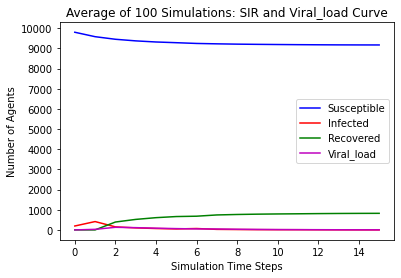

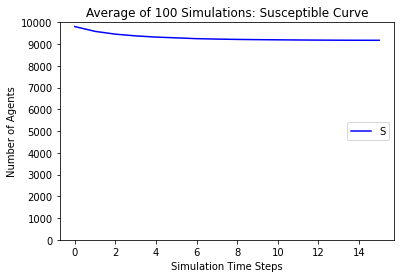

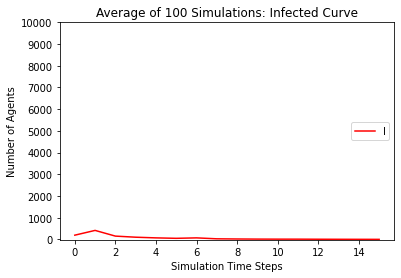

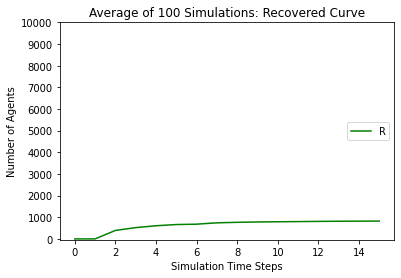

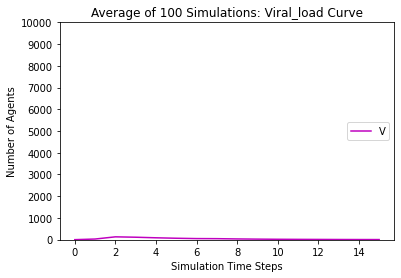

In [11]:
SC = SS[1]
IC = II[1]
RC = RR[1]
VT = VV[1]
TC = TT[1]
for i in range(2,100):
  SC = [mean(i) for i in zip(SC,SS[i])] 
  IC = [mean(i) for i in zip(IC,II[i])] 
  RC = [mean(i) for i in zip(RC,RR[i])] 
  VT = [mean(i) for i in zip(VT,VV[i])] 
  TC = [mean(i) for i in zip(TC,TT[i])] 

print("Susceptible Average (100 Simulations):", SC)
print("Infected Average(100 Simulations):", IC)
print("Recovered Average(100 Simulations):", RC)
print("Viral_load Average(100 Simulations):", VT) 
print("Time Steps:", TC) 



plt.plot(TC, SC, 'b', TC, IC, 'r', TC, RC, 'g', TC, VT, 'm')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: SIR and Viral_load Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Susceptible", "Infected", "Recovered", "Viral_load"),loc='center right')
plt.show()  
  
plt.plot(TC, SC, 'b')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Susceptible Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Susceptible"),loc='center right')
plt.show()

plt.plot(TC, IC, 'r')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Infected Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))

plt.legend(("Infected"),loc='center right')
plt.show()

plt.plot(TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Recovered Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Recovered"),loc='center right')
plt.show()  

plt.plot(TC, VT, 'm')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Simulations: Viral_load Curve')
plt.ylabel('Number of Agents')
plt.yticks(np.arange(0,K+1, K/10))
plt.legend(("Viral_load"),loc='center right')
plt.show() 



  
